# Semantic Segmentation using UNet

# **Import Libraries**

In [3]:
from tensorflow.python import keras
print(keras.__version__)

2.6.0


In [4]:
import tensorflow as tf

In [5]:
print(tf.keras.__version__)

2.12.0


In [6]:
print(tf.__version__)

2.12.0


In [7]:
import os, glob
import cv2, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
#from patchify import patchify
from PIL import Image
#import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.utils import normalize
from tensorflow.keras.models import load_model
from tqdm import tqdm
from random import sample
import pickle
from tensorflow.keras.callbacks import Callback, ModelCheckpoint,  EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from sklearn.preprocessing import LabelEncoder
from keras.utils import normalize
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight

***Getting Colour Labels***

In [8]:
dfs = pd.read_excel("/kaggle/input/new-selected/Selected_category.xlsx","Sheet2")

In [9]:
dfs

,Idx,Ratio,Train,Val,Stuff,"Color_Code (R,G,B)",Color_Code(hex),Color,Name,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,2,0.1072,6046,612,1,"(180, 120, 120)",#B47878,NaN,building,NaN,NaN,NaN,NaN,3.0
1,3,0.0878,8265,796,1,"(6, 230, 230)",#06E6E6,NaN,sky,NaN,NaN,NaN,NaN,NaN
2,5,0.0480,6678,641,0,"(4, 200, 3)",#04C803,NaN,tree,NaN,NaN,NaN,NaN,NaN
3,6,0.0450,6604,643,1,"(120, 120, 80)",#787850,NaN,ceiling,NaN,NaN,NaN,NaN,NaN
4,7,0.0398,4023,408,1,"(140, 140, 140)",#8C8C8C,NaN,road;route,NaN,NaN,NaN,NaN,NaN
5,10,0.0183,2423,225,1,"(4, 250, 7)",#04FA07,NaN,grass,NaN,NaN,NaN,NaN,NaN
6,12,0.0166,3068,310,1,"(235, 255, 7)",#EBFF07,NaN,sidewalk,NaN,NaN,NaN,NaN,NaN
7,13,0.0160,5075,526,0,"(150, 5, 61)",#96053D,NaN,person,NaN,NaN,NaN,NaN,NaN
8,17,0.0109,1691,160,1,"(143, 255, 140)",#8FFF8C,NaN,mountain,NaN,NaN,NaN,NaN,NaN
9,21,0.0098,3164,306,0,"(0, 102, 200)",#0066C8,NaN,car,NaN,NaN,NaN,NaN,NaN


In [10]:
CLASS_COLORS = dict(zip(dfs['Idx'], dfs['Color_Code (R,G,B)']))
CLASS_LABELS = dict(zip(dfs['Idx'], dfs['Name']))
class_name_color =dict( zip(dfs['Name'],  dfs['Color_Code (R,G,B)']))

In [11]:
Label = list(dfs["Name"])
Name =[]

for i in Label:
    Name.append(i)

print(*Name,sep="\n")

building
sky
tree
ceiling
road;route
grass
sidewalk
person
mountain
car
water
house
sea


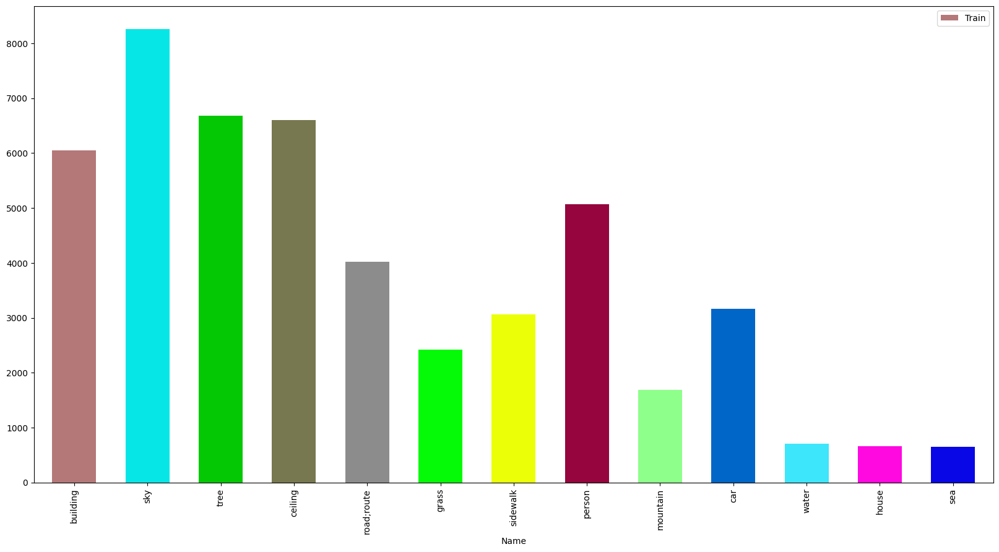

In [17]:
dfs.plot.bar(x="Name",y="Train",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

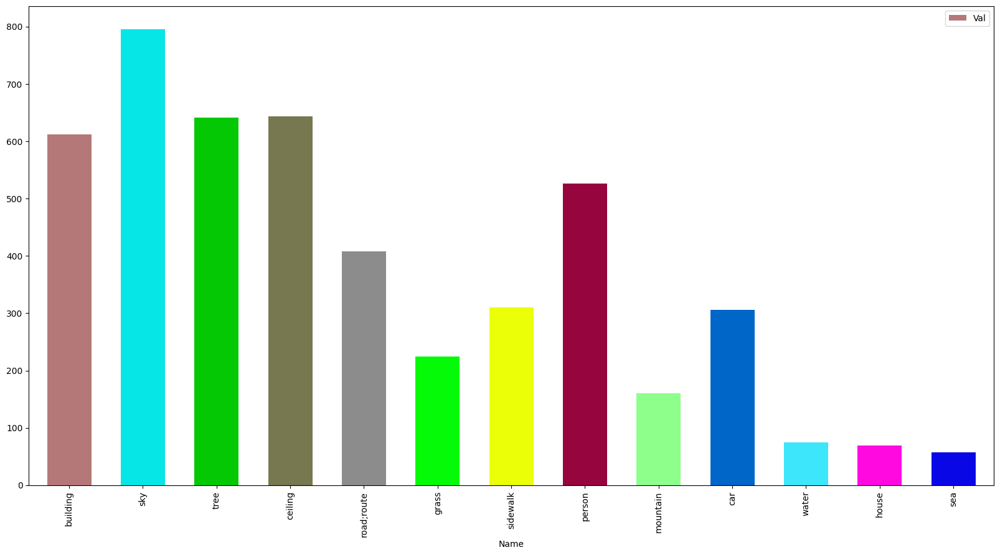

In [16]:
dfs.plot.bar(x="Name",y="Val",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

In [13]:
colors = dfs["Color_Code(hex)"]
colors

0     #B47878
1     #06E6E6
2     #04C803
3     #787850
4     #8C8C8C
5     #04FA07
6     #EBFF07
7     #96053D
8     #8FFF8C
9     #0066C8
10    #3DE6FA
11    #FF09E0
12    #0907E6
Name: Color_Code(hex), dtype: object

In [18]:
class_name_color

{'building': '(180, 120, 120)',
 'sky': '(6, 230, 230)',
 'tree': '(4, 200, 3)',
 'ceiling': '(120, 120, 80)',
 'road;route': '(140, 140, 140)',
 'grass': '(4, 250, 7)',
 'sidewalk': '(235, 255, 7)',
 'person': '(150, 5, 61)',
 'mountain': '(143, 255, 140)',
 'car': '(0, 102, 200)',
 'water': '(61, 230, 250)',
 'house': '(255, 9, 224)',
 'sea': '(9, 7, 230)'}

# **Selecting the Classes and class masks**

**Categories Selected are as follows :**

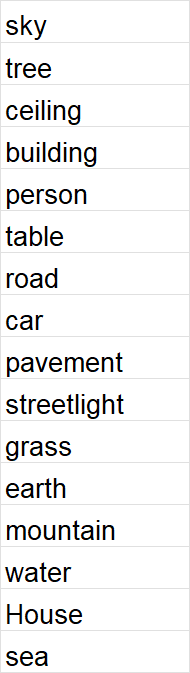

In [19]:
CLASS_LABELS

{2: 'building',
 3: 'sky',
 5: 'tree',
 6: 'ceiling',
 7: 'road;route',
 10: 'grass',
 12: 'sidewalk',
 13: 'person',
 17: 'mountain',
 21: 'car',
 22: 'water',
 26: 'house',
 27: 'sea'}

In [20]:
class_label = {
2: 'building',
3: 'sky',
5: 'tree',
6: 'ceiling',
7: 'road',
10: 'grass',
12: 'sidewalk',
13: 'person',
17: 'mountain',
21: 'car',
22: 'water',
26: 'house',
27: 'sea'}

class_colors = {
    2: (80, 120, 120), 
    3: (6, 230, 230),          
    5: (4, 200, 3),    
    6: (20, 120, 80),    
    7: (140, 140, 140), 
    10: (4, 250, 7), 
    12: (235, 255, 7),
    13: (150, 5, 61),              
    17: (143, 255, 140),    
    21: (0, 102, 200), 
    22: (61, 230, 250),
    26:(255, 9, 224),
    27:(9, 7, 230)              
 
}       

In [21]:
class_colors_keys = list(class_colors.keys())

In [22]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

sky
tree
ceiling
building
person
table
road
car
pavement
streetlight
grass
earth
mountain
water
House
sea

In [23]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

In [254]:
#Training and testing Paths
train_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training"
anno_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training"

In [383]:
image_dataset,mask_dataset,masked_image_dataset = [],[],[]

In [ ]:
image = cv2.flip(src, 0)

In [ ]:
def flip_images():
    np.rot90(img)

In [26]:
def load_images_bw_mask(image_path):
    image = cv2.imread(image_path,0)
    #print(image.shape)
    #image = cv2.cvtColor(image)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image

In [27]:
def load_images_bw(image_path):
    image = cv2.imread(image_path,1)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image


In [28]:
import os
import random

imgExtension = ["png", "jpeg", "jpg"] #Image Extensions to be chosen from
allImages = list()



def chooseRandomImage(directory=train_path):
    for img in os.listdir(directory): #Lists all files
        ext = img.split(".")[len(img.split(".")) - 1]
        if (ext in imgExtension):
            allImages.append(img)
    choice = random.randint(0, len(allImages) - 1)
    chosenImage = allImages[choice] #Do Whatever you want with the image file
    return chosenImage


In [29]:
# File path of the text file to read
file_path = '/kaggle/input/train-data-test-data/train_data.txt'
test_file_path = '/kaggle/input/train-data-test-data/test_data.txt'

# Initialize an empty list to store the file contents
training_images = []
testing_images = []

# Open the file in read mode
with open(file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        training_images.append(line.strip())
        
# Open the file in read mode
with open(test_file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        testing_images.append(line.strip())

# Print the list to verify the contents
print("Contents of the file saved to list:")


Contents of the file saved to list:


In [32]:
print(training_images[0])
print(testing_images[0])

ADE_train_00000567.jpg
ADE_train_00000567.png


In [160]:
for i in range(4000):
    train_image_name = chooseRandomImage()
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    image_name = train_image_name.replace('.jpg', '.png')
    
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    print(image_name)
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        mask_dataset.append(mask)
        masked_image_dataset.append(output)
    
    
    
    

KeyboardInterrupt: 

In [384]:
#Read first required images 
for i in range(6008,8009):
    # Load the segmentation mask
    image_name = 'ADE_train_0000'+str(i)+'.png'
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    #print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = 'ADE_train_0000'+str(i)+'.jpg'
    image = load_images_bw(os.path.join(train_path,train_image_name))
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        mask_dataset.append(mask)
        masked_image_dataset.append(output)
        



73.797607421875
80.43212890625
89.056396484375
97.796630859375
88.079833984375
85.260009765625
78.668212890625
90.3564453125
98.3154296875
98.455810546875
94.90966796875
91.400146484375
96.728515625
69.366455078125
90.386962890625
95.6787109375
78.125
86.46240234375
79.443359375
93.29833984375
73.5107421875
89.422607421875
98.2421875
72.796630859375
73.40087890625
67.584228515625
93.170166015625
77.484130859375
82.16552734375
89.013671875
81.011962890625
92.779541015625
69.012451171875
94.659423828125
97.8515625
78.900146484375
97.900390625
91.11328125
64.630126953125
92.56591796875
64.178466796875
91.595458984375
90.5029296875
88.53759765625
98.162841796875
74.57275390625
93.61572265625
68.402099609375
97.83935546875
89.630126953125
70.880126953125
84.38720703125
93.65234375
98.4375
93.49365234375
74.542236328125
86.553955078125
88.104248046875
93.096923828125
96.923828125
79.8583984375
93.438720703125
77.9541015625
79.010009765625
97.442626953125
93.927001953125
73.66943359375
79.650

In [34]:
#Read first required images 
for i in range(len(training_images)):
    # Load the segmentation mask
    image_name = testing_images[i]
    print(image_name)
    print(os.path.join(anno_path,image_name))
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    print("before: ",np.unique(mask))
    
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
   
    print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = training_images[i]
    print(train_image_name)
    print(os.path.join(train_path,train_image_name))
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    
    #creating a numpy array of image size 
    output = np.zeros_like(image)
    
    # Apply colors to the mask based on class labels
    labels = list(class_colors.values())
    for class_label, color in class_colors.items():
        output[mask == class_label] = color
    
    #Adding Images, masks and Coloured Masks
    image_dataset.append(image[:,:,0])
    mask_dataset.append(mask)
    masked_image_dataset.append(output)
    


ADE_train_00000567.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000567.png
before:  [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 20 22 25 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 22 27]
ADE_train_00000567.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000567.jpg
ADE_train_00000568.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000568.png
before:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 26
 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]
ADE_train_00000568.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000568.jpg
ADE_train_00000569.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000569.png
before:  [ 0  2  3  8  9 10 11 13 14 15 16 17 18 19 20 21 22 24 25 26 27 28 30 31
 32 35]
After :  [ 0  2  3 10 13 17 21 22 26 27]
ADE_tr

In [154]:
#Masked_iamges
masked_image_dataset[0].shape

(128, 128, 3)

In [385]:
len(image_dataset),len(mask_dataset),len(masked_image_dataset)

(1350, 1350, 1350)

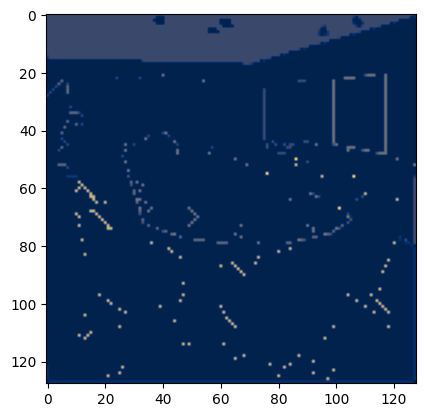

In [386]:
#Mask Image
plt.imshow(mask_dataset[8],cmap='cividis')

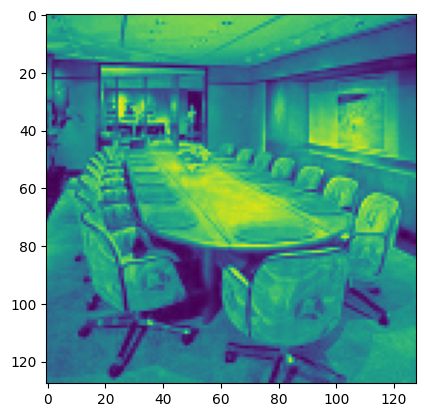

In [387]:
#Image Considering last channel
plt.imshow(image_dataset[8])

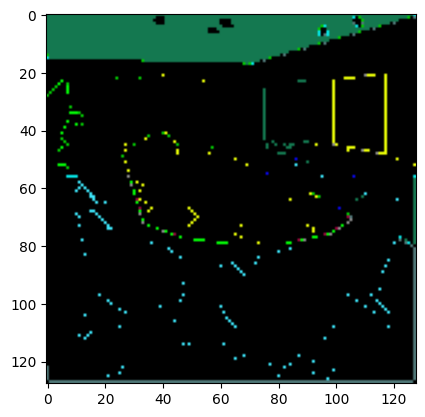

In [388]:
#Masked Image with colours
plt.imshow(masked_image_dataset[8])

In [389]:
np.unique(mask_dataset[0])

array([ 0,  2,  3,  5,  6,  7, 10, 12, 13, 17], dtype=uint8)

In [390]:
masked_image_dataset[0].shape

(128, 128, 3)

In [391]:
n_classes = len(np.unique(mask_dataset))

In [392]:
n_classes

14

750
[ 0  2  3  5  6  7 10 12 13 17 22 27]


Text(0.5, 1.0, 'Mask')

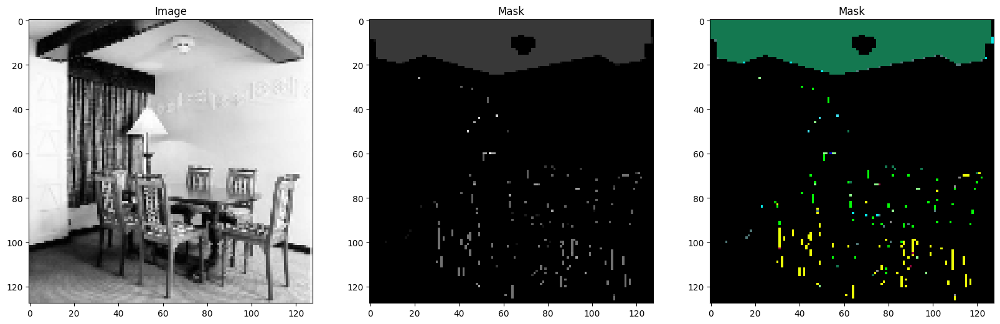

In [393]:
# Sanity check...
import random
image_number = random.randint(0, len(image_dataset))
print(image_number)
print(np.unique(mask_dataset[image_number]))
#image_number=45
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(image_dataset[image_number],cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(mask_dataset[image_number],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[image_number])
plt.title("Mask")

In [394]:
#Convert list to array for machine learning processing
train_images = np.array(image_dataset)
train_images = np.expand_dims(train_images, axis=3)

In [396]:
train_images.shape

(1350, 128, 128, 1)

In [397]:
#Convert list to array for machine learning processing
train_masks = np.array(mask_dataset)
train_masks.shape

(1350, 128, 128)

In [398]:
#Encode labels... but multi dim array so need to flatten, encode and reshape
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
print(np.unique(train_masks_reshaped))
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
print(np.unique(train_masks_reshaped_encoded))
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)

[ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [399]:
#Normalising Images
train_images = normalize(train_images,axis=1)#
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [400]:
train_masks_input.shape, train_images.shape


((1350, 128, 128, 1), (1350, 128, 128, 1))

In [401]:
#Train - Test Split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.1, random_state = 42)

In [402]:
X1.shape, X_test.shape, y1.shape, y_test.shape

((1215, 128, 128, 1),
 (135, 128, 128, 1),
 (1215, 128, 128, 1),
 (135, 128, 128, 1))

In [403]:
np.unique(train_masks_input)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [404]:
#Number of Unique classes in training masks
n_classes=len(np.unique(train_masks_input))
print(n_classes)

14


In [405]:
#CONVERTING DATA TO CATEGORICAL classes
train_masks_cat = to_categorical(y1, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [406]:
###############################################################
#computing class weights
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_masks_reshaped_encoded), y= train_masks_reshaped_encoded)
print("Class weights are...:", class_weights)

Class weights are...: [ 0.12561448  0.99596838  0.68487899  1.3901424   0.96835204  4.00148348
  2.36153486 11.19549394  2.4604596   5.44645443 16.00256986  4.8420718
  6.18321533 25.32679888]


<BarContainer object of 14 artists>

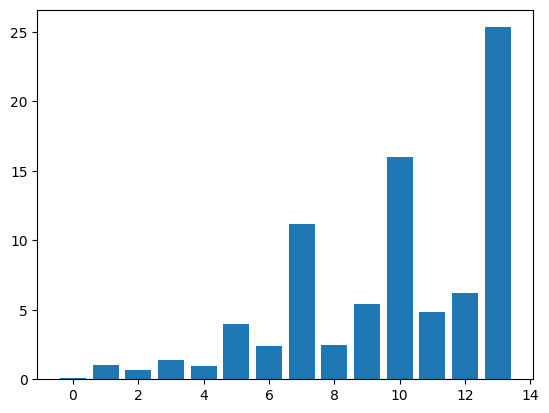

In [407]:
plt.bar([i for i in range(n_classes)], class_weights)

In [408]:
class_weights

array([ 0.12561448,  0.99596838,  0.68487899,  1.3901424 ,  0.96835204,
        4.00148348,  2.36153486, 11.19549394,  2.4604596 ,  5.44645443,
       16.00256986,  4.8420718 ,  6.18321533, 25.32679888])

In [409]:
#Selecting image height, width and channel for neural network
IMG_HEIGHT = X1.shape[1]
IMG_WIDTH  = X1.shape[2]
IMG_CHANNELS = X1.shape[3]
print(IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)

128 128 1


In [410]:
"""
Standard Unet

# https://youtu.be/XyX5HNuv-xE
# https://youtu.be/q-p8v1Bxvac
"""


from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda


################################################################
def multi_unet_model(n_classes=n_classes, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [411]:
from tensorflow.keras import backend as K
# Define custom mean IoU metric function
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)  # Convert predictions to binary values (0 or 1)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])  # Calculate intersection
    union = K.sum(K.clip(y_true + y_pred, 0, 1), axis=[1, 2, 3])  # Calculate union
    iou = K.mean((intersection + K.epsilon()) / (union + K.epsilon()))  # Calculate IoU
    return iou

# Define custom recall metric function
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# Define custom F1 Score metric function
def f1_score(y_true, y_pred):
    precision = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_pred, 0, 1))) + K.epsilon())
    recall = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_true, 0, 1))) + K.epsilon())
    f1_score = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1_score

In [412]:
#Model Compilation

def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy',mean_iou,recall,f1_score])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_57 (Conv2D)             (None, 128, 128, 16  160         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_27 (Dropout)           (None, 128, 128, 16  0           ['conv2d_57[0][0]']              
                                )                                                           

In [413]:
type(X1)

numpy.ndarray

In [414]:
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store precision, recall, F1 score, and IoU
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store metrics for training and validation sets
class MetricsCallback(Callback):
    def __init__(self, X_train, y_train, X_val, y_val):
        super(MetricsCallback, self).__init__()
        self.val_num = int(0.1*len(X_val))
        print(self.val_num)
        self.X_train = X_train[:self.val_num]
        self.y_train = y_train[:self.val_num]
        self.X_val = X_val[:self.val_num]
        self.y_val = y_val[:self.val_num]
        self.metrics_history = {'train': [], 'val': []}

    def on_epoch_end(self, epoch, logs=None):
        # Compute metrics for training set
        y_train_pred = np.argmax(self.model.predict(self.X_train), axis=-1)
        train_precision = precision_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_recall = recall_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_f1 = f1_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        
        confusion_matrix_train = tf.math.confusion_matrix(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel())
        intersection_train = np.diag(confusion_matrix_train)
        union_train = np.sum(confusion_matrix_train, axis=0) + np.sum(confusion_matrix_train, axis=1) - intersection_train
        train_iou = np.mean((intersection_train + 1e-10) / (union_train + 1e-10))

        # Compute metrics for validation set
        y_val_pred = np.argmax(self.model.predict(self.X_val), axis=-1)
        val_precision = precision_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_recall = recall_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_f1 = f1_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        
        confusion_matrix_val = tf.math.confusion_matrix(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel())
        intersection_val = np.diag(confusion_matrix_val)
        union_val = np.sum(confusion_matrix_val, axis=0) + np.sum(confusion_matrix_val, axis=1) - intersection_val
        val_iou = np.mean((intersection_val + 1e-10) / (union_val + 1e-10))

        self.metrics_history['train'].append({'train_precision': train_precision,
                                              'train_recall': train_recall,
                                              'train_f1': train_f1,
                                              'train_iou': train_iou})
        
        self.metrics_history['val'].append({'val_precision': val_precision,
                                            'val_recall': val_recall,
                                            'val_f1': val_f1,
                                            'val_iou': val_iou})


In [72]:
history.history.keys()

NameError: name 'history' is not defined

In [415]:
import datetime
#CHECKPOINT path for model training 
#Model will be saved if validation accuracy improves 
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Custom callback to compute metrics and save history

metrics_callback = MetricsCallback(X1, y_train_cat, X_test, y_test_cat)

reduce_lr_cback = ReduceLROnPlateau(
    monitor='val_loss', factor=0.2,
    patience=5, verbose=1,
    min_lr=0.05 * 0.0001) 

filepath="/kaggle/working/weights-14-improvement-augmented-images-{epoch:03d}-{val_accuracy:.2f}-{accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, savemode='max')
callbacks_list = [checkpoint,metrics_callback,reduce_lr_cback]


13


In [74]:
#creating folder to save weights
os.mkdir('LOGS')

In [416]:
#Load weights 
model.load_weights("/kaggle/working/weights-14-improvement-augmented-images-015-0.70-0.761.hdf5")

In [417]:
#Training model
history = model.fit(X1, y_train_cat,
                    batch_size = 16,
                    verbose=1,
                    epochs=100,
                    validation_data=(X_test, y_test_cat),
                    #class_weight=class_weights,
                    callbacks=callbacks_list,
                    shuffle=True)

Epoch 1/100


2024-04-24 19:33:28.990169: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/dropout_27/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


76/76 [==============================] - ETA: 0s - loss: 0.7900 - accuracy: 0.7569 - mean_iou: 0.6259 - recall: 0.6991 - f1_score: 0.7501
Epoch 1: val_accuracy improved from -inf to 0.74729, saving model to /kaggle/working/weights-14-improvement-augmented-images-001-0.75-0.757.hdf5
1/1 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 18s 120ms/step - loss: 0.7900 - accuracy: 0.7569 - mean_iou: 0.6259 - recall: 0.6991 - f1_score: 0.7501 - val_loss: 0.7640 - val_accuracy: 0.7473 - val_mean_iou: 0.6219 - val_recall: 0.6972 - val_f1_score: 0.7458 - lr: 0.0010
Epoch 2/100
 1/76 [..............................] - ETA: 3s - loss: 0.7807 - accuracy: 0.7401 - mean_iou: 0.5798 - recall: 0.6633 - f1_score: 0.7250

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.7381 - accuracy: 0.7695 - mean_iou: 0.6412 - recall: 0.7148 - f1_score: 0.7642
Epoch 2: val_accuracy improved from 0.74729 to 0.77536, saving model to /kaggle/working/weights-14-improvement-augmented-images-002-0.78-0.769.hdf5
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 65ms/step - loss: 0.7381 - accuracy: 0.7695 - mean_iou: 0.6412 - recall: 0.7148 - f1_score: 0.7642 - val_loss: 0.7137 - val_accuracy: 0.7754 - val_mean_iou: 0.6504 - val_recall: 0.7247 - val_f1_score: 0.7672 - lr: 0.0010
Epoch 3/100
 1/76 [..............................] - ETA: 3s - loss: 0.7482 - accuracy: 0.7538 - mean_iou: 0.6255 - recall: 0.7021 - f1_score: 0.7481

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.7105 - accuracy: 0.7764 - mean_iou: 0.6528 - recall: 0.7261 - f1_score: 0.7725
Epoch 3: val_accuracy improved from 0.77536 to 0.77832, saving model to /kaggle/working/weights-14-improvement-augmented-images-003-0.78-0.776.hdf5
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 65ms/step - loss: 0.7105 - accuracy: 0.7764 - mean_iou: 0.6528 - recall: 0.7261 - f1_score: 0.7725 - val_loss: 0.7069 - val_accuracy: 0.7783 - val_mean_iou: 0.6449 - val_recall: 0.7129 - val_f1_score: 0.7659 - lr: 0.0010
Epoch 4/100
 1/76 [..............................] - ETA: 3s - loss: 0.7125 - accuracy: 0.7902 - mean_iou: 0.6583 - recall: 0.7293 - f1_score: 0.7790

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.7078 - accuracy: 0.7752 - mean_iou: 0.6512 - recall: 0.7245 - f1_score: 0.7716
Epoch 4: val_accuracy did not improve from 0.77832
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.7078 - accuracy: 0.7752 - mean_iou: 0.6512 - recall: 0.7245 - f1_score: 0.7716 - val_loss: 0.7046 - val_accuracy: 0.7754 - val_mean_iou: 0.6419 - val_recall: 0.7125 - val_f1_score: 0.7640 - lr: 0.0010
Epoch 5/100
 1/76 [..............................] - ETA: 3s - loss: 0.7418 - accuracy: 0.7709 - mean_iou: 0.6562 - recall: 0.7146 - f1_score: 0.7736

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.6706 - accuracy: 0.7895 - mean_iou: 0.6691 - recall: 0.7420 - f1_score: 0.7862
Epoch 5: val_accuracy did not improve from 0.77832
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.6706 - accuracy: 0.7895 - mean_iou: 0.6691 - recall: 0.7420 - f1_score: 0.7862 - val_loss: 0.7256 - val_accuracy: 0.7716 - val_mean_iou: 0.6432 - val_recall: 0.7153 - val_f1_score: 0.7641 - lr: 0.0010
Epoch 6/100
 1/76 [..............................] - ETA: 3s - loss: 0.7110 - accuracy: 0.7924 - mean_iou: 0.6497 - recall: 0.7126 - f1_score: 0.7780

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.6535 - accuracy: 0.7933 - mean_iou: 0.6734 - recall: 0.7455 - f1_score: 0.7896
Epoch 6: val_accuracy did not improve from 0.77832
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.6535 - accuracy: 0.7933 - mean_iou: 0.6734 - recall: 0.7455 - f1_score: 0.7896 - val_loss: 0.7326 - val_accuracy: 0.7729 - val_mean_iou: 0.6529 - val_recall: 0.7294 - val_f1_score: 0.7674 - lr: 0.0010
Epoch 7/100
 1/76 [..............................] - ETA: 3s - loss: 0.7327 - accuracy: 0.7513 - mean_iou: 0.5899 - recall: 0.6755 - f1_score: 0.7325

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.6562 - accuracy: 0.7931 - mean_iou: 0.6725 - recall: 0.7455 - f1_score: 0.7895
Epoch 7: val_accuracy did not improve from 0.77832
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.6562 - accuracy: 0.7931 - mean_iou: 0.6725 - recall: 0.7455 - f1_score: 0.7895 - val_loss: 0.7438 - val_accuracy: 0.7689 - val_mean_iou: 0.6375 - val_recall: 0.7079 - val_f1_score: 0.7574 - lr: 0.0010
Epoch 8/100
 1/76 [..............................] - ETA: 3s - loss: 0.5693 - accuracy: 0.8402 - mean_iou: 0.7257 - recall: 0.7983 - f1_score: 0.8322

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.6375 - accuracy: 0.7981 - mean_iou: 0.6803 - recall: 0.7534 - f1_score: 0.7958
Epoch 8: val_accuracy improved from 0.77832 to 0.78004, saving model to /kaggle/working/weights-14-improvement-augmented-images-008-0.78-0.798.hdf5
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 64ms/step - loss: 0.6389 - accuracy: 0.7976 - mean_iou: 0.6797 - recall: 0.7529 - f1_score: 0.7953 - val_loss: 0.7131 - val_accuracy: 0.7800 - val_mean_iou: 0.6552 - val_recall: 0.7282 - val_f1_score: 0.7737 - lr: 0.0010
Epoch 9/100
 1/76 [..............................] - ETA: 3s - loss: 0.4002 - accuracy: 0.8750 - mean_iou: 0.7783 - recall: 0.8465 - f1_score: 0.8707

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.6209 - accuracy: 0.8035 - mean_iou: 0.6880 - recall: 0.7600 - f1_score: 0.8018
Epoch 9: val_accuracy did not improve from 0.78004
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 [==============================] - 0s 24ms/step

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
76/76 [==============================] - 5s 63ms/step - loss: 0.6193 - accuracy: 0.8040 - mean_iou: 0.6886 - recall: 0.7607 - f1_score: 0.8023 - val_loss: 0.7440 - val_accuracy: 0.7708 - val_mean_iou: 0.6468 - val_recall: 0.7245 - val_f1_score: 0.7656 - lr: 0.0010
Epoch 10/100


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5704 - accuracy: 0.8193 - mean_iou: 0.7097 - recall: 0.7806 - f1_score: 0.8188
Epoch 10: val_accuracy improved from 0.78004 to 0.78590, saving model to /kaggle/working/weights-14-improvement-augmented-images-010-0.79-0.819.hdf5
1/1 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 64ms/step - loss: 0.5704 - accuracy: 0.8193 - mean_iou: 0.7097 - recall: 0.7806 - f1_score: 0.8188 - val_loss: 0.7028 - val_accuracy: 0.7859 - val_mean_iou: 0.6677 - val_recall: 0.7446 - val_f1_score: 0.7797 - lr: 2.0000e-04
Epoch 11/100
 1/76 [..............................] - ETA: 3s - loss: 0.4592 - accuracy: 0.8536 - mean_iou: 0.7720 - recall: 0.8311 - f1_score: 0.8579

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5500 - accuracy: 0.8250 - mean_iou: 0.7181 - recall: 0.7885 - f1_score: 0.8248
Epoch 11: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5500 - accuracy: 0.8250 - mean_iou: 0.7181 - recall: 0.7885 - f1_score: 0.8248 - val_loss: 0.7066 - val_accuracy: 0.7831 - val_mean_iou: 0.6652 - val_recall: 0.7412 - val_f1_score: 0.7773 - lr: 2.0000e-04
Epoch 12/100
 1/76 [..............................] - ETA: 3s - loss: 0.3671 - accuracy: 0.8962 - mean_iou: 0.8125 - recall: 0.8667 - f1_score: 0.8936

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5413 - accuracy: 0.8275 - mean_iou: 0.7211 - recall: 0.7915 - f1_score: 0.8271
Epoch 12: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5413 - accuracy: 0.8275 - mean_iou: 0.7211 - recall: 0.7915 - f1_score: 0.8271 - val_loss: 0.7055 - val_accuracy: 0.7821 - val_mean_iou: 0.6633 - val_recall: 0.7385 - val_f1_score: 0.7767 - lr: 2.0000e-04
Epoch 13/100
 1/76 [..............................] - ETA: 3s - loss: 0.5547 - accuracy: 0.8269 - mean_iou: 0.7314 - recall: 0.7947 - f1_score: 0.8320

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5323 - accuracy: 0.8303 - mean_iou: 0.7251 - recall: 0.7951 - f1_score: 0.8302
Epoch 13: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5323 - accuracy: 0.8303 - mean_iou: 0.7251 - recall: 0.7951 - f1_score: 0.8302 - val_loss: 0.7191 - val_accuracy: 0.7789 - val_mean_iou: 0.6597 - val_recall: 0.7348 - val_f1_score: 0.7742 - lr: 2.0000e-04
Epoch 14/100
 1/76 [..............................] - ETA: 3s - loss: 0.3513 - accuracy: 0.8966 - mean_iou: 0.8116 - recall: 0.8661 - f1_score: 0.8931

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5325 - accuracy: 0.8311 - mean_iou: 0.7265 - recall: 0.7960 - f1_score: 0.8314
Epoch 14: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5325 - accuracy: 0.8311 - mean_iou: 0.7265 - recall: 0.7960 - f1_score: 0.8314 - val_loss: 0.7134 - val_accuracy: 0.7801 - val_mean_iou: 0.6627 - val_recall: 0.7395 - val_f1_score: 0.7757 - lr: 2.0000e-04
Epoch 15/100
 1/76 [..............................] - ETA: 3s - loss: 0.5659 - accuracy: 0.8225 - mean_iou: 0.7186 - recall: 0.7887 - f1_score: 0.8208

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5189 - accuracy: 0.8349 - mean_iou: 0.7316 - recall: 0.8007 - f1_score: 0.8354
Epoch 15: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 15: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
76/76 [==============================] - 5s 62ms/step - loss: 0.5189 - accuracy: 0.8349 - mean_iou: 0.7316 - recall: 0.8007 - f1_score: 0.8354 - val_loss: 0.7099 - val_accuracy: 0.7815 - val_mean_iou: 0.6646 - val_recall: 0.7430 - val_f1_score: 0.7782 - lr: 2.0000e-04
Epoch 16/100
 1/76 [..............................] - ETA: 3s - loss: 0.6380 - accuracy: 0.7931 - mean_iou: 0.6749 - recall: 0.7577 - f1_score: 0.7922

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5154 - accuracy: 0.8353 - mean_iou: 0.7315 - recall: 0.8009 - f1_score: 0.8354
Epoch 16: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5142 - accuracy: 0.8359 - mean_iou: 0.7321 - recall: 0.8015 - f1_score: 0.8360 - val_loss: 0.7090 - val_accuracy: 0.7817 - val_mean_iou: 0.6651 - val_recall: 0.7428 - val_f1_score: 0.7783 - lr: 4.0000e-05
Epoch 17/100
 1/76 [..............................] - ETA: 3s - loss: 0.5421 - accuracy: 0.8252 - mean_iou: 0.7190 - recall: 0.7823 - f1_score: 0.8242

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5105 - accuracy: 0.8378 - mean_iou: 0.7349 - recall: 0.8041 - f1_score: 0.8377
Epoch 17: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5105 - accuracy: 0.8378 - mean_iou: 0.7349 - recall: 0.8041 - f1_score: 0.8377 - val_loss: 0.7136 - val_accuracy: 0.7806 - val_mean_iou: 0.6643 - val_recall: 0.7426 - val_f1_score: 0.7773 - lr: 4.0000e-05
Epoch 18/100
 1/76 [..............................] - ETA: 3s - loss: 0.5147 - accuracy: 0.8387 - mean_iou: 0.7216 - recall: 0.7890 - f1_score: 0.8317

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5064 - accuracy: 0.8394 - mean_iou: 0.7376 - recall: 0.8063 - f1_score: 0.8398
Epoch 18: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5064 - accuracy: 0.8394 - mean_iou: 0.7376 - recall: 0.8063 - f1_score: 0.8398 - val_loss: 0.7118 - val_accuracy: 0.7816 - val_mean_iou: 0.6665 - val_recall: 0.7453 - val_f1_score: 0.7790 - lr: 4.0000e-05
Epoch 19/100
 1/76 [..............................] - ETA: 3s - loss: 0.6437 - accuracy: 0.7890 - mean_iou: 0.6835 - recall: 0.7517 - f1_score: 0.7992

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5100 - accuracy: 0.8380 - mean_iou: 0.7355 - recall: 0.8044 - f1_score: 0.8382
Epoch 19: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5100 - accuracy: 0.8380 - mean_iou: 0.7355 - recall: 0.8044 - f1_score: 0.8382 - val_loss: 0.7142 - val_accuracy: 0.7828 - val_mean_iou: 0.6686 - val_recall: 0.7478 - val_f1_score: 0.7802 - lr: 4.0000e-05
Epoch 20/100
 1/76 [..............................] - ETA: 3s - loss: 0.4457 - accuracy: 0.8688 - mean_iou: 0.7706 - recall: 0.8345 - f1_score: 0.8667

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5042 - accuracy: 0.8397 - mean_iou: 0.7379 - recall: 0.8069 - f1_score: 0.8398
Epoch 20: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 [==============================] - 0s 26ms/step

Epoch 20: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.
76/76 [==============================] - 5s 62ms/step - loss: 0.5067 - accuracy: 0.8387 - mean_iou: 0.7365 - recall: 0.8055 - f1_score: 0.8388 - val_loss: 0.7136 - val_accuracy: 0.7818 - val_mean_iou: 0.6665 - val_recall: 0.7448 - val_f1_score: 0.7788 - lr: 4.0000e-05
Epoch 21/100
 1/76 [..............................] - ETA: 3s - loss: 0.5462 - accuracy: 0.8087 - mean_iou: 0.6893 - recall: 0.7720 - f1_score: 0.8049

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5059 - accuracy: 0.8386 - mean_iou: 0.7360 - recall: 0.8051 - f1_score: 0.8389
Epoch 21: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5046 - accuracy: 0.8389 - mean_iou: 0.7365 - recall: 0.8056 - f1_score: 0.8392 - val_loss: 0.7138 - val_accuracy: 0.7816 - val_mean_iou: 0.6662 - val_recall: 0.7446 - val_f1_score: 0.7786 - lr: 8.0000e-06
Epoch 22/100
 1/76 [..............................] - ETA: 3s - loss: 0.4791 - accuracy: 0.8558 - mean_iou: 0.7554 - recall: 0.8176 - f1_score: 0.8567

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5020 - accuracy: 0.8396 - mean_iou: 0.7375 - recall: 0.8059 - f1_score: 0.8398
Epoch 22: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5020 - accuracy: 0.8396 - mean_iou: 0.7375 - recall: 0.8059 - f1_score: 0.8398 - val_loss: 0.7142 - val_accuracy: 0.7814 - val_mean_iou: 0.6662 - val_recall: 0.7447 - val_f1_score: 0.7785 - lr: 8.0000e-06
Epoch 23/100
 1/76 [..............................] - ETA: 3s - loss: 0.4867 - accuracy: 0.8380 - mean_iou: 0.7409 - recall: 0.8022 - f1_score: 0.8393

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5022 - accuracy: 0.8403 - mean_iou: 0.7394 - recall: 0.8079 - f1_score: 0.8408
Epoch 23: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5021 - accuracy: 0.8402 - mean_iou: 0.7392 - recall: 0.8078 - f1_score: 0.8407 - val_loss: 0.7134 - val_accuracy: 0.7816 - val_mean_iou: 0.6667 - val_recall: 0.7455 - val_f1_score: 0.7789 - lr: 8.0000e-06
Epoch 24/100
 1/76 [..............................] - ETA: 3s - loss: 0.5464 - accuracy: 0.8115 - mean_iou: 0.7096 - recall: 0.7769 - f1_score: 0.8235

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5035 - accuracy: 0.8392 - mean_iou: 0.7374 - recall: 0.8059 - f1_score: 0.8396
Epoch 24: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5030 - accuracy: 0.8396 - mean_iou: 0.7379 - recall: 0.8063 - f1_score: 0.8400 - val_loss: 0.7126 - val_accuracy: 0.7820 - val_mean_iou: 0.6674 - val_recall: 0.7461 - val_f1_score: 0.7793 - lr: 8.0000e-06
Epoch 25/100
 1/76 [..............................] - ETA: 3s - loss: 0.4996 - accuracy: 0.8577 - mean_iou: 0.7641 - recall: 0.8203 - f1_score: 0.8560

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5017 - accuracy: 0.8409 - mean_iou: 0.7397 - recall: 0.8087 - f1_score: 0.8415
Epoch 25: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 25: ReduceLROnPlateau reducing learning rate to 5e-06.
76/76 [==============================] - 5s 63ms/step - loss: 0.5017 - accuracy: 0.8409 - mean_iou: 0.7397 - recall: 0.8087 - f1_score: 0.8415 - val_loss: 0.7134 - val_accuracy: 0.7821 - val_mean_iou: 0.6675 - val_recall: 0.7462 - val_f1_score: 0.7793 - lr: 8.0000e-06
Epoch 26/100
 1/76 [..............................] - ETA: 3s - loss: 0.5502 - accuracy: 0.8101 - mean_iou: 0.7034 - recall: 0.7833 - f1_score: 0.8102

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5025 - accuracy: 0.8392 - mean_iou: 0.7370 - recall: 0.8062 - f1_score: 0.8395
Epoch 26: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5025 - accuracy: 0.8392 - mean_iou: 0.7370 - recall: 0.8062 - f1_score: 0.8395 - val_loss: 0.7133 - val_accuracy: 0.7821 - val_mean_iou: 0.6675 - val_recall: 0.7462 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 27/100
 1/76 [..............................] - ETA: 3s - loss: 0.5202 - accuracy: 0.8455 - mean_iou: 0.7532 - recall: 0.8259 - f1_score: 0.8471

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5048 - accuracy: 0.8379 - mean_iou: 0.7348 - recall: 0.8044 - f1_score: 0.8379
Epoch 27: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5026 - accuracy: 0.8387 - mean_iou: 0.7360 - recall: 0.8055 - f1_score: 0.8388 - val_loss: 0.7128 - val_accuracy: 0.7819 - val_mean_iou: 0.6673 - val_recall: 0.7460 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 28/100
 1/76 [..............................] - ETA: 3s - loss: 0.6183 - accuracy: 0.7966 - mean_iou: 0.6937 - recall: 0.7732 - f1_score: 0.8023

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5019 - accuracy: 0.8403 - mean_iou: 0.7377 - recall: 0.8068 - f1_score: 0.8402
Epoch 28: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5027 - accuracy: 0.8400 - mean_iou: 0.7375 - recall: 0.8065 - f1_score: 0.8401 - val_loss: 0.7132 - val_accuracy: 0.7817 - val_mean_iou: 0.6671 - val_recall: 0.7459 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 29/100
 1/76 [..............................] - ETA: 3s - loss: 0.4840 - accuracy: 0.8526 - mean_iou: 0.7556 - recall: 0.8300 - f1_score: 0.8520

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5040 - accuracy: 0.8390 - mean_iou: 0.7370 - recall: 0.8055 - f1_score: 0.8392
Epoch 29: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5040 - accuracy: 0.8390 - mean_iou: 0.7370 - recall: 0.8055 - f1_score: 0.8392 - val_loss: 0.7130 - val_accuracy: 0.7818 - val_mean_iou: 0.6675 - val_recall: 0.7463 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 30/100
 1/76 [..............................] - ETA: 3s - loss: 0.5782 - accuracy: 0.8213 - mean_iou: 0.6981 - recall: 0.7742 - f1_score: 0.8172

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5051 - accuracy: 0.8386 - mean_iou: 0.7367 - recall: 0.8055 - f1_score: 0.8392
Epoch 30: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5042 - accuracy: 0.8389 - mean_iou: 0.7371 - recall: 0.8057 - f1_score: 0.8394 - val_loss: 0.7136 - val_accuracy: 0.7818 - val_mean_iou: 0.6675 - val_recall: 0.7464 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 31/100
 1/76 [..............................] - ETA: 3s - loss: 0.6290 - accuracy: 0.7986 - mean_iou: 0.6782 - recall: 0.7622 - f1_score: 0.7988

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5026 - accuracy: 0.8397 - mean_iou: 0.7373 - recall: 0.8060 - f1_score: 0.8396
Epoch 31: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5026 - accuracy: 0.8397 - mean_iou: 0.7373 - recall: 0.8060 - f1_score: 0.8396 - val_loss: 0.7142 - val_accuracy: 0.7819 - val_mean_iou: 0.6678 - val_recall: 0.7467 - val_f1_score: 0.7796 - lr: 5.0000e-06
Epoch 32/100
 1/76 [..............................] - ETA: 3s - loss: 0.5336 - accuracy: 0.8307 - mean_iou: 0.7200 - recall: 0.7965 - f1_score: 0.8312

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5013 - accuracy: 0.8392 - mean_iou: 0.7369 - recall: 0.8059 - f1_score: 0.8394
Epoch 32: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5016 - accuracy: 0.8392 - mean_iou: 0.7370 - recall: 0.8060 - f1_score: 0.8394 - val_loss: 0.7146 - val_accuracy: 0.7817 - val_mean_iou: 0.6677 - val_recall: 0.7465 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 33/100
 1/76 [..............................] - ETA: 3s - loss: 0.6025 - accuracy: 0.7928 - mean_iou: 0.6772 - recall: 0.7497 - f1_score: 0.7989

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4989 - accuracy: 0.8409 - mean_iou: 0.7394 - recall: 0.8078 - f1_score: 0.8413
Epoch 33: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4989 - accuracy: 0.8409 - mean_iou: 0.7394 - recall: 0.8078 - f1_score: 0.8413 - val_loss: 0.7146 - val_accuracy: 0.7817 - val_mean_iou: 0.6676 - val_recall: 0.7465 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 34/100
 1/76 [..............................] - ETA: 3s - loss: 0.4253 - accuracy: 0.8568 - mean_iou: 0.7639 - recall: 0.8256 - f1_score: 0.8598

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5008 - accuracy: 0.8402 - mean_iou: 0.7385 - recall: 0.8075 - f1_score: 0.8408
Epoch 34: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5019 - accuracy: 0.8397 - mean_iou: 0.7381 - recall: 0.8071 - f1_score: 0.8403 - val_loss: 0.7149 - val_accuracy: 0.7817 - val_mean_iou: 0.6677 - val_recall: 0.7466 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 35/100
 1/76 [..............................] - ETA: 3s - loss: 0.4315 - accuracy: 0.8444 - mean_iou: 0.7564 - recall: 0.8187 - f1_score: 0.8494

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5005 - accuracy: 0.8405 - mean_iou: 0.7391 - recall: 0.8080 - f1_score: 0.8412
Epoch 35: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5005 - accuracy: 0.8405 - mean_iou: 0.7391 - recall: 0.8080 - f1_score: 0.8412 - val_loss: 0.7152 - val_accuracy: 0.7815 - val_mean_iou: 0.6674 - val_recall: 0.7462 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 36/100
 1/76 [..............................] - ETA: 3s - loss: 0.7726 - accuracy: 0.7517 - mean_iou: 0.6078 - recall: 0.6869 - f1_score: 0.7452

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4994 - accuracy: 0.8411 - mean_iou: 0.7391 - recall: 0.8078 - f1_score: 0.8409
Epoch 36: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4995 - accuracy: 0.8410 - mean_iou: 0.7389 - recall: 0.8076 - f1_score: 0.8408 - val_loss: 0.7158 - val_accuracy: 0.7814 - val_mean_iou: 0.6673 - val_recall: 0.7462 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 37/100
 1/76 [..............................] - ETA: 3s - loss: 0.5381 - accuracy: 0.8227 - mean_iou: 0.7170 - recall: 0.7916 - f1_score: 0.8256

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4984 - accuracy: 0.8418 - mean_iou: 0.7404 - recall: 0.8085 - f1_score: 0.8418
Epoch 37: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4982 - accuracy: 0.8416 - mean_iou: 0.7400 - recall: 0.8084 - f1_score: 0.8416 - val_loss: 0.7154 - val_accuracy: 0.7815 - val_mean_iou: 0.6674 - val_recall: 0.7462 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 38/100
 1/76 [..............................] - ETA: 3s - loss: 0.5128 - accuracy: 0.8353 - mean_iou: 0.7257 - recall: 0.7985 - f1_score: 0.8350

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4998 - accuracy: 0.8406 - mean_iou: 0.7390 - recall: 0.8074 - f1_score: 0.8410
Epoch 38: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4998 - accuracy: 0.8406 - mean_iou: 0.7390 - recall: 0.8074 - f1_score: 0.8410 - val_loss: 0.7159 - val_accuracy: 0.7812 - val_mean_iou: 0.6672 - val_recall: 0.7460 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 39/100


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5016 - accuracy: 0.8400 - mean_iou: 0.7384 - recall: 0.8074 - f1_score: 0.8406
Epoch 39: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5010 - accuracy: 0.8402 - mean_iou: 0.7389 - recall: 0.8077 - f1_score: 0.8409 - val_loss: 0.7154 - val_accuracy: 0.7811 - val_mean_iou: 0.6670 - val_recall: 0.7458 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 40/100
 1/76 [..............................] - ETA: 3s - loss: 0.3472 - accuracy: 0.8891 - mean_iou: 0.8034 - recall: 0.8636 - f1_score: 0.8872

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4987 - accuracy: 0.8416 - mean_iou: 0.7402 - recall: 0.8082 - f1_score: 0.8418
Epoch 40: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 22ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4988 - accuracy: 0.8415 - mean_iou: 0.7399 - recall: 0.8082 - f1_score: 0.8417 - val_loss: 0.7157 - val_accuracy: 0.7811 - val_mean_iou: 0.6672 - val_recall: 0.7460 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 41/100
 1/76 [..............................] - ETA: 4s - loss: 0.6992 - accuracy: 0.7615 - mean_iou: 0.6364 - recall: 0.7132 - f1_score: 0.7582

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5008 - accuracy: 0.8403 - mean_iou: 0.7388 - recall: 0.8074 - f1_score: 0.8406
Epoch 41: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5008 - accuracy: 0.8403 - mean_iou: 0.7388 - recall: 0.8074 - f1_score: 0.8406 - val_loss: 0.7162 - val_accuracy: 0.7814 - val_mean_iou: 0.6677 - val_recall: 0.7465 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 42/100
 1/76 [..............................] - ETA: 3s - loss: 0.3391 - accuracy: 0.8929 - mean_iou: 0.8134 - recall: 0.8653 - f1_score: 0.8928

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4969 - accuracy: 0.8418 - mean_iou: 0.7406 - recall: 0.8087 - f1_score: 0.8425
Epoch 42: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4976 - accuracy: 0.8418 - mean_iou: 0.7406 - recall: 0.8087 - f1_score: 0.8425 - val_loss: 0.7170 - val_accuracy: 0.7814 - val_mean_iou: 0.6674 - val_recall: 0.7462 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 43/100
 1/76 [..............................] - ETA: 3s - loss: 0.3785 - accuracy: 0.8760 - mean_iou: 0.7702 - recall: 0.8355 - f1_score: 0.8658

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5011 - accuracy: 0.8397 - mean_iou: 0.7372 - recall: 0.8060 - f1_score: 0.8396
Epoch 43: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5005 - accuracy: 0.8400 - mean_iou: 0.7376 - recall: 0.8064 - f1_score: 0.8399 - val_loss: 0.7168 - val_accuracy: 0.7813 - val_mean_iou: 0.6673 - val_recall: 0.7462 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 44/100
 1/76 [..............................] - ETA: 3s - loss: 0.4547 - accuracy: 0.8510 - mean_iou: 0.7606 - recall: 0.8277 - f1_score: 0.8514

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4989 - accuracy: 0.8414 - mean_iou: 0.7397 - recall: 0.8084 - f1_score: 0.8415
Epoch 44: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4989 - accuracy: 0.8414 - mean_iou: 0.7397 - recall: 0.8084 - f1_score: 0.8415 - val_loss: 0.7172 - val_accuracy: 0.7813 - val_mean_iou: 0.6674 - val_recall: 0.7463 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 45/100
 1/76 [..............................] - ETA: 3s - loss: 0.4318 - accuracy: 0.8695 - mean_iou: 0.7733 - recall: 0.8378 - f1_score: 0.8670

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5013 - accuracy: 0.8404 - mean_iou: 0.7383 - recall: 0.8076 - f1_score: 0.8406
Epoch 45: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5013 - accuracy: 0.8404 - mean_iou: 0.7383 - recall: 0.8076 - f1_score: 0.8406 - val_loss: 0.7168 - val_accuracy: 0.7814 - val_mean_iou: 0.6676 - val_recall: 0.7464 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 46/100
 1/76 [..............................] - ETA: 3s - loss: 0.6398 - accuracy: 0.7715 - mean_iou: 0.6559 - recall: 0.7236 - f1_score: 0.7707

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4995 - accuracy: 0.8406 - mean_iou: 0.7391 - recall: 0.8080 - f1_score: 0.8409
Epoch 46: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4995 - accuracy: 0.8406 - mean_iou: 0.7391 - recall: 0.8080 - f1_score: 0.8409 - val_loss: 0.7165 - val_accuracy: 0.7814 - val_mean_iou: 0.6675 - val_recall: 0.7464 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 47/100
 1/76 [..............................] - ETA: 4s - loss: 0.4594 - accuracy: 0.8674 - mean_iou: 0.7679 - recall: 0.8415 - f1_score: 0.8651

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4946 - accuracy: 0.8424 - mean_iou: 0.7411 - recall: 0.8097 - f1_score: 0.8426
Epoch 47: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4946 - accuracy: 0.8424 - mean_iou: 0.7411 - recall: 0.8097 - f1_score: 0.8426 - val_loss: 0.7159 - val_accuracy: 0.7814 - val_mean_iou: 0.6676 - val_recall: 0.7465 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 48/100
 1/76 [..............................] - ETA: 3s - loss: 0.8209 - accuracy: 0.7276 - mean_iou: 0.6061 - recall: 0.6728 - f1_score: 0.7376

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4964 - accuracy: 0.8414 - mean_iou: 0.7409 - recall: 0.8095 - f1_score: 0.8424
Epoch 48: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4964 - accuracy: 0.8414 - mean_iou: 0.7409 - recall: 0.8095 - f1_score: 0.8424 - val_loss: 0.7162 - val_accuracy: 0.7810 - val_mean_iou: 0.6675 - val_recall: 0.7465 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 49/100
 1/76 [..............................] - ETA: 3s - loss: 0.6926 - accuracy: 0.7706 - mean_iou: 0.6530 - recall: 0.7380 - f1_score: 0.7694

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4988 - accuracy: 0.8405 - mean_iou: 0.7388 - recall: 0.8077 - f1_score: 0.8409
Epoch 49: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4988 - accuracy: 0.8405 - mean_iou: 0.7388 - recall: 0.8077 - f1_score: 0.8409 - val_loss: 0.7158 - val_accuracy: 0.7813 - val_mean_iou: 0.6676 - val_recall: 0.7467 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 50/100
 1/76 [..............................] - ETA: 3s - loss: 0.4347 - accuracy: 0.8618 - mean_iou: 0.7709 - recall: 0.8415 - f1_score: 0.8625

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4989 - accuracy: 0.8408 - mean_iou: 0.7394 - recall: 0.8080 - f1_score: 0.8412
Epoch 50: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4999 - accuracy: 0.8406 - mean_iou: 0.7390 - recall: 0.8077 - f1_score: 0.8410 - val_loss: 0.7163 - val_accuracy: 0.7812 - val_mean_iou: 0.6676 - val_recall: 0.7466 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 51/100
 1/76 [..............................] - ETA: 3s - loss: 0.4215 - accuracy: 0.8810 - mean_iou: 0.7901 - recall: 0.8517 - f1_score: 0.8789

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4965 - accuracy: 0.8416 - mean_iou: 0.7399 - recall: 0.8086 - f1_score: 0.8417
Epoch 51: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4965 - accuracy: 0.8416 - mean_iou: 0.7399 - recall: 0.8086 - f1_score: 0.8417 - val_loss: 0.7162 - val_accuracy: 0.7813 - val_mean_iou: 0.6677 - val_recall: 0.7466 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 52/100
 1/76 [..............................] - ETA: 3s - loss: 0.6880 - accuracy: 0.7638 - mean_iou: 0.6454 - recall: 0.7183 - f1_score: 0.7695

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5018 - accuracy: 0.8398 - mean_iou: 0.7377 - recall: 0.8066 - f1_score: 0.8397
Epoch 52: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5000 - accuracy: 0.8406 - mean_iou: 0.7388 - recall: 0.8075 - f1_score: 0.8405 - val_loss: 0.7158 - val_accuracy: 0.7816 - val_mean_iou: 0.6680 - val_recall: 0.7470 - val_f1_score: 0.7797 - lr: 5.0000e-06
Epoch 53/100
 1/76 [..............................] - ETA: 3s - loss: 0.5862 - accuracy: 0.8174 - mean_iou: 0.6980 - recall: 0.7826 - f1_score: 0.8163

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4997 - accuracy: 0.8400 - mean_iou: 0.7384 - recall: 0.8076 - f1_score: 0.8405
Epoch 53: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4987 - accuracy: 0.8402 - mean_iou: 0.7387 - recall: 0.8079 - f1_score: 0.8407 - val_loss: 0.7165 - val_accuracy: 0.7815 - val_mean_iou: 0.6678 - val_recall: 0.7466 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 54/100
 1/76 [..............................] - ETA: 3s - loss: 0.4770 - accuracy: 0.8430 - mean_iou: 0.7334 - recall: 0.8046 - f1_score: 0.8398

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4983 - accuracy: 0.8408 - mean_iou: 0.7397 - recall: 0.8087 - f1_score: 0.8412
Epoch 54: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4983 - accuracy: 0.8408 - mean_iou: 0.7397 - recall: 0.8087 - f1_score: 0.8412 - val_loss: 0.7171 - val_accuracy: 0.7814 - val_mean_iou: 0.6679 - val_recall: 0.7469 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 55/100
 1/76 [..............................] - ETA: 3s - loss: 0.3927 - accuracy: 0.8918 - mean_iou: 0.8258 - recall: 0.8760 - f1_score: 0.8912

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4980 - accuracy: 0.8414 - mean_iou: 0.7395 - recall: 0.8082 - f1_score: 0.8414
Epoch 55: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4980 - accuracy: 0.8414 - mean_iou: 0.7395 - recall: 0.8082 - f1_score: 0.8414 - val_loss: 0.7174 - val_accuracy: 0.7811 - val_mean_iou: 0.6675 - val_recall: 0.7464 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 56/100
 1/76 [..............................] - ETA: 3s - loss: 0.7862 - accuracy: 0.7334 - mean_iou: 0.6133 - recall: 0.6921 - f1_score: 0.7377

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4978 - accuracy: 0.8418 - mean_iou: 0.7407 - recall: 0.8092 - f1_score: 0.8418
Epoch 56: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4978 - accuracy: 0.8418 - mean_iou: 0.7407 - recall: 0.8092 - f1_score: 0.8418 - val_loss: 0.7186 - val_accuracy: 0.7809 - val_mean_iou: 0.6673 - val_recall: 0.7462 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 57/100
 1/76 [..............................] - ETA: 3s - loss: 0.5198 - accuracy: 0.8316 - mean_iou: 0.7221 - recall: 0.8050 - f1_score: 0.8289

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4955 - accuracy: 0.8413 - mean_iou: 0.7403 - recall: 0.8089 - f1_score: 0.8419
Epoch 57: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4955 - accuracy: 0.8413 - mean_iou: 0.7403 - recall: 0.8089 - f1_score: 0.8419 - val_loss: 0.7186 - val_accuracy: 0.7808 - val_mean_iou: 0.6672 - val_recall: 0.7461 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 58/100


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.5002 - accuracy: 0.8405 - mean_iou: 0.7391 - recall: 0.8079 - f1_score: 0.8410
Epoch 58: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4983 - accuracy: 0.8412 - mean_iou: 0.7402 - recall: 0.8090 - f1_score: 0.8418 - val_loss: 0.7184 - val_accuracy: 0.7808 - val_mean_iou: 0.6672 - val_recall: 0.7461 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 59/100
 1/76 [..............................] - ETA: 3s - loss: 0.4213 - accuracy: 0.8649 - mean_iou: 0.7682 - recall: 0.8312 - f1_score: 0.8610

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4950 - accuracy: 0.8413 - mean_iou: 0.7399 - recall: 0.8083 - f1_score: 0.8415
Epoch 59: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4950 - accuracy: 0.8413 - mean_iou: 0.7399 - recall: 0.8083 - f1_score: 0.8415 - val_loss: 0.7190 - val_accuracy: 0.7807 - val_mean_iou: 0.6672 - val_recall: 0.7461 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 60/100
 1/76 [..............................] - ETA: 3s - loss: 0.5047 - accuracy: 0.8474 - mean_iou: 0.7454 - recall: 0.8212 - f1_score: 0.8467

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4949 - accuracy: 0.8423 - mean_iou: 0.7409 - recall: 0.8093 - f1_score: 0.8423
Epoch 60: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4975 - accuracy: 0.8412 - mean_iou: 0.7392 - recall: 0.8080 - f1_score: 0.8411 - val_loss: 0.7186 - val_accuracy: 0.7808 - val_mean_iou: 0.6672 - val_recall: 0.7462 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 61/100
 1/76 [..............................] - ETA: 3s - loss: 0.6471 - accuracy: 0.7870 - mean_iou: 0.6716 - recall: 0.7465 - f1_score: 0.7926

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4972 - accuracy: 0.8416 - mean_iou: 0.7402 - recall: 0.8087 - f1_score: 0.8420
Epoch 61: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4972 - accuracy: 0.8416 - mean_iou: 0.7402 - recall: 0.8087 - f1_score: 0.8420 - val_loss: 0.7195 - val_accuracy: 0.7806 - val_mean_iou: 0.6670 - val_recall: 0.7459 - val_f1_score: 0.7788 - lr: 5.0000e-06
Epoch 62/100
 1/76 [..............................] - ETA: 3s - loss: 0.4021 - accuracy: 0.8766 - mean_iou: 0.7969 - recall: 0.8628 - f1_score: 0.8773

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4962 - accuracy: 0.8411 - mean_iou: 0.7395 - recall: 0.8082 - f1_score: 0.8414
Epoch 62: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4966 - accuracy: 0.8409 - mean_iou: 0.7391 - recall: 0.8077 - f1_score: 0.8411 - val_loss: 0.7191 - val_accuracy: 0.7805 - val_mean_iou: 0.6670 - val_recall: 0.7459 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 63/100


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4962 - accuracy: 0.8419 - mean_iou: 0.7406 - recall: 0.8083 - f1_score: 0.8419
Epoch 63: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4962 - accuracy: 0.8419 - mean_iou: 0.7406 - recall: 0.8083 - f1_score: 0.8419 - val_loss: 0.7193 - val_accuracy: 0.7807 - val_mean_iou: 0.6672 - val_recall: 0.7463 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 64/100
 1/76 [..............................] - ETA: 3s - loss: 0.5647 - accuracy: 0.8205 - mean_iou: 0.7196 - recall: 0.7916 - f1_score: 0.8235

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4963 - accuracy: 0.8420 - mean_iou: 0.7404 - recall: 0.8093 - f1_score: 0.8420
Epoch 64: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4963 - accuracy: 0.8420 - mean_iou: 0.7404 - recall: 0.8093 - f1_score: 0.8420 - val_loss: 0.7193 - val_accuracy: 0.7805 - val_mean_iou: 0.6671 - val_recall: 0.7461 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 65/100
 1/76 [..............................] - ETA: 3s - loss: 0.4646 - accuracy: 0.8596 - mean_iou: 0.7653 - recall: 0.8410 - f1_score: 0.8587

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4958 - accuracy: 0.8416 - mean_iou: 0.7406 - recall: 0.8092 - f1_score: 0.8422
Epoch 65: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4958 - accuracy: 0.8416 - mean_iou: 0.7406 - recall: 0.8092 - f1_score: 0.8422 - val_loss: 0.7199 - val_accuracy: 0.7804 - val_mean_iou: 0.6670 - val_recall: 0.7460 - val_f1_score: 0.7787 - lr: 5.0000e-06
Epoch 66/100
 1/76 [..............................] - ETA: 3s - loss: 0.5598 - accuracy: 0.8180 - mean_iou: 0.7049 - recall: 0.7793 - f1_score: 0.8196

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5003 - accuracy: 0.8399 - mean_iou: 0.7378 - recall: 0.8070 - f1_score: 0.8402
Epoch 66: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.5003 - accuracy: 0.8399 - mean_iou: 0.7378 - recall: 0.8070 - f1_score: 0.8402 - val_loss: 0.7196 - val_accuracy: 0.7805 - val_mean_iou: 0.6671 - val_recall: 0.7461 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 67/100
 1/76 [..............................] - ETA: 3s - loss: 0.5809 - accuracy: 0.8163 - mean_iou: 0.7102 - recall: 0.7838 - f1_score: 0.8143

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4969 - accuracy: 0.8414 - mean_iou: 0.7401 - recall: 0.8089 - f1_score: 0.8419
Epoch 67: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4966 - accuracy: 0.8414 - mean_iou: 0.7404 - recall: 0.8092 - f1_score: 0.8420 - val_loss: 0.7204 - val_accuracy: 0.7805 - val_mean_iou: 0.6672 - val_recall: 0.7461 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 68/100
 1/76 [..............................] - ETA: 3s - loss: 0.4460 - accuracy: 0.8474 - mean_iou: 0.7526 - recall: 0.8154 - f1_score: 0.8524

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4954 - accuracy: 0.8424 - mean_iou: 0.7418 - recall: 0.8102 - f1_score: 0.8428
Epoch 68: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4954 - accuracy: 0.8426 - mean_iou: 0.7418 - recall: 0.8103 - f1_score: 0.8429 - val_loss: 0.7196 - val_accuracy: 0.7806 - val_mean_iou: 0.6671 - val_recall: 0.7459 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 69/100
 1/76 [..............................] - ETA: 3s - loss: 0.4199 - accuracy: 0.8688 - mean_iou: 0.7791 - recall: 0.8441 - f1_score: 0.8690

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4938 - accuracy: 0.8429 - mean_iou: 0.7423 - recall: 0.8107 - f1_score: 0.8433
Epoch 69: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4938 - accuracy: 0.8429 - mean_iou: 0.7422 - recall: 0.8106 - f1_score: 0.8432 - val_loss: 0.7198 - val_accuracy: 0.7806 - val_mean_iou: 0.6670 - val_recall: 0.7460 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 70/100
 1/76 [..............................] - ETA: 3s - loss: 0.7053 - accuracy: 0.7935 - mean_iou: 0.6823 - recall: 0.7542 - f1_score: 0.7970

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4926 - accuracy: 0.8431 - mean_iou: 0.7419 - recall: 0.8101 - f1_score: 0.8430
Epoch 70: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4926 - accuracy: 0.8431 - mean_iou: 0.7419 - recall: 0.8101 - f1_score: 0.8430 - val_loss: 0.7205 - val_accuracy: 0.7804 - val_mean_iou: 0.6670 - val_recall: 0.7461 - val_f1_score: 0.7788 - lr: 5.0000e-06
Epoch 71/100
 1/76 [..............................] - ETA: 3s - loss: 0.5754 - accuracy: 0.8222 - mean_iou: 0.7161 - recall: 0.7920 - f1_score: 0.8220

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.5001 - accuracy: 0.8409 - mean_iou: 0.7392 - recall: 0.8085 - f1_score: 0.8413
Epoch 71: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.5001 - accuracy: 0.8409 - mean_iou: 0.7392 - recall: 0.8085 - f1_score: 0.8413 - val_loss: 0.7188 - val_accuracy: 0.7809 - val_mean_iou: 0.6677 - val_recall: 0.7467 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 72/100
 1/76 [..............................] - ETA: 3s - loss: 0.5634 - accuracy: 0.7963 - mean_iou: 0.6868 - recall: 0.7701 - f1_score: 0.8011

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4953 - accuracy: 0.8422 - mean_iou: 0.7414 - recall: 0.8103 - f1_score: 0.8422
Epoch 72: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4952 - accuracy: 0.8425 - mean_iou: 0.7416 - recall: 0.8104 - f1_score: 0.8424 - val_loss: 0.7188 - val_accuracy: 0.7810 - val_mean_iou: 0.6677 - val_recall: 0.7467 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 73/100
 1/76 [..............................] - ETA: 3s - loss: 0.4925 - accuracy: 0.8562 - mean_iou: 0.7482 - recall: 0.8266 - f1_score: 0.8532

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4933 - accuracy: 0.8428 - mean_iou: 0.7413 - recall: 0.8099 - f1_score: 0.8428
Epoch 73: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4955 - accuracy: 0.8420 - mean_iou: 0.7402 - recall: 0.8089 - f1_score: 0.8420 - val_loss: 0.7183 - val_accuracy: 0.7812 - val_mean_iou: 0.6679 - val_recall: 0.7469 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 74/100
 1/76 [..............................] - ETA: 3s - loss: 0.5005 - accuracy: 0.8430 - mean_iou: 0.7383 - recall: 0.7959 - f1_score: 0.8450

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4938 - accuracy: 0.8422 - mean_iou: 0.7415 - recall: 0.8102 - f1_score: 0.8427
Epoch 74: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4944 - accuracy: 0.8422 - mean_iou: 0.7415 - recall: 0.8103 - f1_score: 0.8426 - val_loss: 0.7183 - val_accuracy: 0.7813 - val_mean_iou: 0.6679 - val_recall: 0.7469 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 75/100
 1/76 [..............................] - ETA: 3s - loss: 0.4955 - accuracy: 0.8426 - mean_iou: 0.7403 - recall: 0.8120 - f1_score: 0.8441

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4959 - accuracy: 0.8419 - mean_iou: 0.7405 - recall: 0.8089 - f1_score: 0.8420
Epoch 75: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4959 - accuracy: 0.8419 - mean_iou: 0.7405 - recall: 0.8089 - f1_score: 0.8420 - val_loss: 0.7178 - val_accuracy: 0.7814 - val_mean_iou: 0.6682 - val_recall: 0.7471 - val_f1_score: 0.7797 - lr: 5.0000e-06
Epoch 76/100
 1/76 [..............................] - ETA: 3s - loss: 0.5400 - accuracy: 0.8237 - mean_iou: 0.7367 - recall: 0.8001 - f1_score: 0.8289

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4961 - accuracy: 0.8420 - mean_iou: 0.7412 - recall: 0.8098 - f1_score: 0.8422
Epoch 76: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4960 - accuracy: 0.8420 - mean_iou: 0.7411 - recall: 0.8097 - f1_score: 0.8422 - val_loss: 0.7176 - val_accuracy: 0.7811 - val_mean_iou: 0.6679 - val_recall: 0.7468 - val_f1_score: 0.7796 - lr: 5.0000e-06
Epoch 77/100
 1/76 [..............................] - ETA: 3s - loss: 0.4461 - accuracy: 0.8568 - mean_iou: 0.7563 - recall: 0.8327 - f1_score: 0.8566

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4942 - accuracy: 0.8421 - mean_iou: 0.7413 - recall: 0.8102 - f1_score: 0.8425
Epoch 77: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4935 - accuracy: 0.8424 - mean_iou: 0.7416 - recall: 0.8104 - f1_score: 0.8427 - val_loss: 0.7182 - val_accuracy: 0.7809 - val_mean_iou: 0.6675 - val_recall: 0.7464 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 78/100
 1/76 [..............................] - ETA: 3s - loss: 0.4321 - accuracy: 0.8628 - mean_iou: 0.7675 - recall: 0.8280 - f1_score: 0.8632

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4937 - accuracy: 0.8433 - mean_iou: 0.7426 - recall: 0.8108 - f1_score: 0.8435
Epoch 78: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4934 - accuracy: 0.8435 - mean_iou: 0.7428 - recall: 0.8110 - f1_score: 0.8437 - val_loss: 0.7183 - val_accuracy: 0.7809 - val_mean_iou: 0.6675 - val_recall: 0.7465 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 79/100
 1/76 [..............................] - ETA: 3s - loss: 0.4219 - accuracy: 0.8812 - mean_iou: 0.7965 - recall: 0.8561 - f1_score: 0.8825

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4939 - accuracy: 0.8428 - mean_iou: 0.7423 - recall: 0.8103 - f1_score: 0.8432
Epoch 79: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 22ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4939 - accuracy: 0.8428 - mean_iou: 0.7423 - recall: 0.8103 - f1_score: 0.8432 - val_loss: 0.7194 - val_accuracy: 0.7808 - val_mean_iou: 0.6676 - val_recall: 0.7465 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 80/100
 1/76 [..............................] - ETA: 3s - loss: 0.5318 - accuracy: 0.8313 - mean_iou: 0.7177 - recall: 0.7820 - f1_score: 0.8260

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4939 - accuracy: 0.8425 - mean_iou: 0.7414 - recall: 0.8097 - f1_score: 0.8428
Epoch 80: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4935 - accuracy: 0.8426 - mean_iou: 0.7415 - recall: 0.8098 - f1_score: 0.8429 - val_loss: 0.7200 - val_accuracy: 0.7805 - val_mean_iou: 0.6674 - val_recall: 0.7463 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 81/100
 1/76 [..............................] - ETA: 3s - loss: 0.4225 - accuracy: 0.8627 - mean_iou: 0.7620 - recall: 0.8351 - f1_score: 0.8590

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4943 - accuracy: 0.8421 - mean_iou: 0.7401 - recall: 0.8090 - f1_score: 0.8416
Epoch 81: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4943 - accuracy: 0.8421 - mean_iou: 0.7401 - recall: 0.8090 - f1_score: 0.8416 - val_loss: 0.7196 - val_accuracy: 0.7807 - val_mean_iou: 0.6677 - val_recall: 0.7466 - val_f1_score: 0.7793 - lr: 5.0000e-06
Epoch 82/100
 1/76 [..............................] - ETA: 3s - loss: 0.4895 - accuracy: 0.8612 - mean_iou: 0.7690 - recall: 0.8262 - f1_score: 0.8649

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4929 - accuracy: 0.8421 - mean_iou: 0.7413 - recall: 0.8099 - f1_score: 0.8427
Epoch 82: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4931 - accuracy: 0.8422 - mean_iou: 0.7412 - recall: 0.8099 - f1_score: 0.8427 - val_loss: 0.7198 - val_accuracy: 0.7809 - val_mean_iou: 0.6679 - val_recall: 0.7469 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 83/100
 1/76 [..............................] - ETA: 3s - loss: 0.3608 - accuracy: 0.8933 - mean_iou: 0.8130 - recall: 0.8795 - f1_score: 0.8919

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4937 - accuracy: 0.8420 - mean_iou: 0.7401 - recall: 0.8090 - f1_score: 0.8420
Epoch 83: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 29ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4932 - accuracy: 0.8420 - mean_iou: 0.7404 - recall: 0.8092 - f1_score: 0.8422 - val_loss: 0.7203 - val_accuracy: 0.7809 - val_mean_iou: 0.6679 - val_recall: 0.7470 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 84/100
 1/76 [..............................] - ETA: 3s - loss: 0.6347 - accuracy: 0.7941 - mean_iou: 0.6858 - recall: 0.7571 - f1_score: 0.7956

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4935 - accuracy: 0.8425 - mean_iou: 0.7411 - recall: 0.8099 - f1_score: 0.8426
Epoch 84: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4942 - accuracy: 0.8424 - mean_iou: 0.7410 - recall: 0.8097 - f1_score: 0.8425 - val_loss: 0.7201 - val_accuracy: 0.7811 - val_mean_iou: 0.6680 - val_recall: 0.7471 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 85/100
 1/76 [..............................] - ETA: 3s - loss: 0.4357 - accuracy: 0.8662 - mean_iou: 0.7710 - recall: 0.8397 - f1_score: 0.8627

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4938 - accuracy: 0.8433 - mean_iou: 0.7425 - recall: 0.8112 - f1_score: 0.8433
Epoch 85: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4938 - accuracy: 0.8433 - mean_iou: 0.7425 - recall: 0.8112 - f1_score: 0.8433 - val_loss: 0.7201 - val_accuracy: 0.7809 - val_mean_iou: 0.6678 - val_recall: 0.7467 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 86/100
 1/76 [..............................] - ETA: 3s - loss: 0.4280 - accuracy: 0.8710 - mean_iou: 0.7766 - recall: 0.8492 - f1_score: 0.8702

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4944 - accuracy: 0.8422 - mean_iou: 0.7415 - recall: 0.8096 - f1_score: 0.8426
Epoch 86: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4928 - accuracy: 0.8428 - mean_iou: 0.7424 - recall: 0.8104 - f1_score: 0.8432 - val_loss: 0.7198 - val_accuracy: 0.7810 - val_mean_iou: 0.6680 - val_recall: 0.7469 - val_f1_score: 0.7795 - lr: 5.0000e-06
Epoch 87/100
 1/76 [..............................] - ETA: 3s - loss: 0.3417 - accuracy: 0.9030 - mean_iou: 0.8265 - recall: 0.8905 - f1_score: 0.9017

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4930 - accuracy: 0.8431 - mean_iou: 0.7427 - recall: 0.8109 - f1_score: 0.8435
Epoch 87: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4930 - accuracy: 0.8431 - mean_iou: 0.7427 - recall: 0.8109 - f1_score: 0.8435 - val_loss: 0.7200 - val_accuracy: 0.7808 - val_mean_iou: 0.6678 - val_recall: 0.7468 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 88/100
 1/76 [..............................] - ETA: 3s - loss: 0.5625 - accuracy: 0.8085 - mean_iou: 0.6850 - recall: 0.7710 - f1_score: 0.8070

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4933 - accuracy: 0.8414 - mean_iou: 0.7400 - recall: 0.8091 - f1_score: 0.8418
Epoch 88: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4933 - accuracy: 0.8414 - mean_iou: 0.7400 - recall: 0.8091 - f1_score: 0.8418 - val_loss: 0.7203 - val_accuracy: 0.7807 - val_mean_iou: 0.6679 - val_recall: 0.7469 - val_f1_score: 0.7794 - lr: 5.0000e-06
Epoch 89/100
 1/76 [..............................] - ETA: 3s - loss: 0.3837 - accuracy: 0.8770 - mean_iou: 0.7856 - recall: 0.8462 - f1_score: 0.8745

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4901 - accuracy: 0.8432 - mean_iou: 0.7419 - recall: 0.8100 - f1_score: 0.8431
Epoch 89: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4901 - accuracy: 0.8432 - mean_iou: 0.7419 - recall: 0.8100 - f1_score: 0.8431 - val_loss: 0.7222 - val_accuracy: 0.7803 - val_mean_iou: 0.6677 - val_recall: 0.7468 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 90/100
 1/76 [..............................] - ETA: 3s - loss: 0.5718 - accuracy: 0.8055 - mean_iou: 0.6980 - recall: 0.7749 - f1_score: 0.8143

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4920 - accuracy: 0.8431 - mean_iou: 0.7425 - recall: 0.8111 - f1_score: 0.8434
Epoch 90: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4922 - accuracy: 0.8431 - mean_iou: 0.7425 - recall: 0.8111 - f1_score: 0.8434 - val_loss: 0.7225 - val_accuracy: 0.7801 - val_mean_iou: 0.6674 - val_recall: 0.7465 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 91/100
 1/76 [..............................] - ETA: 3s - loss: 0.4797 - accuracy: 0.8458 - mean_iou: 0.7435 - recall: 0.8145 - f1_score: 0.8426

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4919 - accuracy: 0.8428 - mean_iou: 0.7418 - recall: 0.8100 - f1_score: 0.8432
Epoch 91: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4919 - accuracy: 0.8428 - mean_iou: 0.7418 - recall: 0.8100 - f1_score: 0.8432 - val_loss: 0.7221 - val_accuracy: 0.7801 - val_mean_iou: 0.6673 - val_recall: 0.7464 - val_f1_score: 0.7791 - lr: 5.0000e-06
Epoch 92/100
 1/76 [..............................] - ETA: 3s - loss: 0.3927 - accuracy: 0.8799 - mean_iou: 0.7897 - recall: 0.8510 - f1_score: 0.8803

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4933 - accuracy: 0.8433 - mean_iou: 0.7419 - recall: 0.8101 - f1_score: 0.8433
Epoch 92: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4922 - accuracy: 0.8436 - mean_iou: 0.7424 - recall: 0.8106 - f1_score: 0.8436 - val_loss: 0.7226 - val_accuracy: 0.7801 - val_mean_iou: 0.6673 - val_recall: 0.7465 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 93/100
 1/76 [..............................] - ETA: 3s - loss: 0.3200 - accuracy: 0.8971 - mean_iou: 0.8184 - recall: 0.8807 - f1_score: 0.8960

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4895 - accuracy: 0.8440 - mean_iou: 0.7431 - recall: 0.8109 - f1_score: 0.8440
Epoch 93: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4914 - accuracy: 0.8432 - mean_iou: 0.7421 - recall: 0.8101 - f1_score: 0.8432 - val_loss: 0.7230 - val_accuracy: 0.7802 - val_mean_iou: 0.6676 - val_recall: 0.7468 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 94/100
 1/76 [..............................] - ETA: 3s - loss: 0.4950 - accuracy: 0.8352 - mean_iou: 0.7169 - recall: 0.7971 - f1_score: 0.8296

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4927 - accuracy: 0.8426 - mean_iou: 0.7419 - recall: 0.8105 - f1_score: 0.8429
Epoch 94: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4927 - accuracy: 0.8426 - mean_iou: 0.7419 - recall: 0.8105 - f1_score: 0.8429 - val_loss: 0.7224 - val_accuracy: 0.7801 - val_mean_iou: 0.6673 - val_recall: 0.7465 - val_f1_score: 0.7790 - lr: 5.0000e-06
Epoch 95/100
 1/76 [..............................] - ETA: 3s - loss: 0.4272 - accuracy: 0.8732 - mean_iou: 0.7831 - recall: 0.8402 - f1_score: 0.8718

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4905 - accuracy: 0.8435 - mean_iou: 0.7431 - recall: 0.8114 - f1_score: 0.8440
Epoch 95: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 24ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4925 - accuracy: 0.8428 - mean_iou: 0.7420 - recall: 0.8105 - f1_score: 0.8432 - val_loss: 0.7233 - val_accuracy: 0.7798 - val_mean_iou: 0.6670 - val_recall: 0.7462 - val_f1_score: 0.7788 - lr: 5.0000e-06
Epoch 96/100
 1/76 [..............................] - ETA: 3s - loss: 0.6502 - accuracy: 0.8018 - mean_iou: 0.6940 - recall: 0.7626 - f1_score: 0.8000

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4919 - accuracy: 0.8431 - mean_iou: 0.7424 - recall: 0.8107 - f1_score: 0.8437
Epoch 96: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4909 - accuracy: 0.8435 - mean_iou: 0.7430 - recall: 0.8113 - f1_score: 0.8441 - val_loss: 0.7235 - val_accuracy: 0.7799 - val_mean_iou: 0.6673 - val_recall: 0.7464 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 97/100
 1/76 [..............................] - ETA: 3s - loss: 0.6588 - accuracy: 0.7857 - mean_iou: 0.6757 - recall: 0.7491 - f1_score: 0.7950

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4931 - accuracy: 0.8431 - mean_iou: 0.7421 - recall: 0.8098 - f1_score: 0.8433
Epoch 97: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 63ms/step - loss: 0.4931 - accuracy: 0.8431 - mean_iou: 0.7421 - recall: 0.8098 - f1_score: 0.8433 - val_loss: 0.7243 - val_accuracy: 0.7800 - val_mean_iou: 0.6672 - val_recall: 0.7464 - val_f1_score: 0.7789 - lr: 5.0000e-06
Epoch 98/100
 1/76 [..............................] - ETA: 3s - loss: 0.5865 - accuracy: 0.8274 - mean_iou: 0.7146 - recall: 0.7915 - f1_score: 0.8242

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4934 - accuracy: 0.8428 - mean_iou: 0.7419 - recall: 0.8101 - f1_score: 0.8430
Epoch 98: val_accuracy did not improve from 0.78590
1/1 [==============================] - ETA: 0s

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4929 - accuracy: 0.8429 - mean_iou: 0.7420 - recall: 0.8101 - f1_score: 0.8431 - val_loss: 0.7225 - val_accuracy: 0.7802 - val_mean_iou: 0.6675 - val_recall: 0.7466 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 99/100
 1/76 [..............................] - ETA: 3s - loss: 0.5143 - accuracy: 0.8504 - mean_iou: 0.7441 - recall: 0.8217 - f1_score: 0.8494

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - ETA: 0s - loss: 0.4919 - accuracy: 0.8432 - mean_iou: 0.7419 - recall: 0.8105 - f1_score: 0.8432
Epoch 99: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 23ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4919 - accuracy: 0.8432 - mean_iou: 0.7419 - recall: 0.8105 - f1_score: 0.8432 - val_loss: 0.7231 - val_accuracy: 0.7802 - val_mean_iou: 0.6676 - val_recall: 0.7467 - val_f1_score: 0.7792 - lr: 5.0000e-06
Epoch 100/100
 1/76 [..............................] - ETA: 3s - loss: 0.5460 - accuracy: 0.8260 - mean_iou: 0.7192 - recall: 0.7837 - f1_score: 0.8245

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


75/76 [============================>.] - ETA: 0s - loss: 0.4907 - accuracy: 0.8434 - mean_iou: 0.7429 - recall: 0.8108 - f1_score: 0.8436
Epoch 100: val_accuracy did not improve from 0.78590
1/1 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


76/76 [==============================] - 5s 62ms/step - loss: 0.4893 - accuracy: 0.8438 - mean_iou: 0.7436 - recall: 0.8115 - f1_score: 0.8441 - val_loss: 0.7229 - val_accuracy: 0.7803 - val_mean_iou: 0.6676 - val_recall: 0.7467 - val_f1_score: 0.7792 - lr: 5.0000e-06


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [418]:
model.save('unet_weights_14classes_last_no_aug_5400.hdf5')

In [419]:
metrics_callback.metrics_history

{'train': [{'train_precision': 0.8060473074799099,
   'train_recall': 0.8279935396634616,
   'train_f1': 0.8064366979553572,
   'train_iou': 0.24945383940216445},
  {'train_precision': 0.8419918453963652,
   'train_recall': 0.8662438025841346,
   'train_f1': 0.8446457876881905,
   'train_iou': 0.28433768376884105},
  {'train_precision': 0.8451965923654984,
   'train_recall': 0.8556753305288461,
   'train_f1': 0.842313857888825,
   'train_iou': 0.2796312749658008},
  {'train_precision': 0.8503798765994206,
   'train_recall': 0.8741173377403846,
   'train_f1': 0.8495770083722098,
   'train_iou': 0.29340175137203034},
  {'train_precision': 0.8486783649853558,
   'train_recall': 0.8583655724158654,
   'train_f1': 0.85006514800217,
   'train_iou': 0.2855933205196775},
  {'train_precision': 0.84466595727185,
   'train_recall': 0.86785888671875,
   'train_f1': 0.8539744113991232,
   'train_iou': 0.2925029844036153},
  {'train_precision': 0.8687444738941308,
   'train_recall': 0.88482196514423

In [291]:
val_precision = []
val_recall = []
val_f1 = []
val_iou = []
train_precision = []
train_recall = []
train_f1 = []
train_iou = []

In [420]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["val"]:
    val_precision.append(metric_data['val_precision'])
    val_recall.append(metric_data['val_recall'])
    val_f1.append(metric_data['val_f1'])
    val_iou.append(metric_data['val_iou'])

Metrics History:


In [421]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["train"]:
    train_precision.append(metric_data['train_precision'])
    train_recall.append(metric_data['train_recall'])
    train_f1.append(metric_data['train_f1'])
    train_iou.append(metric_data['train_iou'])

Metrics History:


In [61]:
'''#tensor board try later
model = create_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x=x_train,
          y=y_train,
          epochs=5,
          validation_data=(x_test, y_test),
          callbacks=[tensorboard_callback])
          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5
          
'''

'#tensor board try later\nmodel = create_model()\nmodel.compile(optimizer=\'adam\',\n              loss=\'sparse_categorical_crossentropy\',\n              metrics=[\'accuracy\'])\n\nlog_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\ntensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)\n\nmodel.fit(x=x_train,\n          y=y_train,\n          epochs=5,\n          validation_data=(x_test, y_test),\n          callbacks=[tensorboard_callback])\n          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5\n          \n'

In [50]:
#Save weights
model.save('unet_weights_44classes.hdf5')

In [ ]:
/kaggle/working/weights-14-improvement-fixed-images-049-0.68.hdf5

In [422]:
#Evaluation 
_, acc,iou,recall,f1_score = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")
print("mean_iou is = ", (iou * 100.0), "%")
print("recall is = ", (recall * 100.0), "%")
print("f1_score is = ", (f1_score * 100.0), "%")

5/5 [==============================] - 0s 37ms/step - loss: 0.7229 - accuracy: 0.7803 - mean_iou: 0.6685 - recall: 0.7460 - f1_score: 0.7780
Accuracy is =  78.02829146385193 %
mean_iou is =  66.85220003128052 %
recall is =  74.60087537765503 %
f1_score is =  77.8035044670105 %


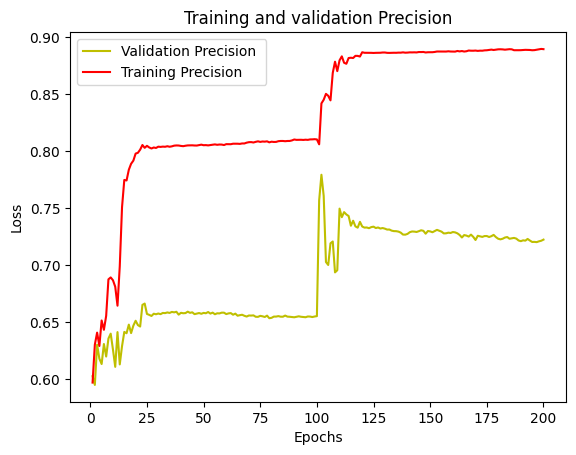

In [423]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_precision) + 1)
plt.plot(epochs, val_precision, 'y', label='Validation Precision ')
plt.plot(epochs, train_precision, 'r', label='Training Precision')
plt.title('Training and validation Precision')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

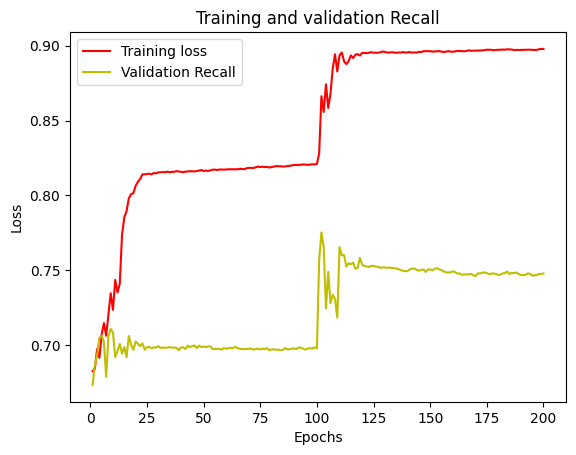

In [424]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_recall) + 1)
plt.plot(epochs, train_recall, 'r', label='Training loss')
plt.plot(epochs, val_recall, 'y', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

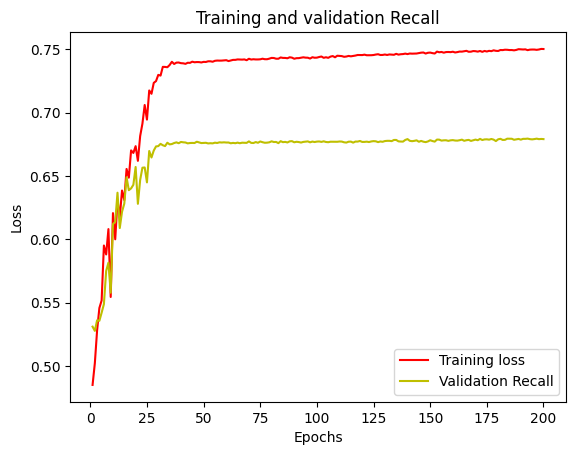

In [225]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_recall) + 1)
plt.plot(epochs, train_recall, 'r', label='Training loss')
plt.plot(epochs, val_recall, 'y', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

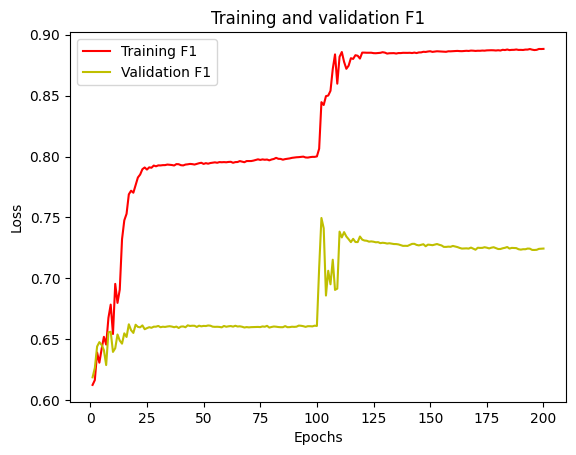

In [425]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_f1) + 1)
plt.plot(epochs, train_f1, 'r', label='Training F1')
plt.plot(epochs, val_f1, 'y', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

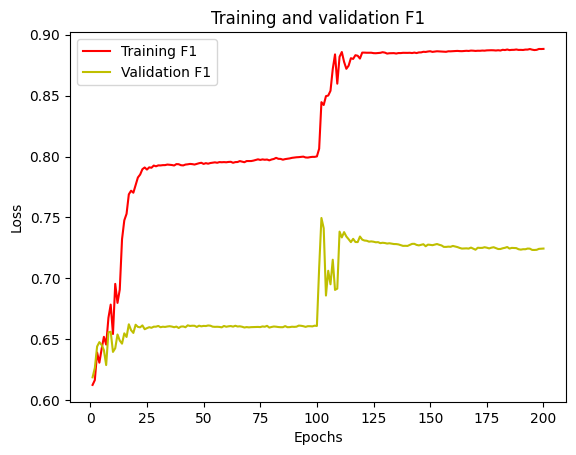

In [426]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_f1) + 1)
plt.plot(epochs, train_f1, 'r', label='Training F1')
plt.plot(epochs, val_f1, 'y', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

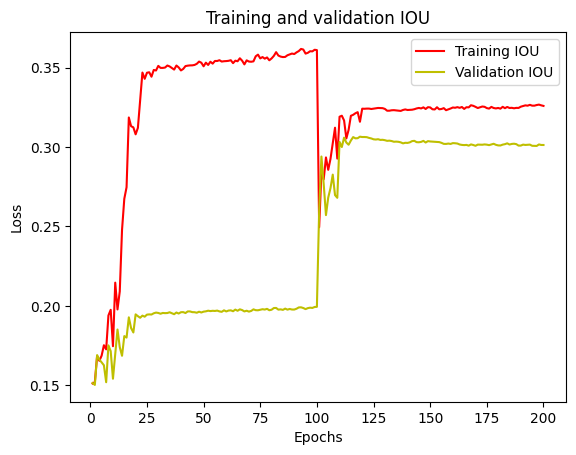

In [427]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_iou) + 1)
plt.plot(epochs, train_iou, 'r', label='Training IOU')
plt.plot(epochs, val_iou, 'y', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

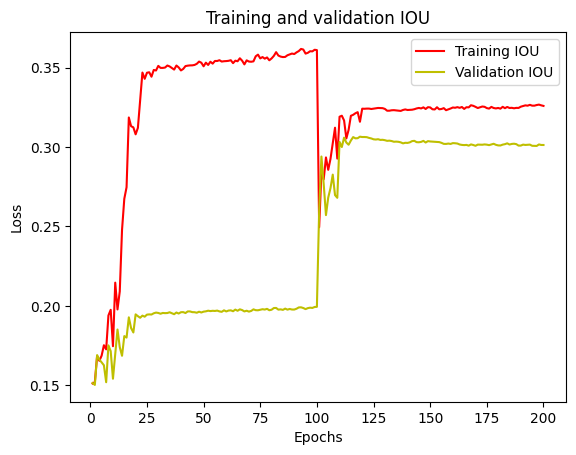

In [428]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_iou) + 1)
plt.plot(epochs, train_iou, 'r', label='Training IOU')
plt.plot(epochs, val_iou, 'y', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

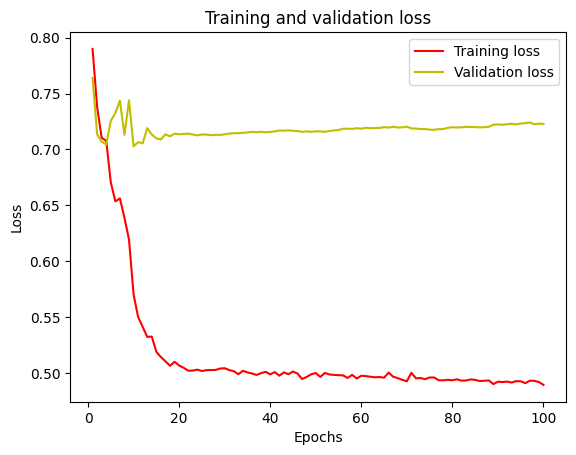

In [429]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

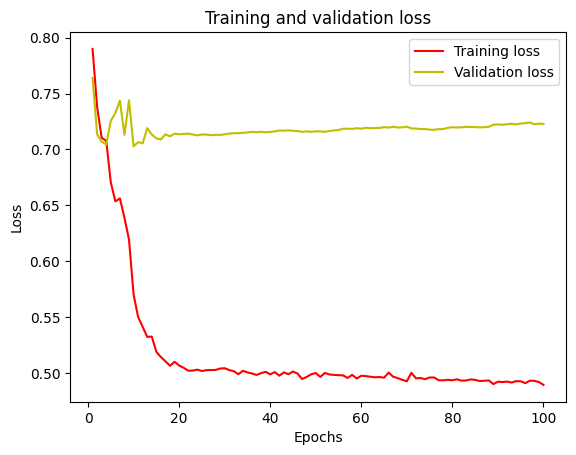

In [430]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

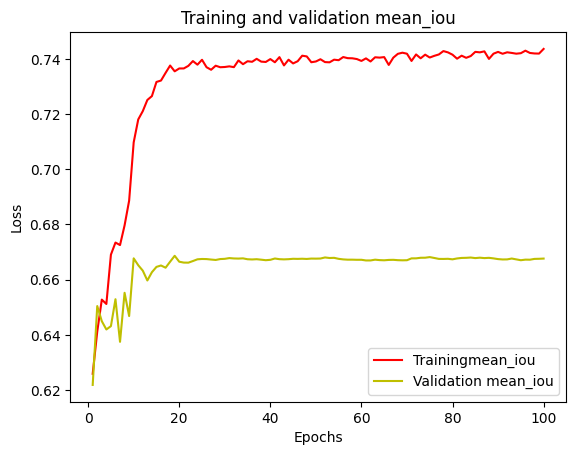

In [431]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['mean_iou']
val_loss = history.history['val_mean_iou']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Trainingmean_iou')
plt.plot(epochs, val_loss, 'y', label='Validation mean_iou')
plt.title('Training and validation mean_iou')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

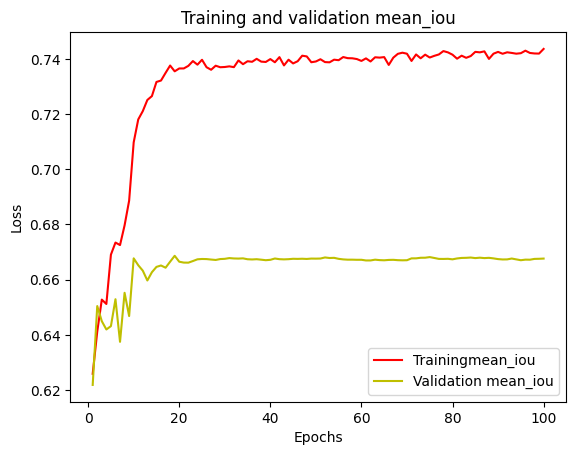

In [432]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['mean_iou']
val_loss = history.history['val_mean_iou']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Trainingmean_iou')
plt.plot(epochs, val_loss, 'y', label='Validation mean_iou')
plt.title('Training and validation mean_iou')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

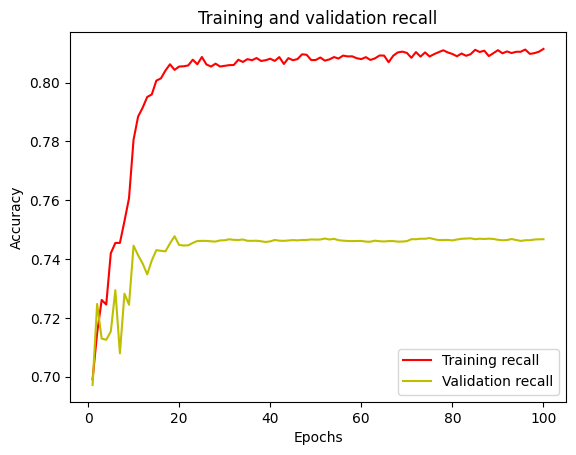

In [433]:
acc = history.history['recall']
val_acc = history.history['val_recall']

plt.plot(epochs, acc, 'r', label='Training recall')
plt.plot(epochs, val_acc, 'y', label='Validation recall')
plt.title('Training and validation recall')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

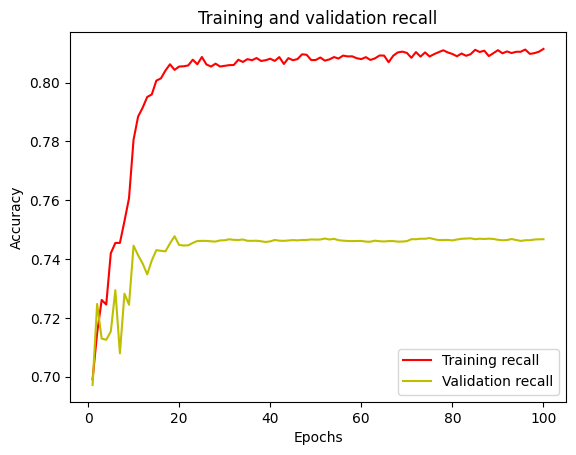

In [434]:
acc = history.history['recall']
val_acc = history.history['val_recall']

plt.plot(epochs, acc, 'r', label='Training recall')
plt.plot(epochs, val_acc, 'y', label='Validation recall')
plt.title('Training and validation recall')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

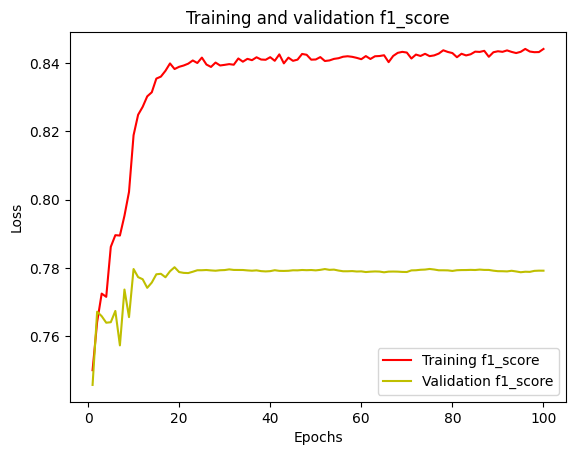

In [435]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1_score')
plt.plot(epochs, val_loss, 'y', label='Validation f1_score')
plt.title('Training and validation f1_score')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

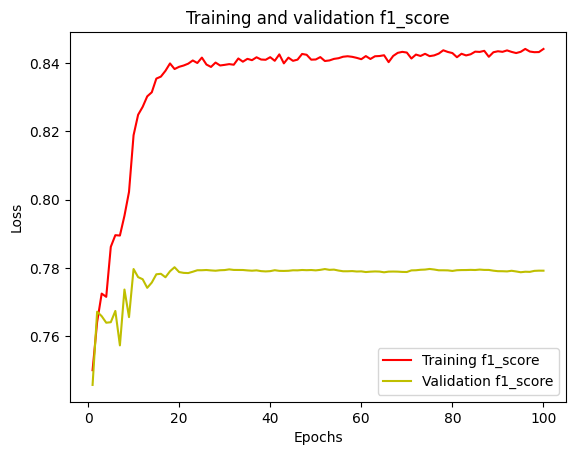

In [436]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1_score')
plt.plot(epochs, val_loss, 'y', label='Validation f1_score')
plt.title('Training and validation f1_score')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

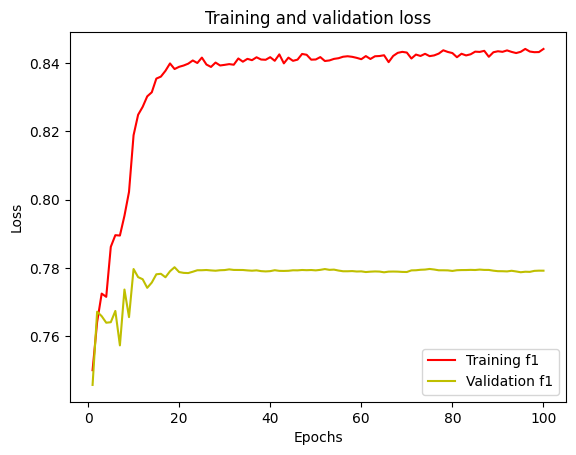

In [437]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1')
plt.plot(epochs, val_loss, 'y', label='Validation f1')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

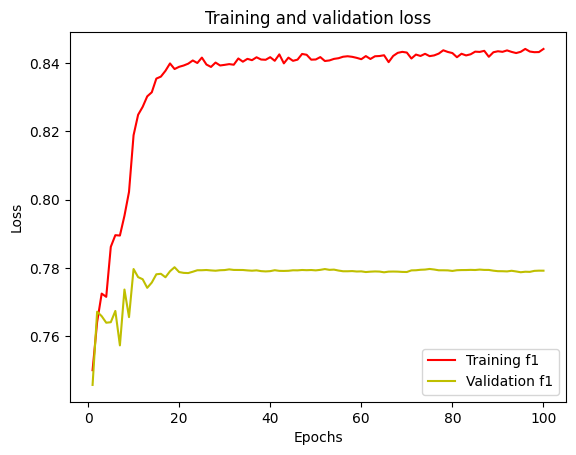

In [438]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1')
plt.plot(epochs, val_loss, 'y', label='Validation f1')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [439]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'mean_iou', 'recall', 'f1_score', 'val_loss', 'val_accuracy', 'val_mean_iou', 'val_recall', 'val_f1_score', 'lr'])

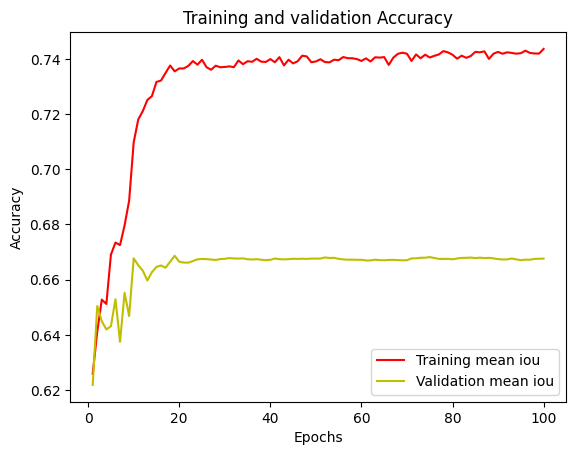

In [441]:
acc = history.history['mean_iou']
val_acc = history.history['val_mean_iou']

plt.plot(epochs, acc, 'r', label='Training mean iou')
plt.plot(epochs, val_acc, 'y', label='Validation mean iou')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

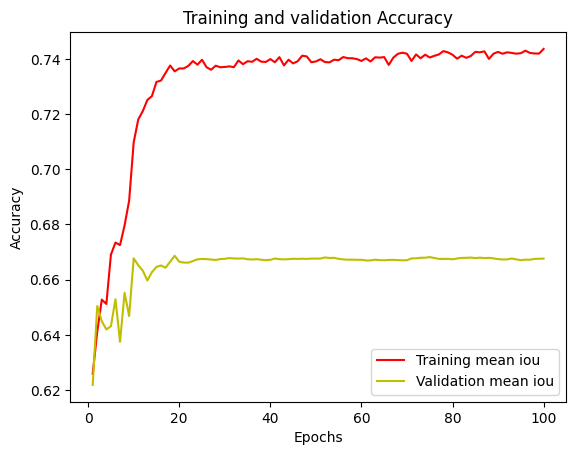

In [442]:
acc = history.history['mean_iou']
val_acc = history.history['val_mean_iou']

plt.plot(epochs, acc, 'r', label='Training mean iou')
plt.plot(epochs, val_acc, 'y', label='Validation mean iou')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
test56.txt

In [ ]:
%tensorboard --logdir '/kaggle/working/LOGS'

In [443]:
#Save history 
my_file = open('./history_.txt','w+')
with open("history_14__best.txt", 'w+') as f:
    for key, value in history.history.items():
        f.write('%s:%s\n' % (key, value))


In [444]:
#Save history 
my_file = open('./history_14_test_val.txt','w+')
with open("history_14_test_val_aug.txt", 'w+') as f:
    for key,val in metrics_callback.metrics_history.items():
        f.write('%s: %s' % (key,val))

In [320]:
type(metrics_callback.metrics_history)

dict

In [445]:
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

5/5 [==============================] - 0s 28ms/step


In [446]:
y_test.shape

(135, 128, 128, 1)

In [447]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = n_classes
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.30621895


In [448]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])


print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)


[[1.152422e+06 1.691000e+04 4.925000e+03 1.605700e+04 3.286000e+04
  1.399300e+04 1.866000e+04 7.630000e+02 1.632400e+04 1.689000e+03
  1.771000e+03 5.552000e+03 5.700000e+02 0.000000e+00]
 [3.457100e+04 1.045260e+05 4.106000e+03 1.676000e+03 1.300000e+03
  7.300000e+01 1.870000e+02 3.500000e+01 3.200000e+01 7.000000e+00
  1.950000e+02 0.000000e+00 2.960000e+03 0.000000e+00]
 [9.688000e+03 1.756000e+03 1.717090e+05 1.654000e+03 9.520000e+02
  9.500000e+01 3.800000e+01 1.000000e+00 6.200000e+01 8.200000e+01
  5.000000e+00 4.000000e+00 2.000000e+01 0.000000e+00]
 [3.177400e+04 5.107000e+03 2.999000e+03 8.235600e+04 5.050000e+02
  6.000000e+00 9.660000e+02 1.000000e+00 4.900000e+01 3.195000e+03
  6.100000e+01 8.440000e+02 1.400000e+01 0.000000e+00]
 [3.428600e+04 1.528000e+03 3.036000e+03 4.200000e+01 1.440870e+05
  1.500000e+01 4.500000e+01 0.000000e+00 5.900000e+01 4.000000e+00
  7.700000e+01 1.000000e+00 0.000000e+00 0.000000e+00]
 [2.206000e+04 3.170000e+02 2.500000e+01 3.500000e+01 2

In [449]:
# Get the confusion matrix from the metric's weights
confusion_matrix = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)

# Compute IoU for each class using the confusion matrix
iou_per_class = np.diag(confusion_matrix) / (np.sum(confusion_matrix, axis=1) + np.sum(confusion_matrix, axis=0) - np.diag(confusion_matrix))

# Print IoU for each class
for i, iou in enumerate(iou_per_class):
    print(f"Class {i}: IoU = {iou:.4f}")

Class 0: IoU = 0.7418
Class 1: IoU = 0.5505
Class 2: IoU = 0.8398
Class 3: IoU = 0.5329
Class 4: IoU = 0.6512
Class 5: IoU = 0.0801
Class 6: IoU = 0.3189
Class 7: IoU = 0.0411
Class 8: IoU = 0.2496
Class 9: IoU = 0.0583
Class 10: IoU = 0.0000
Class 11: IoU = 0.0012
Class 12: IoU = 0.2205
Class 13: IoU = 0.0011


In [102]:
values.shape

(14, 14)

Classes in image :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


Text(0.5, 1.0, 'Coloured class mask')

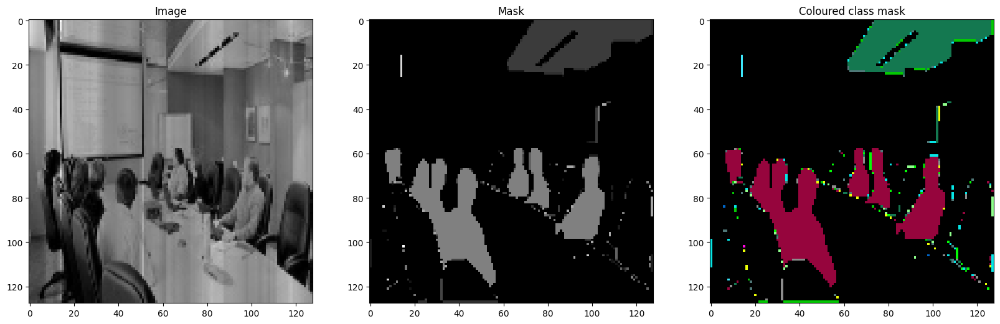

In [450]:
#Sanity check
print("Classes in image : ",np.unique(train_masks))
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(train_images[1, :,:,0], cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(train_masks[1],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[1],cmap='gray')
plt.title("Coloured class mask")

In [451]:
#Randomly selecting images to test
test_img_number = random.randint(0, len(X1))
test_img = X1[test_img_number]
ground_truth=y1[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 24ms/step


Unique classes in test_img Image:  [0.00489703 0.00614551 0.00618286 ... 0.14016453 0.14415779 0.14588769]
Unique classes in ground_truth Image:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique classes in Predicted Image:  [0 4]


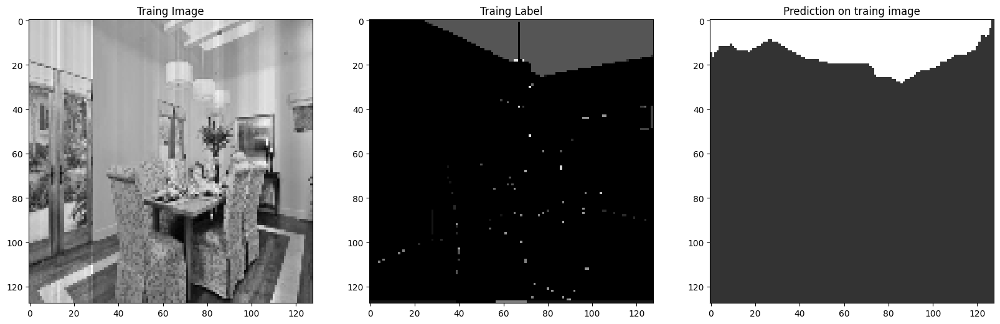

In [452]:
print("Unique classes in test_img Image: ",np.unique(test_img))
print("Unique classes in ground_truth Image: ",np.unique(ground_truth))
print("Unique classes in Predicted Image: ",np.unique(predicted_img))
plt.figure(figsize=(20, 20))
plt.subplot(231)
plt.title('Traing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Traing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')

plt.subplot(233)
plt.title('Prediction on traing image')
#plt.imshow(predicted_img, cmap='jet')


plt.imshow(predicted_img, cmap='gray', alpha=0.8) # interpolation='none'
plt.show()
plt.show()


In [317]:
ground_truth[:,:,0]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [318]:
!pip install visualkeras

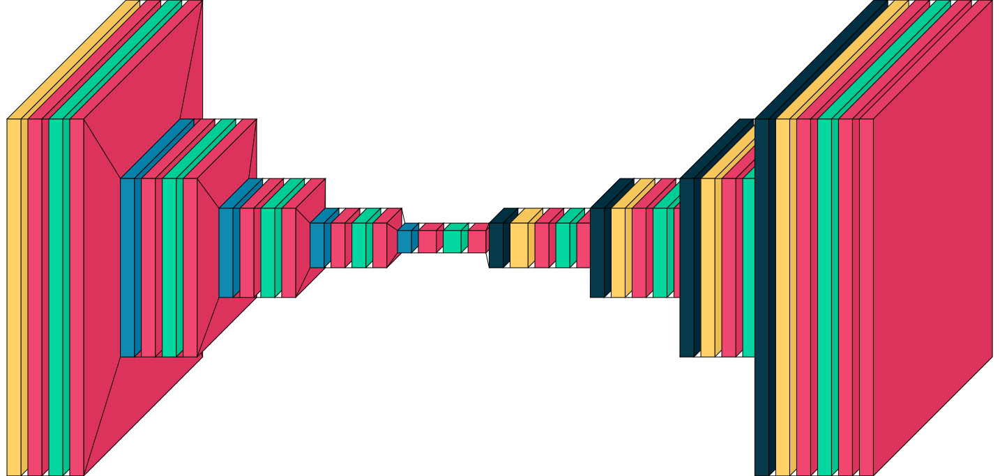

In [111]:
import visualkeras
visualkeras.layered_view(model,to_file='output.png')

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  4  5  7 10]


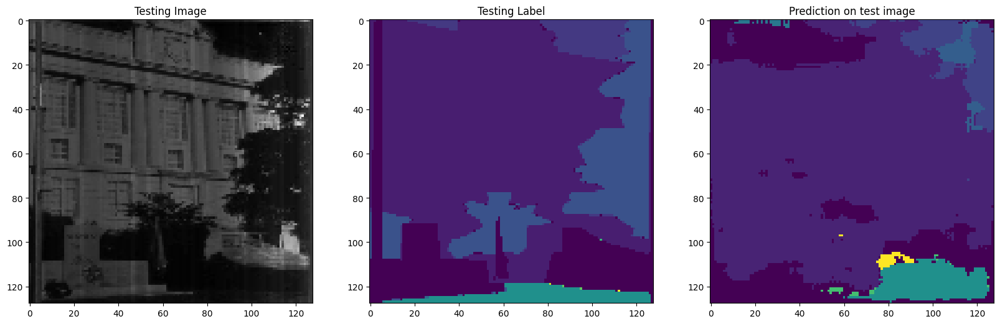

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 12 13]
Unique Classes in predicted taesting image  [ 0  2  6 11]


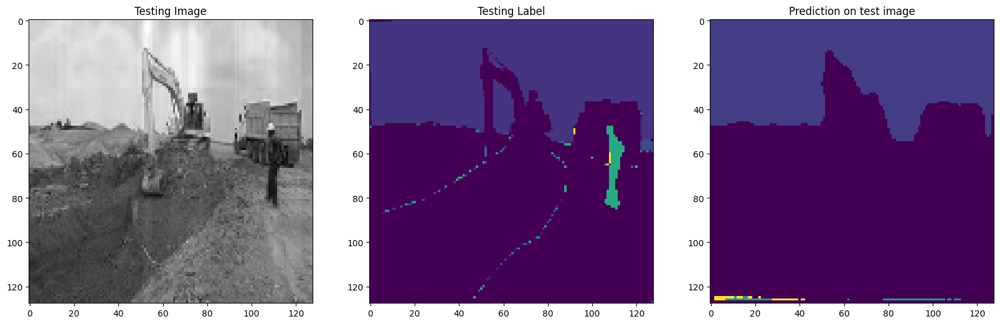

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 5 6]


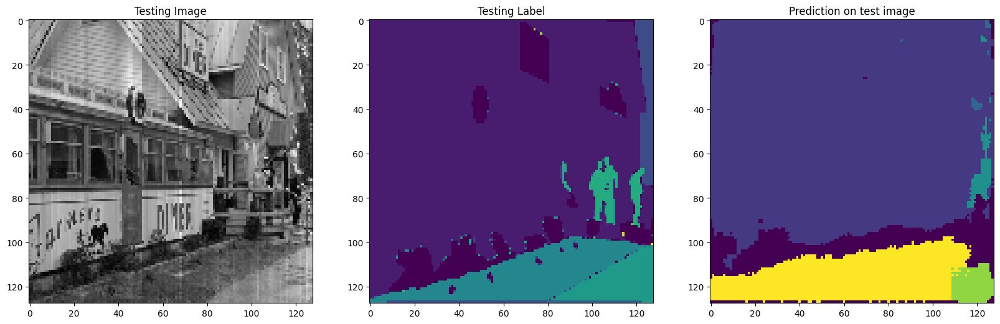

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  9 11]
Unique Classes in predicted taesting image  [ 0  4  5  6  7 11]


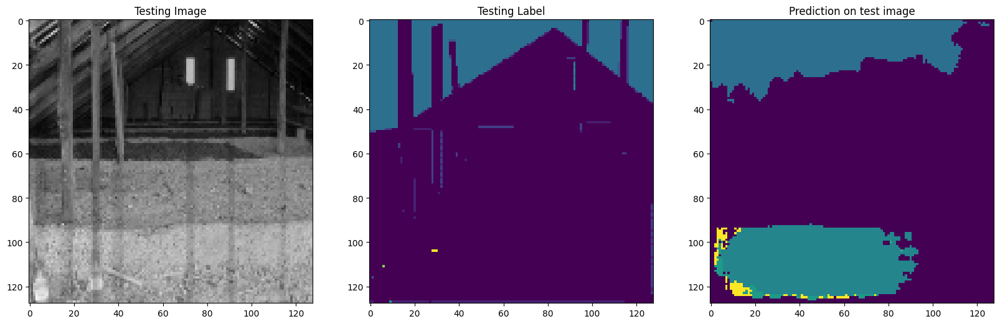

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 13]
Unique Classes in predicted taesting image  [ 0  2  3  6  9 11]


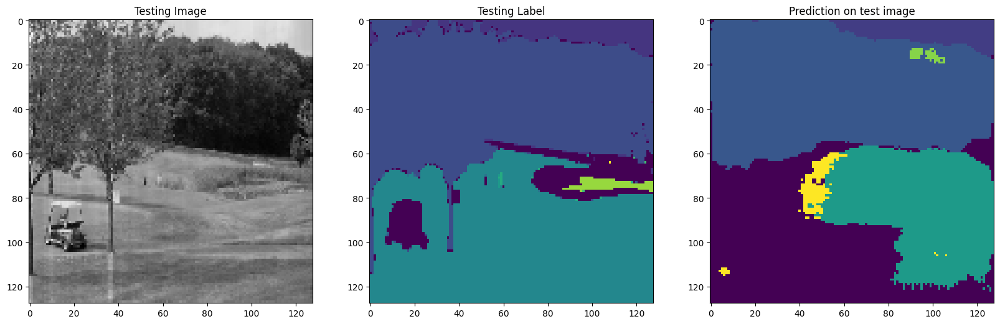

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  2  3  6 11]


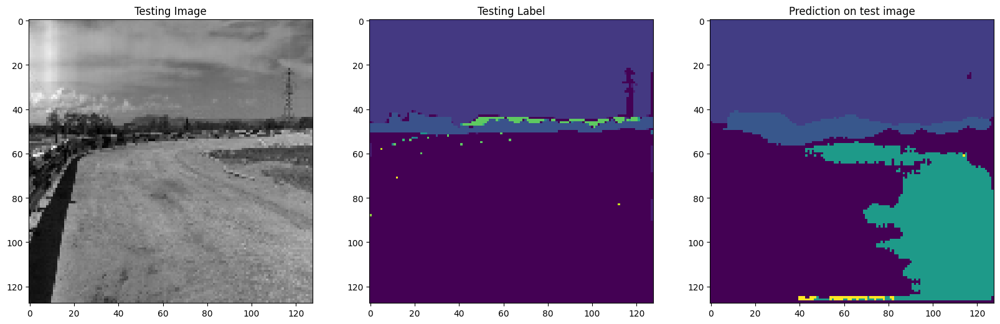

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4 8]


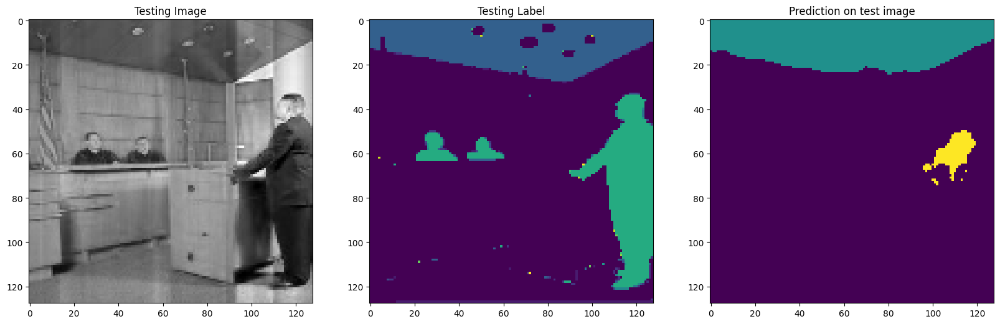

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 2 4]


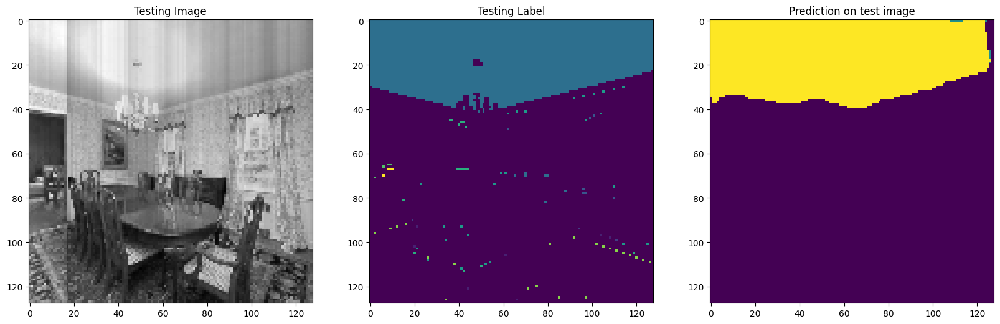

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [ 0  1  2  5  7 10]


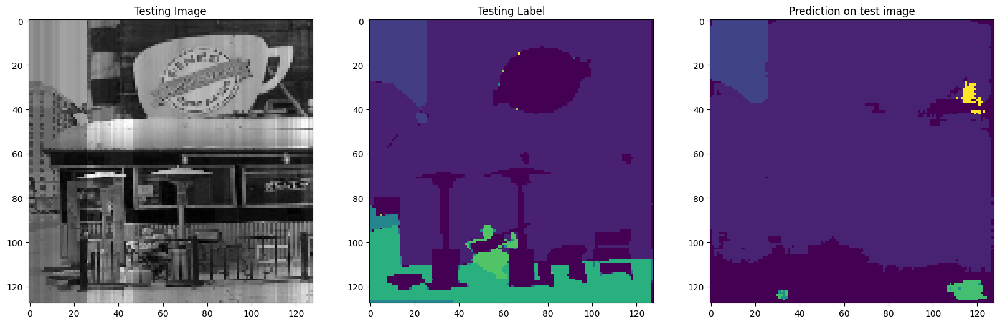

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 4]


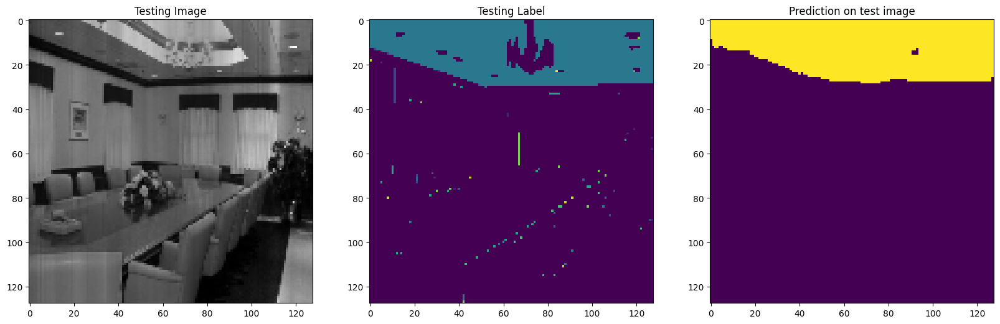

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [ 0  1  4  5  7  8 10]


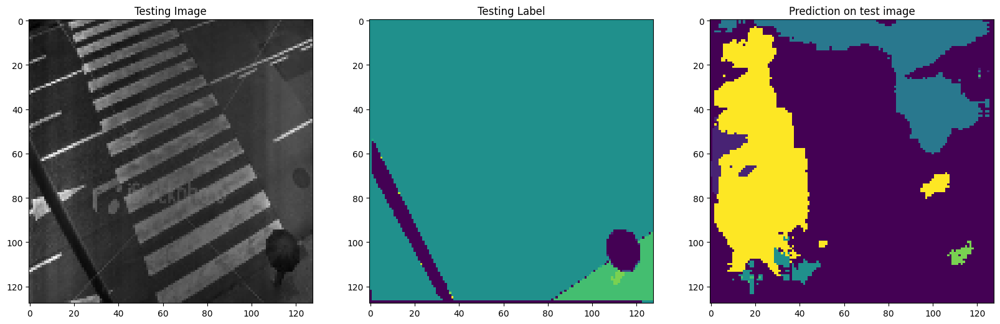

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


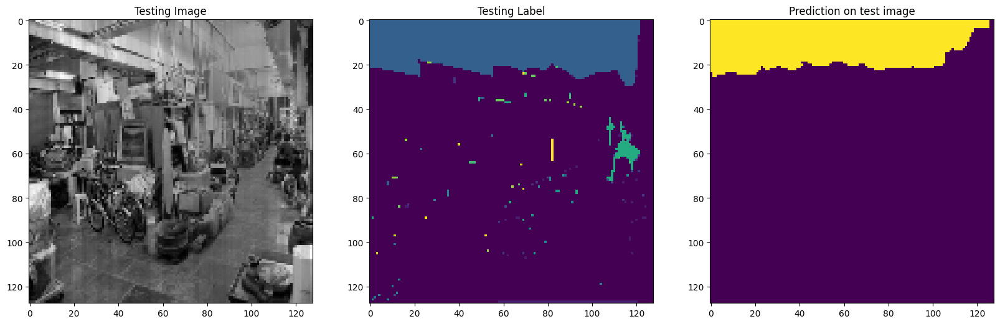

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 8]


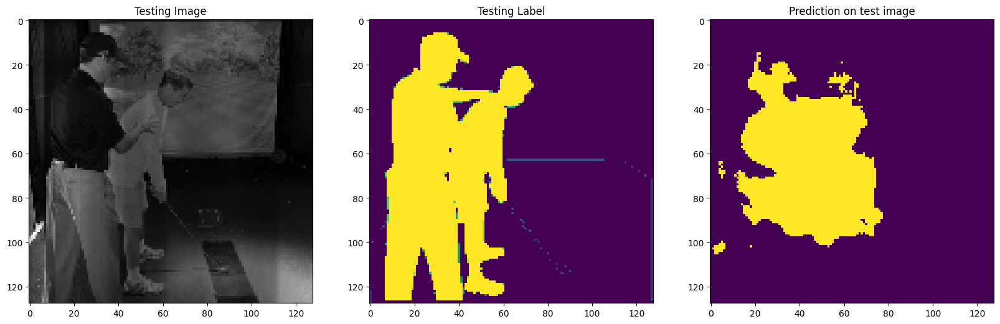

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4]


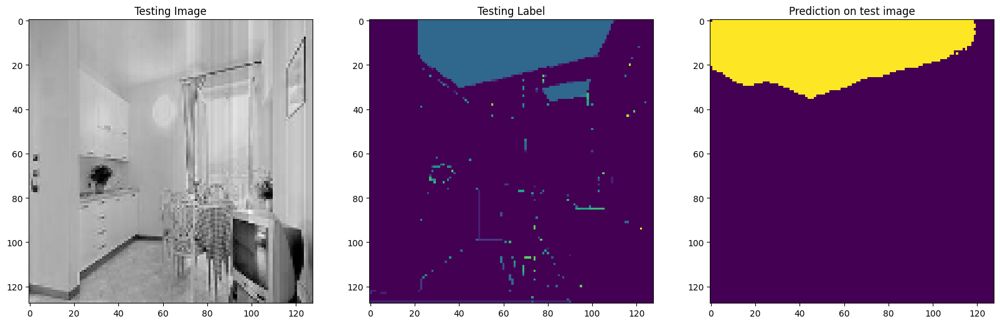

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 5]


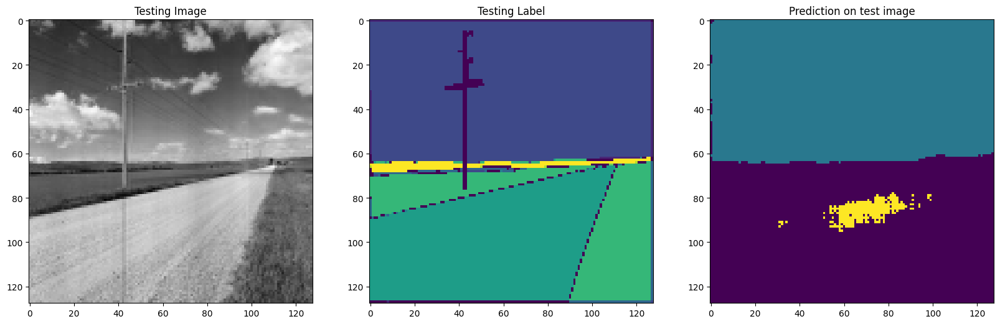

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 4]


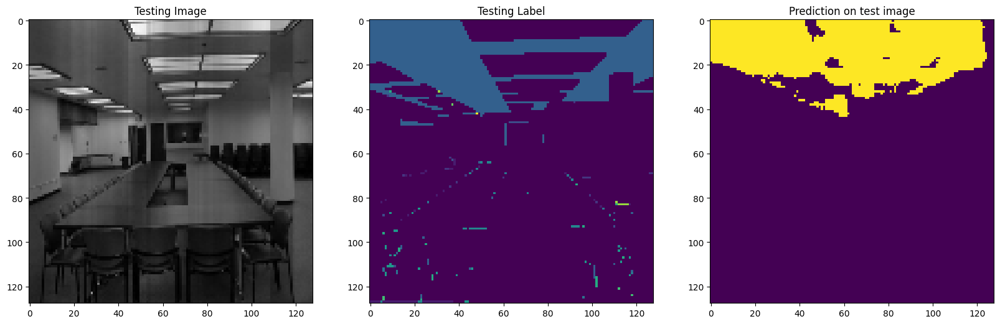

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 12]
Unique Classes in predicted taesting image  [0 4]


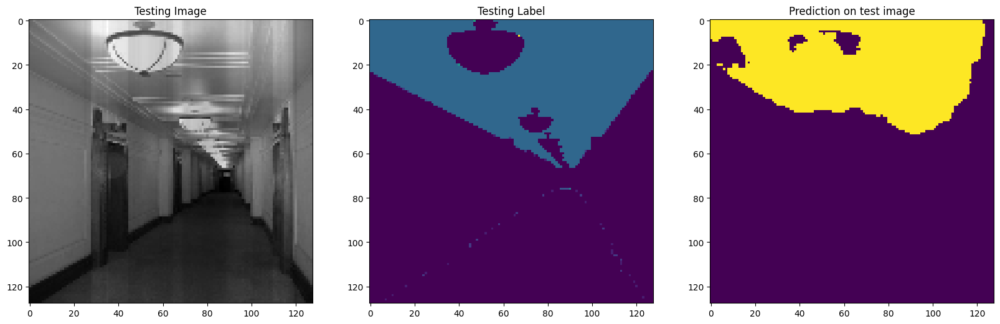

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [ 0  1  2  5  8 12]


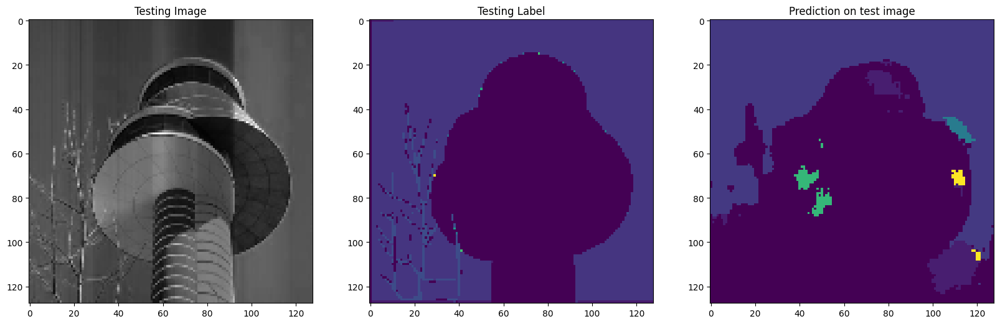

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 8]


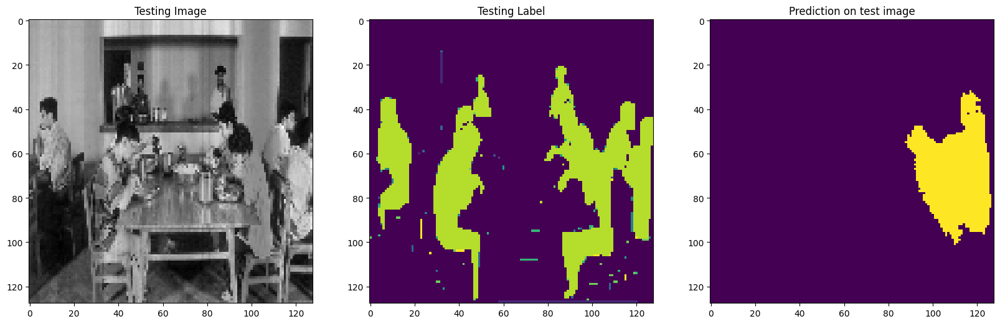

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  4  8 10]


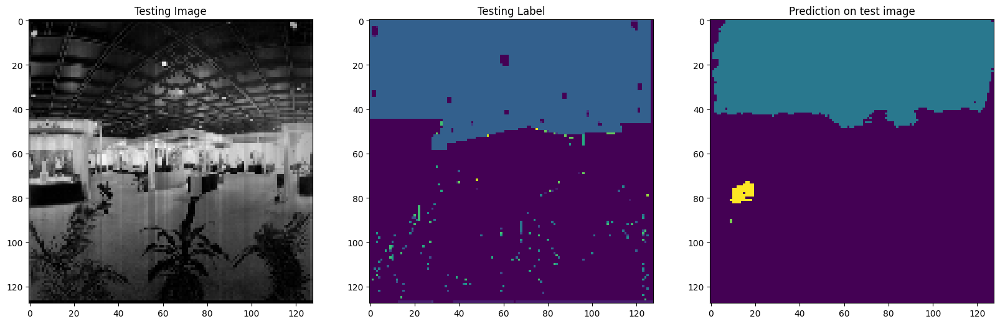

1/1 [==============================] - 0s 37ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


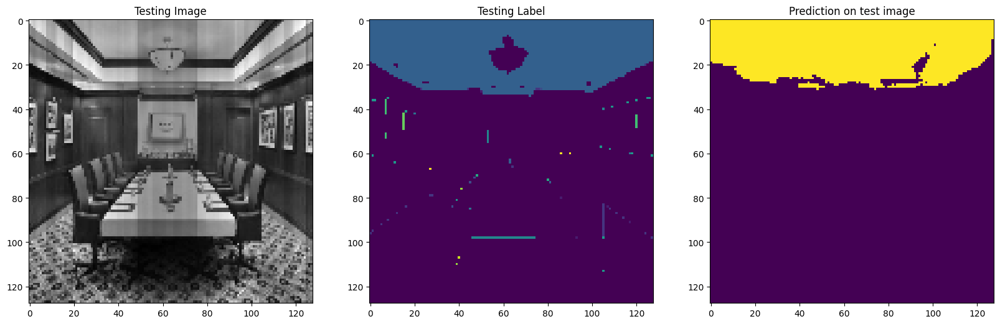

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


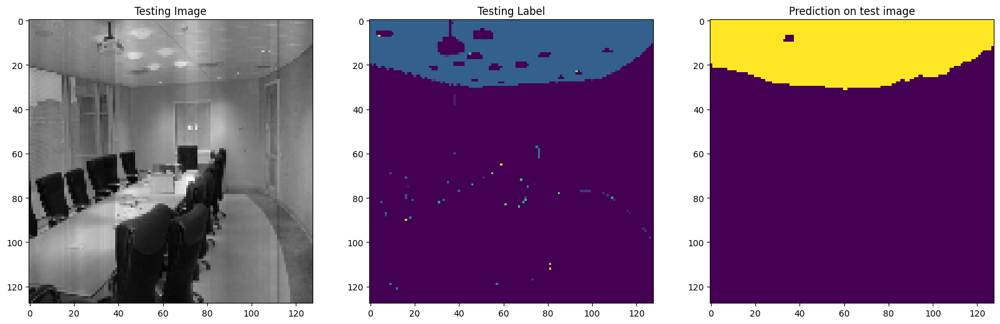

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  2  3 12]
Unique Classes in predicted taesting image  [ 0  3  6  9 11]


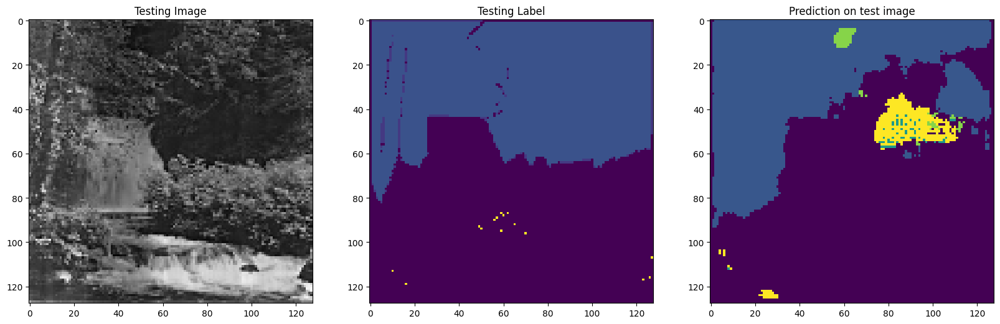

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 9]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 12]


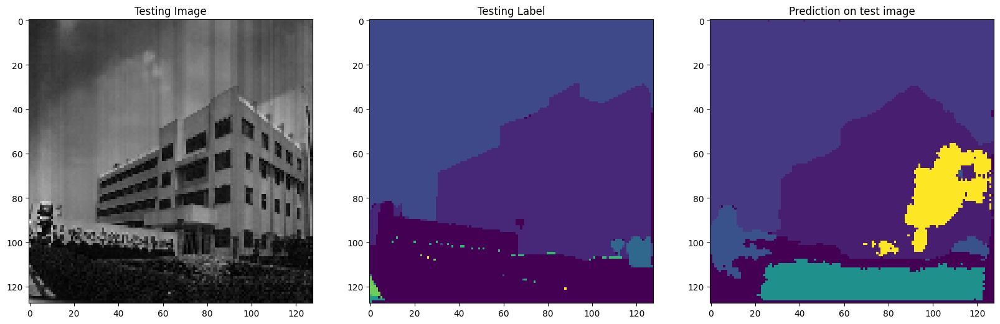

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 6 9]


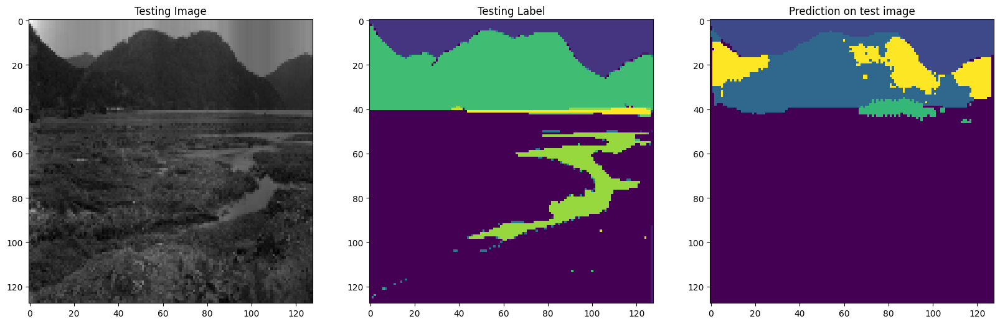

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4]


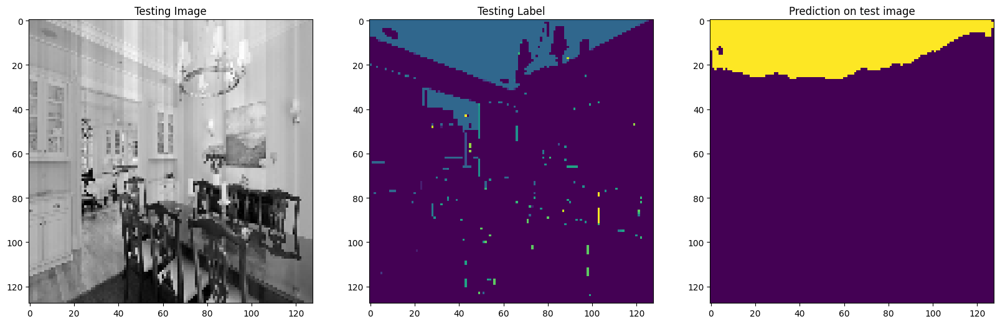

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 2 5 6 8]
Unique Classes in predicted taesting image  [ 0  6  8 10 11]


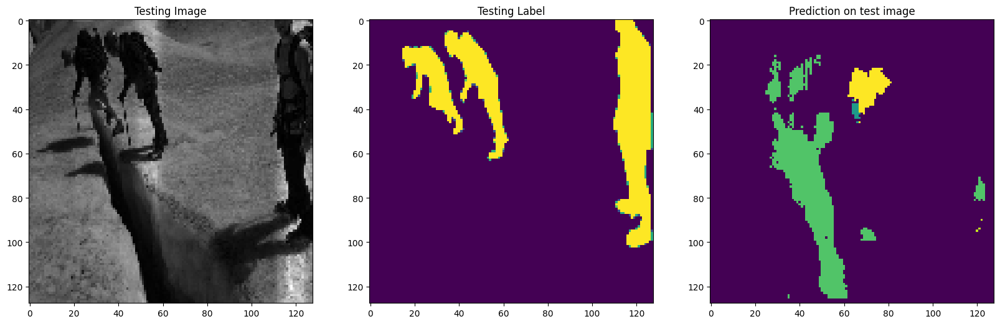

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 10 11 12]


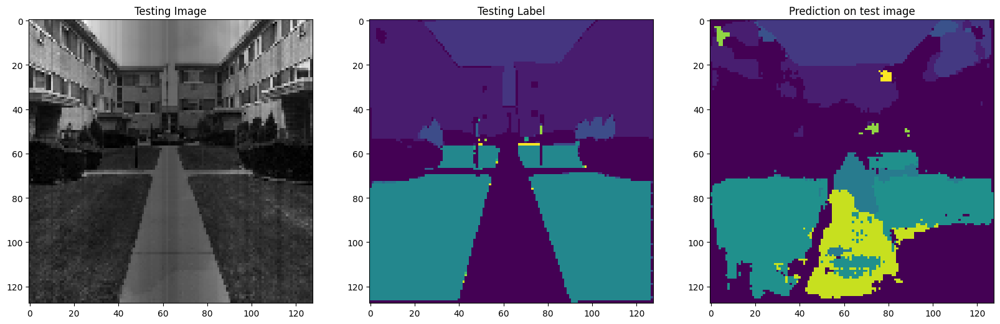

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6 13]
Unique Classes in predicted taesting image  [0 2 4]


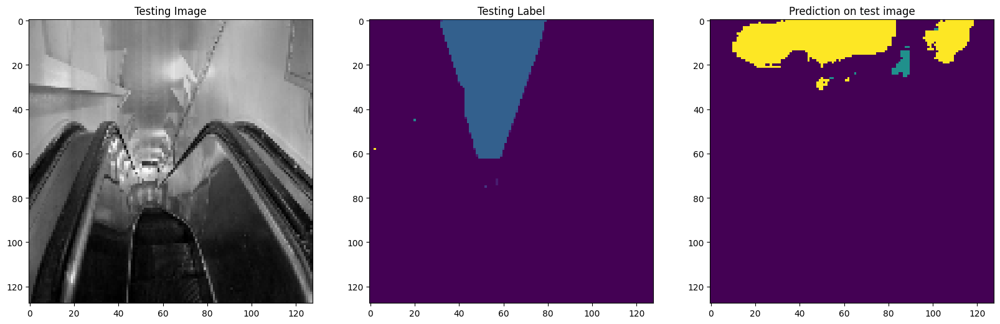

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  5  6 11]


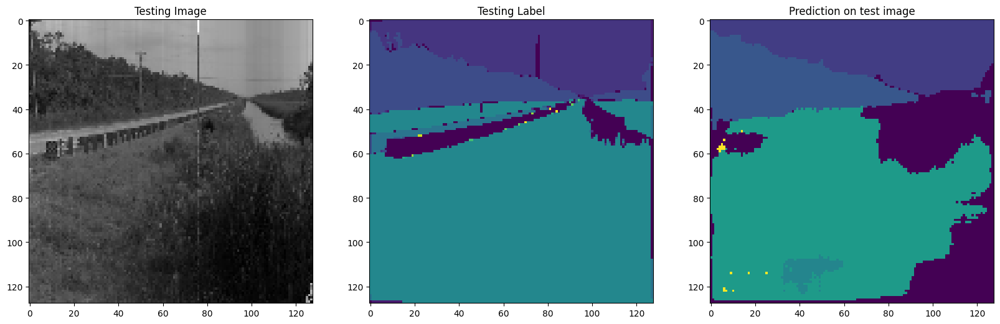

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  5  6 11]


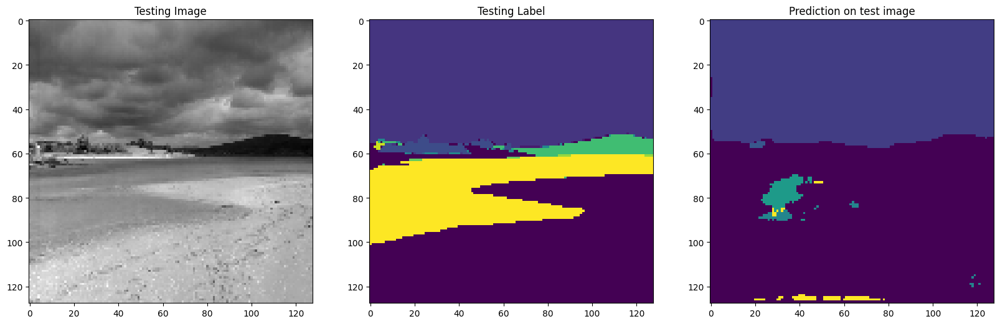

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  2  3  4  6 12 13]
Unique Classes in predicted taesting image  [ 0  2  3 11]


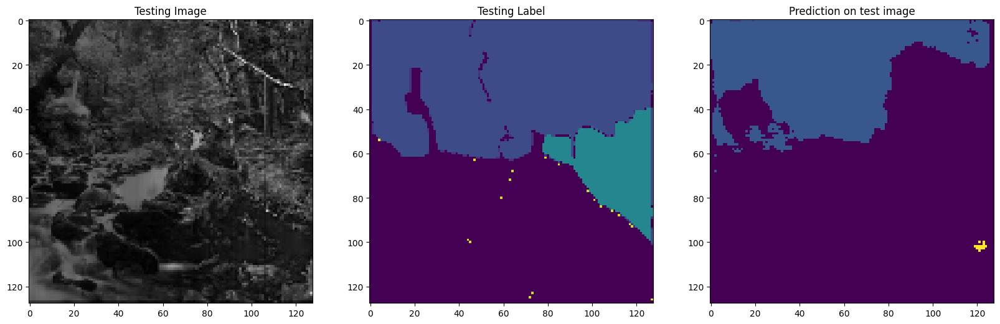

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 4 5 7]


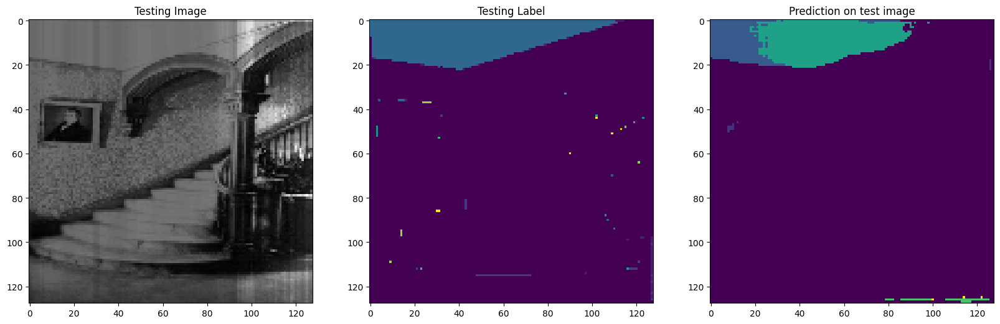

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [ 0  2  3  8 10 11]


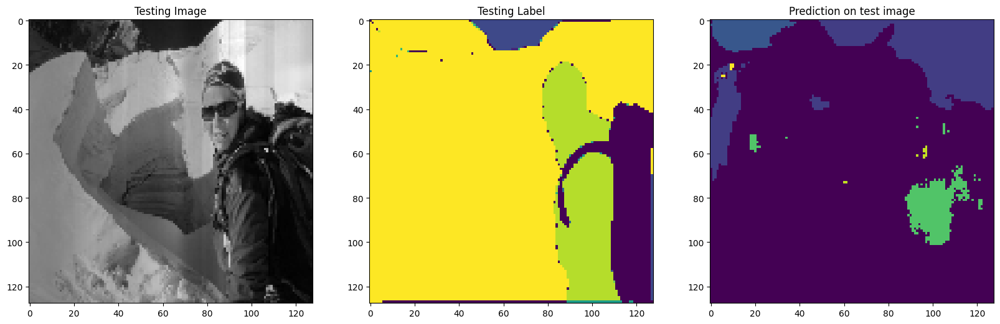

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 7]
Unique Classes in predicted taesting image  [0 4]


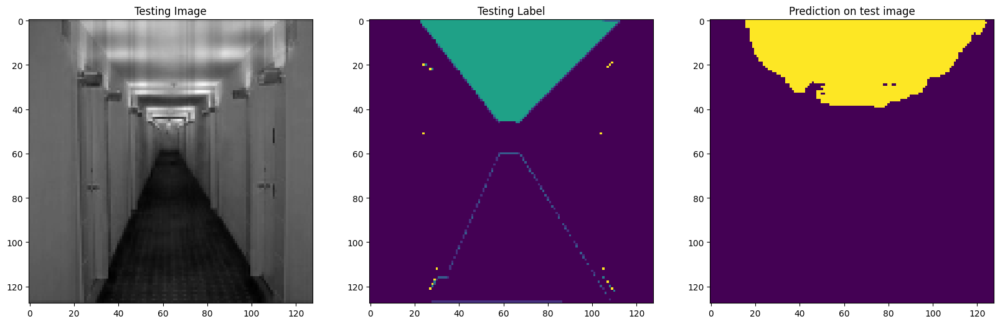

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 4]


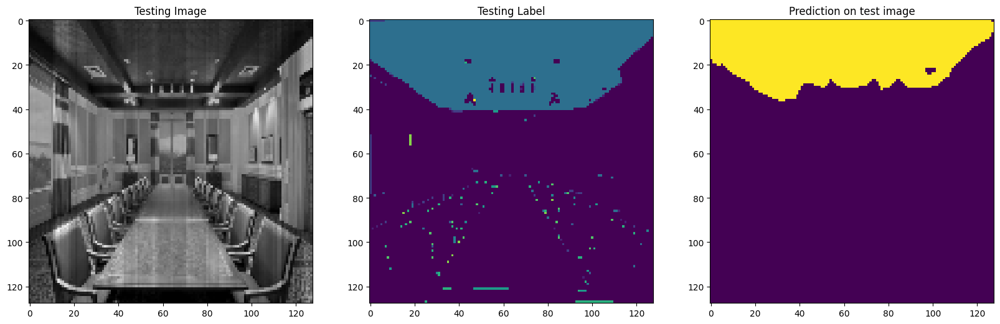

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 11 12]


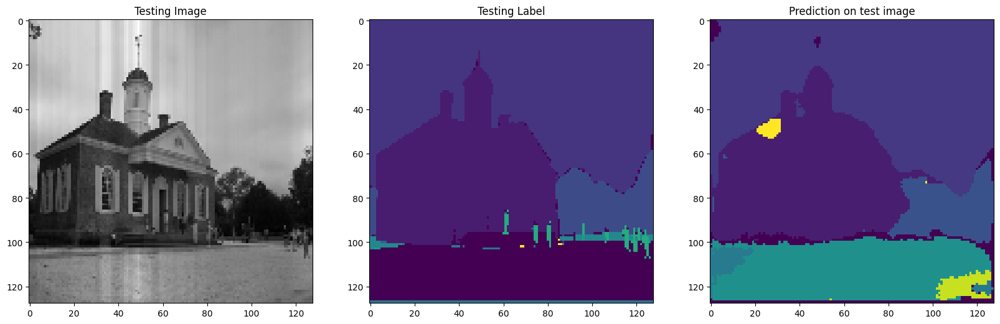

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  6  9 11]


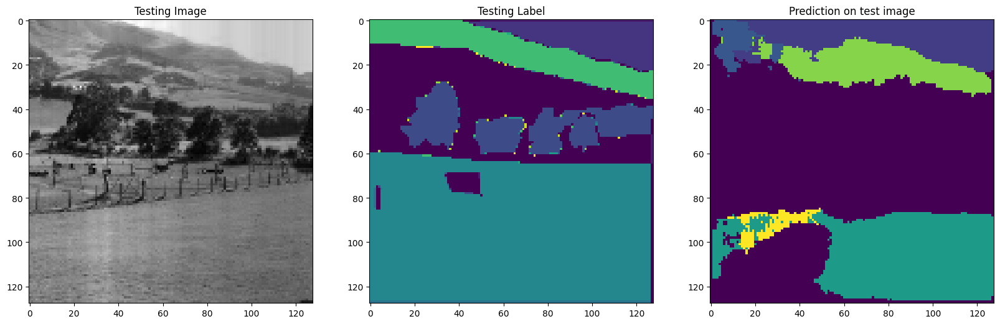

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 5 6 9]


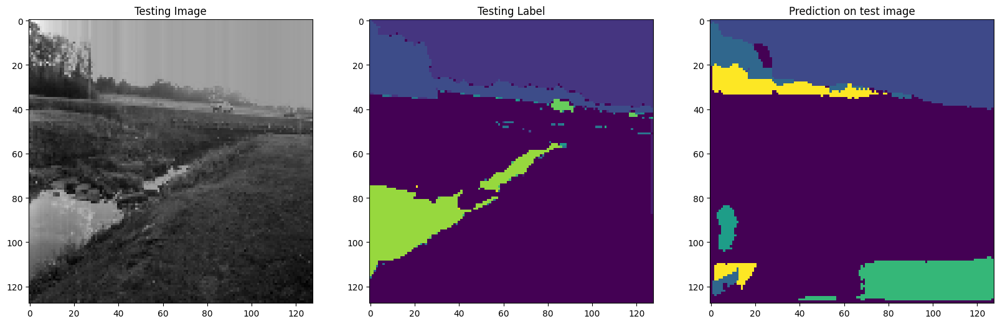

1/1 [==============================] - 0s 35ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  7 10 11]


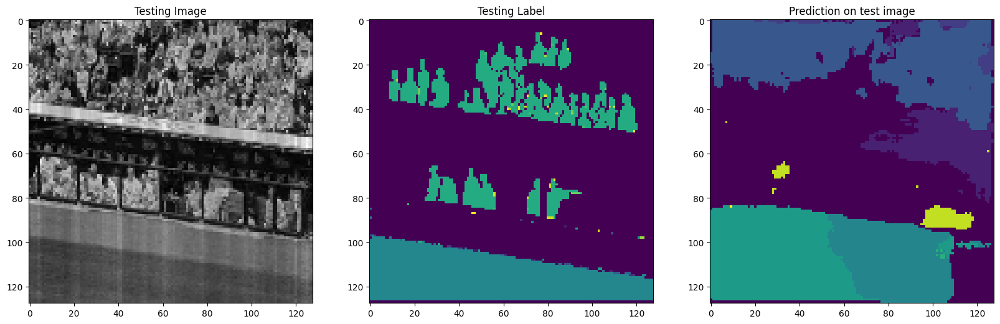

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 6]


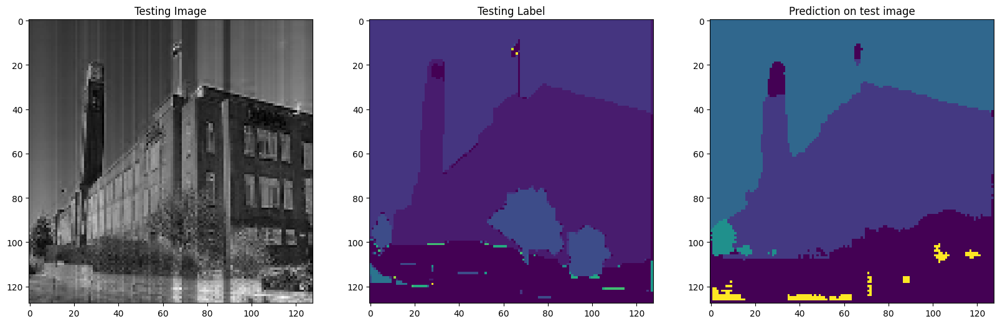

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 4 8]


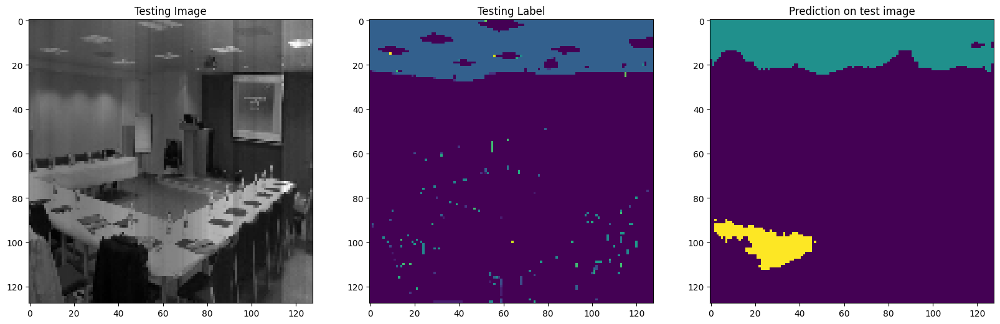

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 12]


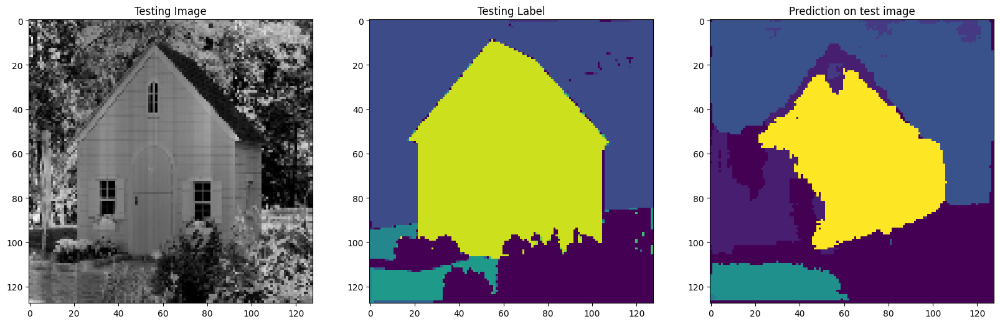

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  7  8 10 11]
Unique Classes in predicted taesting image  [0 4]


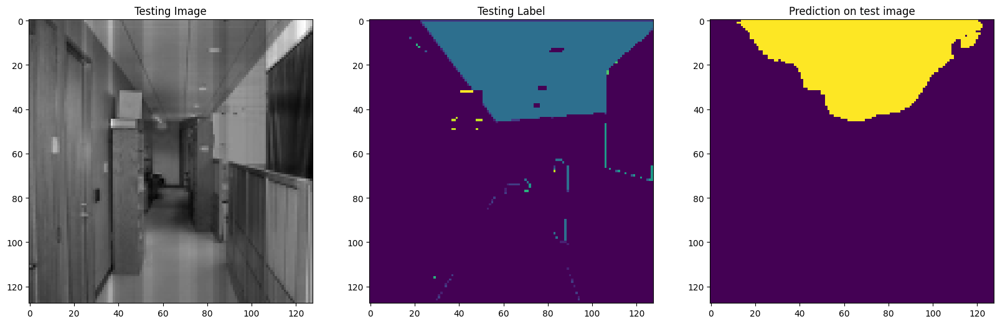

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  3  4  5  6 10 11 12]


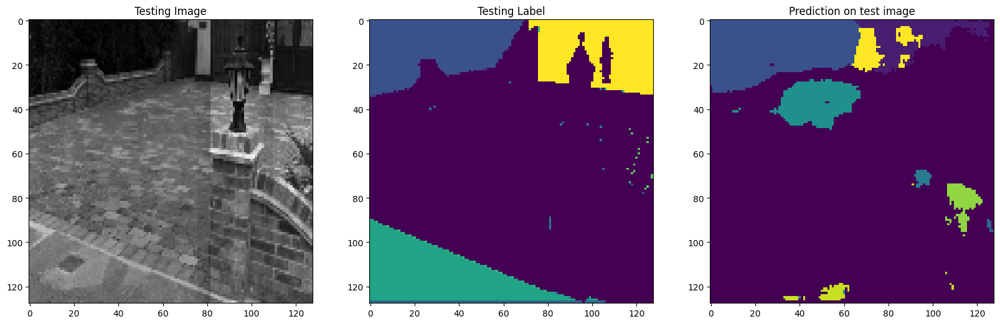

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11]
Unique Classes in predicted taesting image  [0 4]


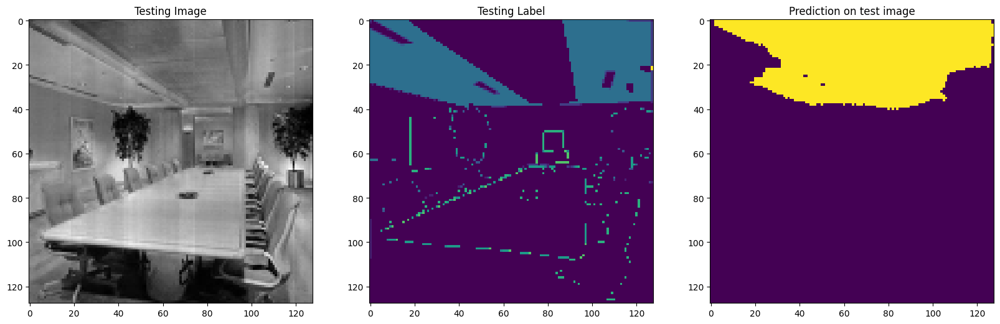

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [ 0  2  3  6  9 10 11]


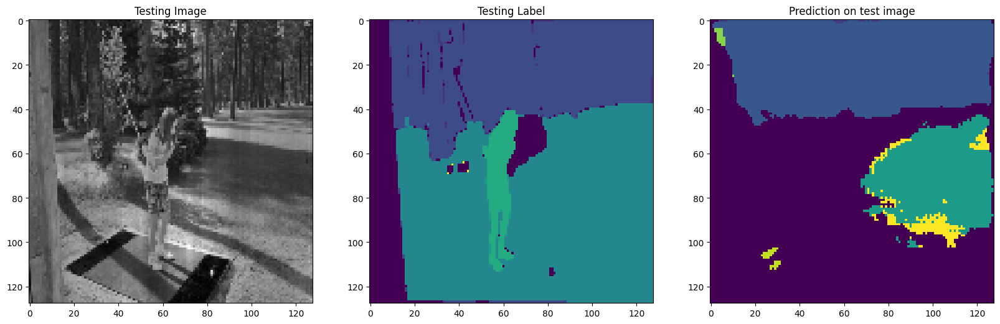

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 4]


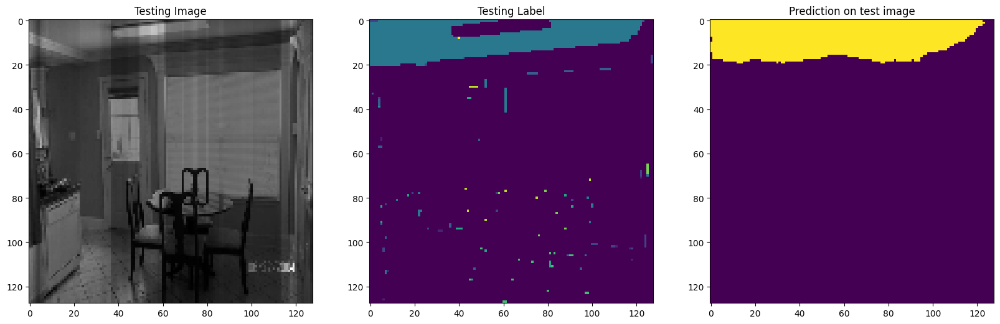

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [ 0  3  5  6 11]


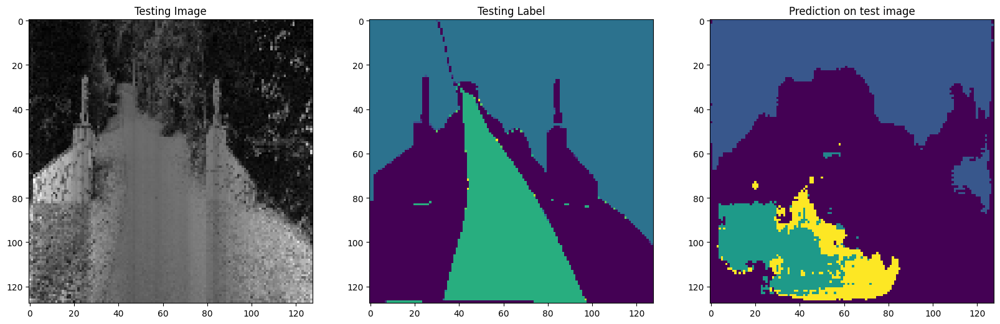

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 8]


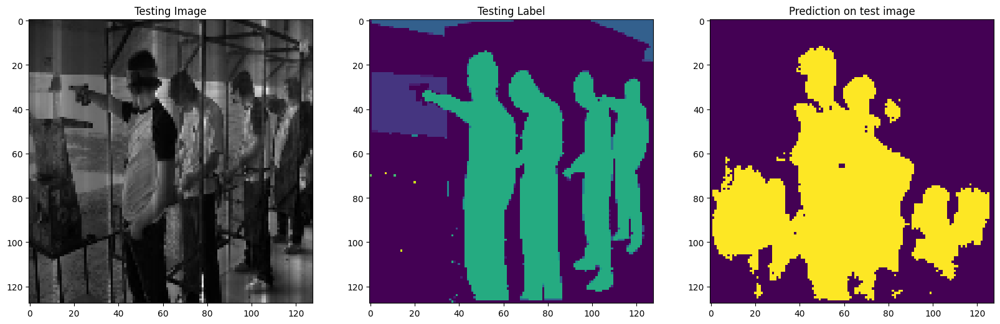

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2 3 6]


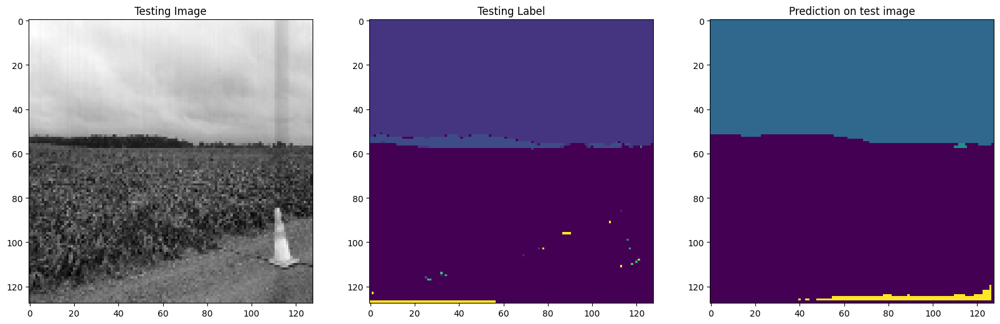

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 4 8]


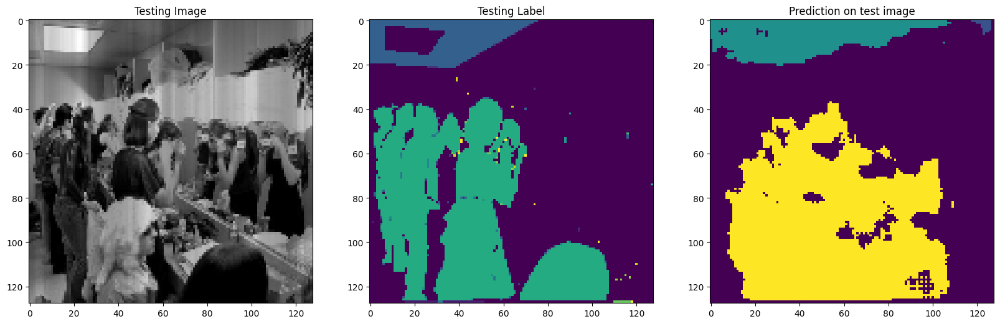

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 11]
Unique Classes in predicted taesting image  [0 4]


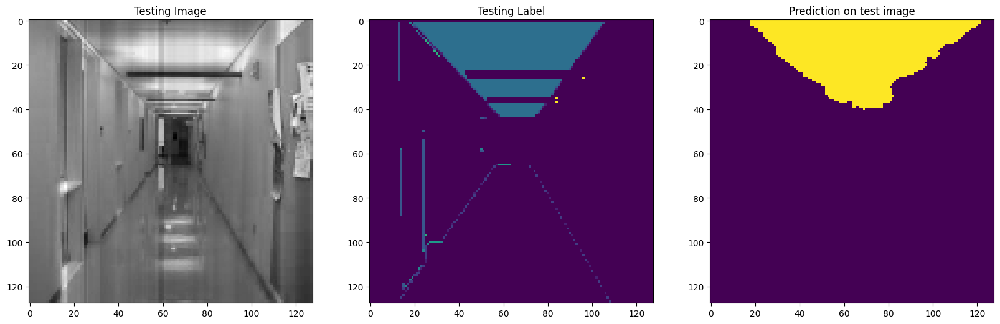

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 4 5 8]
Unique Classes in predicted taesting image  [0 4 8]


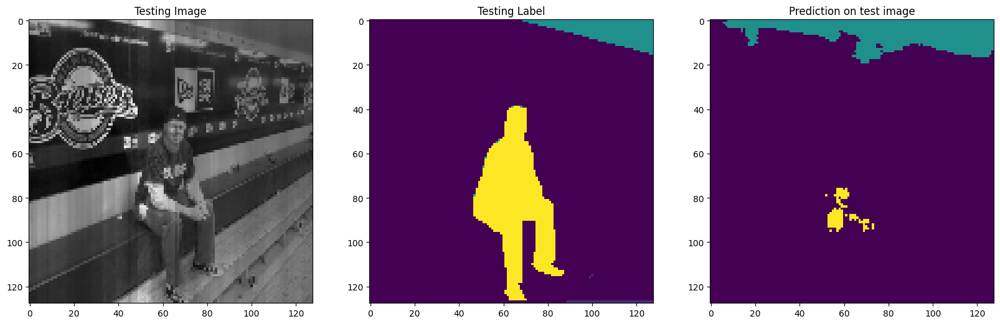

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 4]


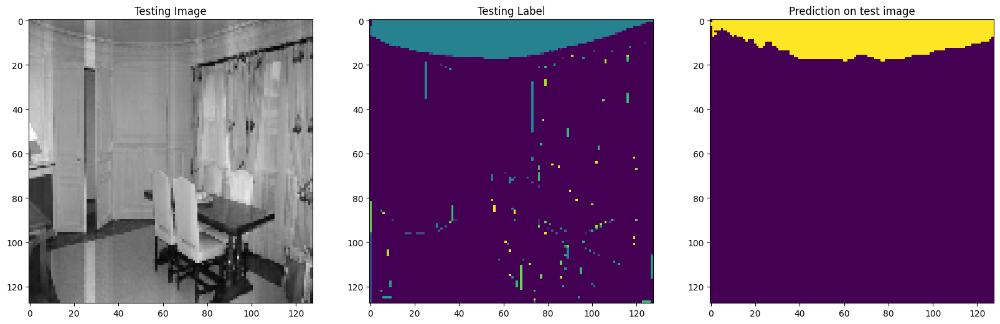

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 4]


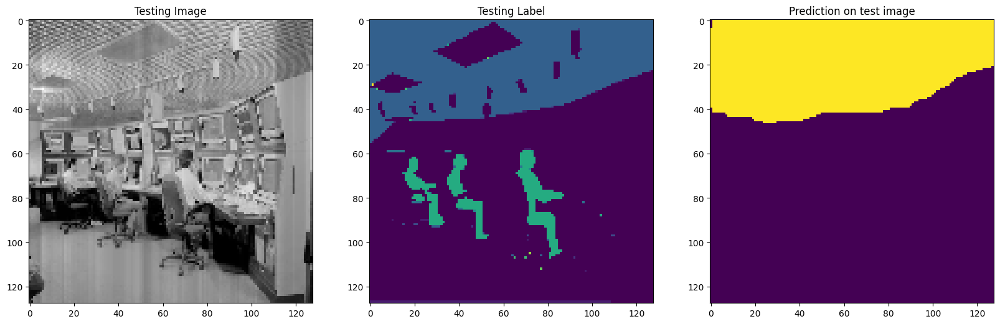

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3]


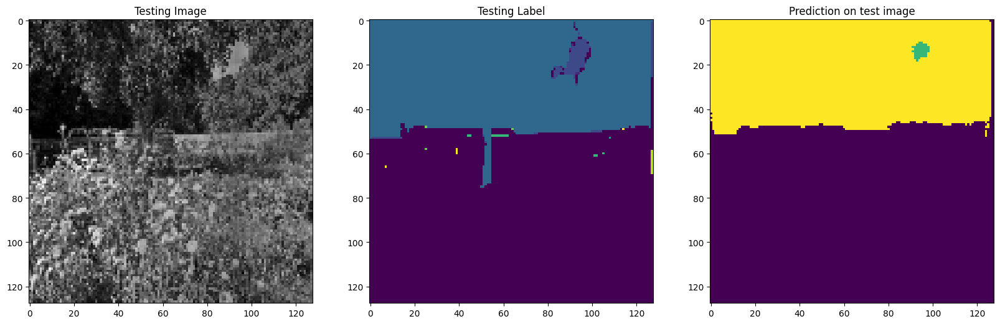

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 4]


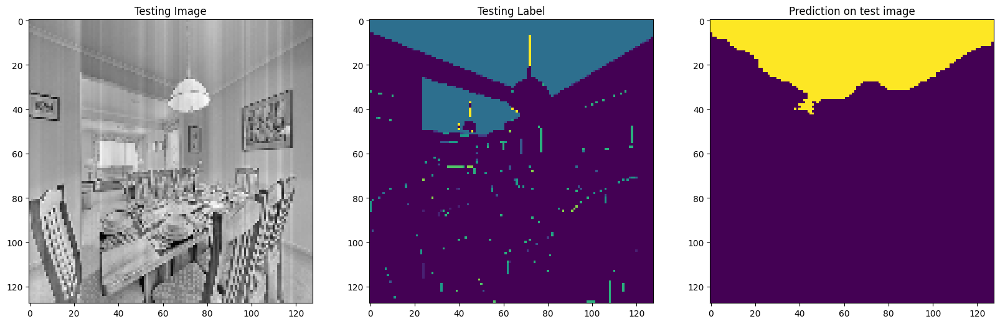

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 4]


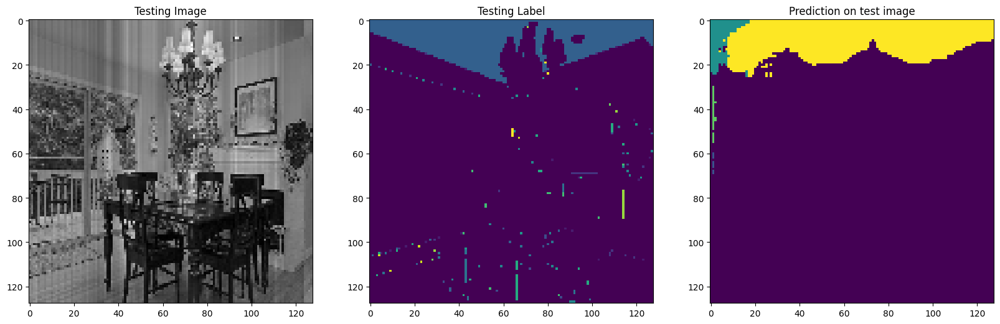

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4 8]


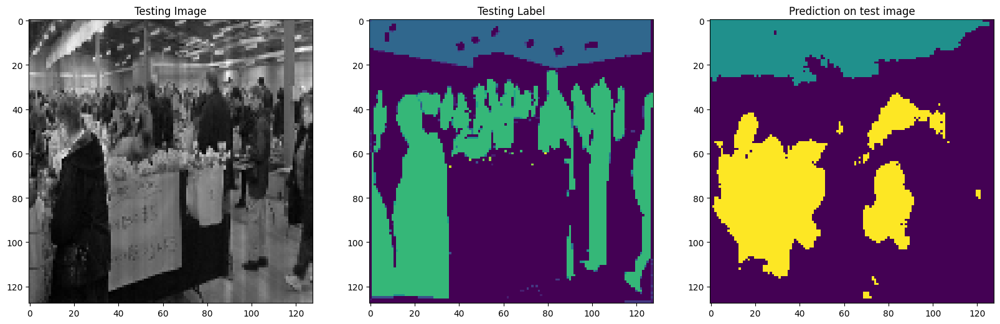

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3 12]


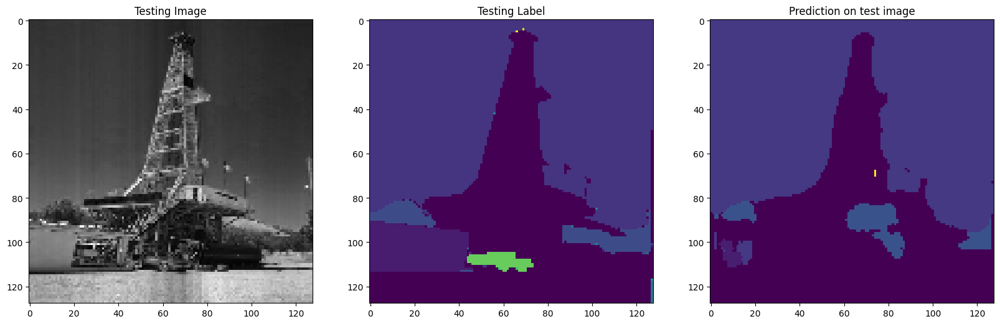

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 10 12]


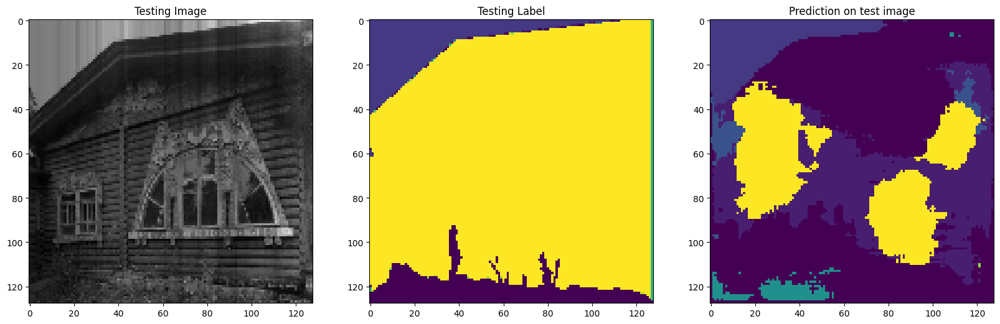

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 2 3 9]


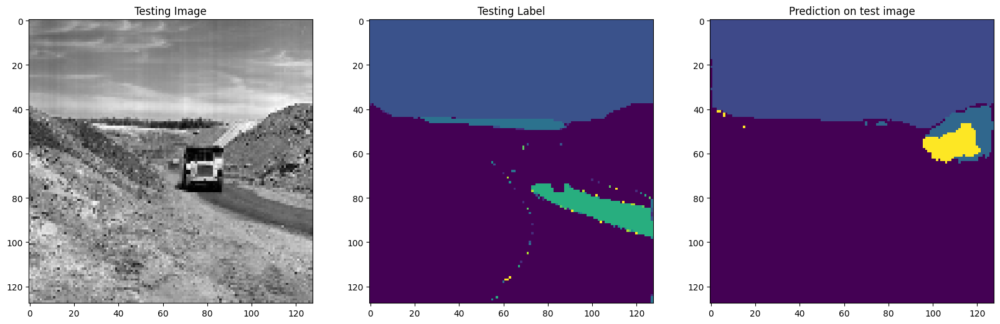

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  2  3  6  8  9 12]
Unique Classes in predicted taesting image  [0 2 3]


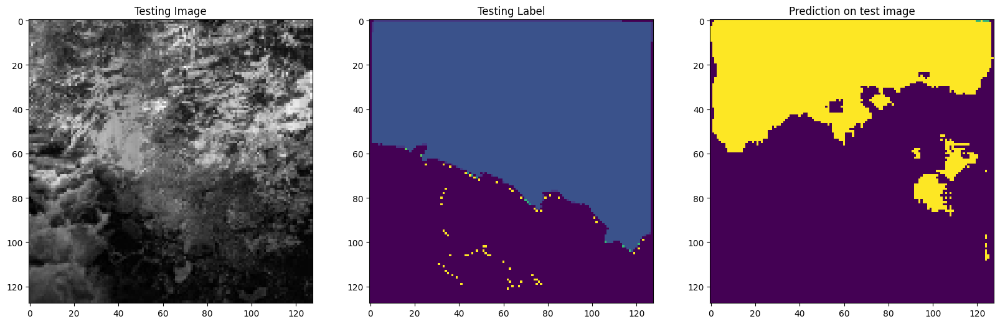

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4 11 13]
Unique Classes in predicted taesting image  [0 4]


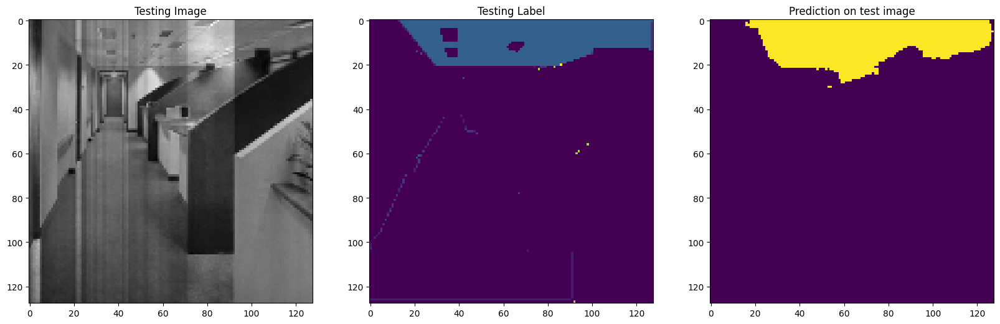

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 4]


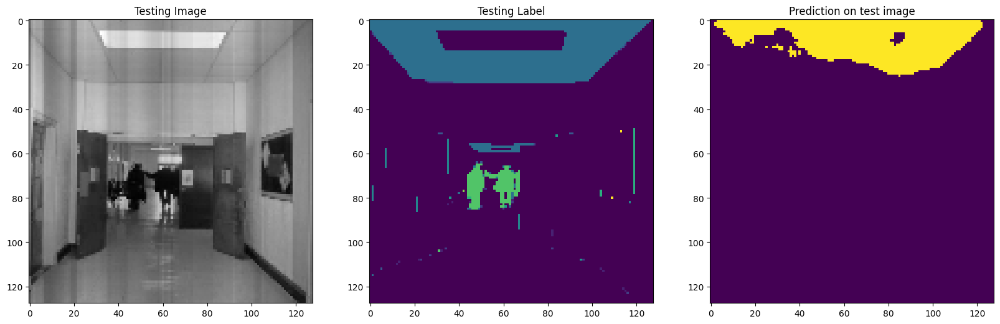

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 4]


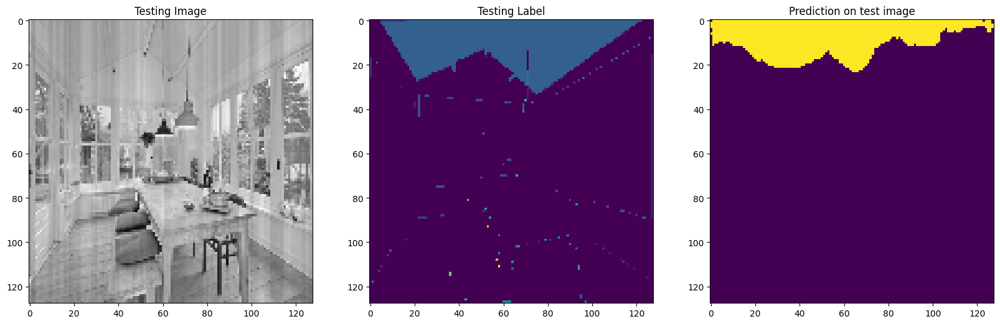

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2 5]


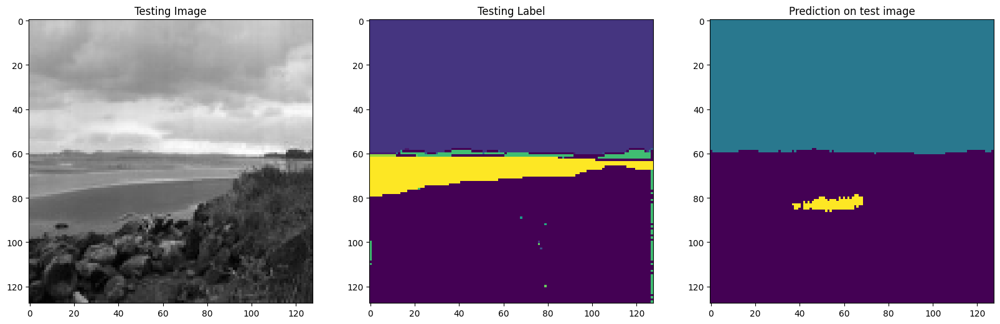

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  4  5  6  8  9 13]
Unique Classes in predicted taesting image  [0 2 3 9]


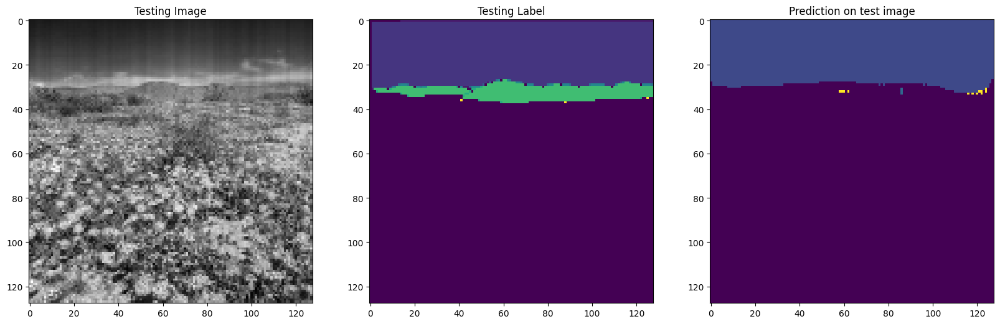

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [0 4 8]


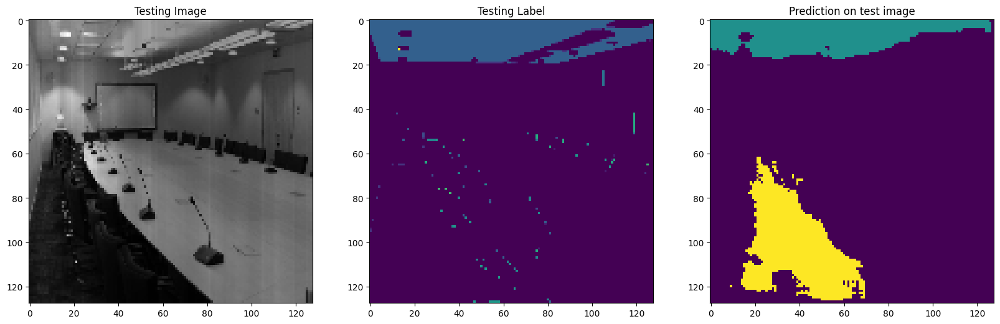

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11 12 13]
Unique Classes in predicted taesting image  [0 2 4 8]


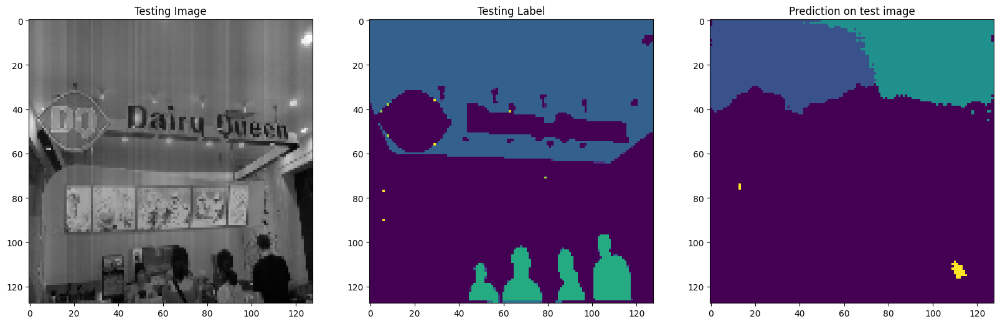

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [0 4 8]


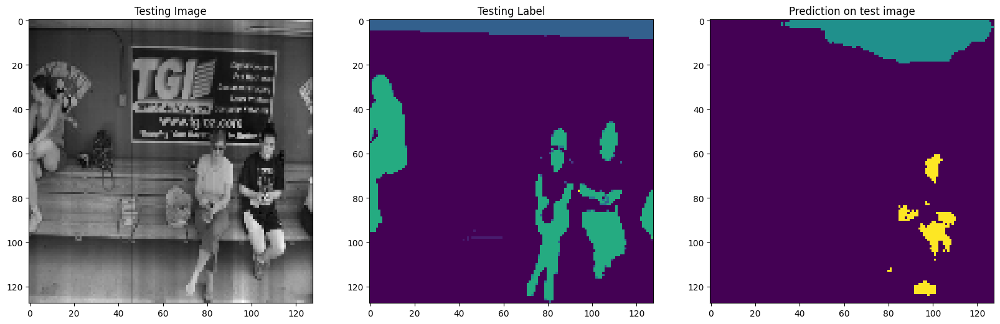

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [ 0  1  4 10]


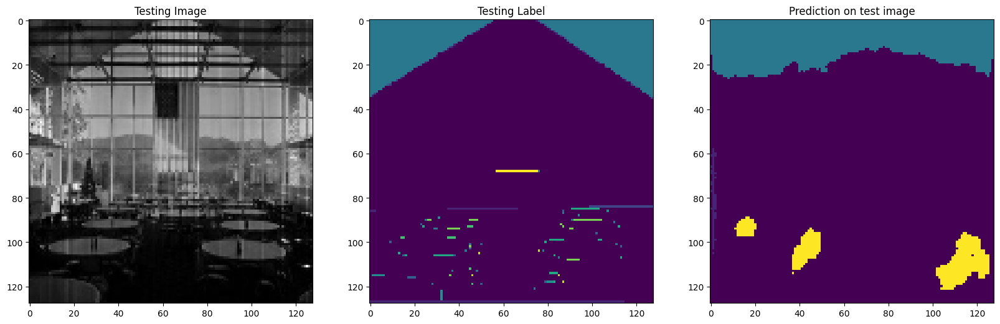

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 13]
Unique Classes in predicted taesting image  [0 2 4 8]


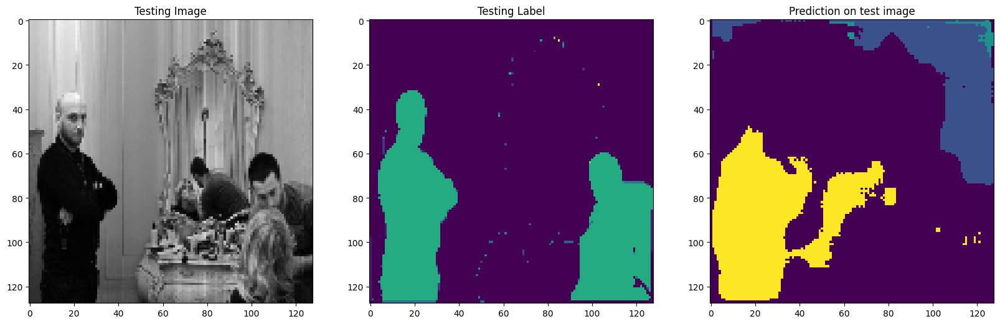

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4 8]


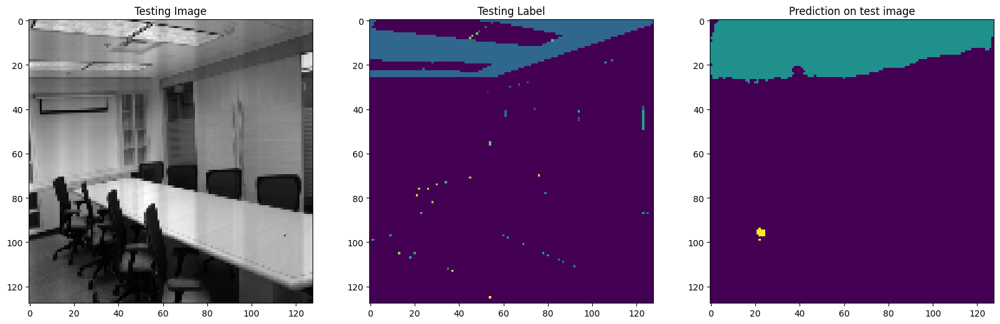

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 4]


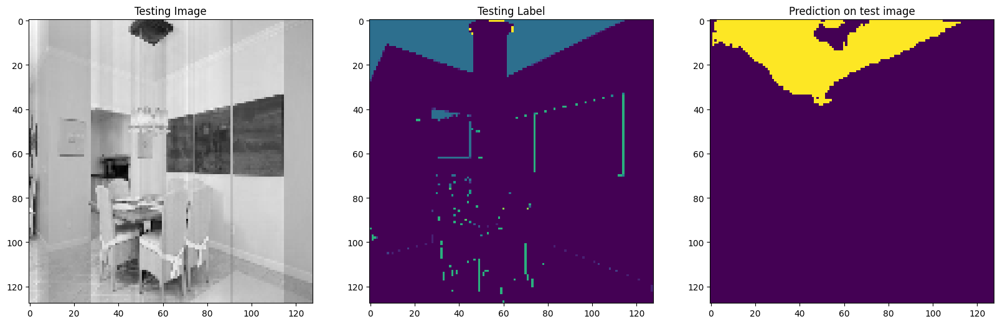

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 7]
Unique Classes in predicted taesting image  [0 4]


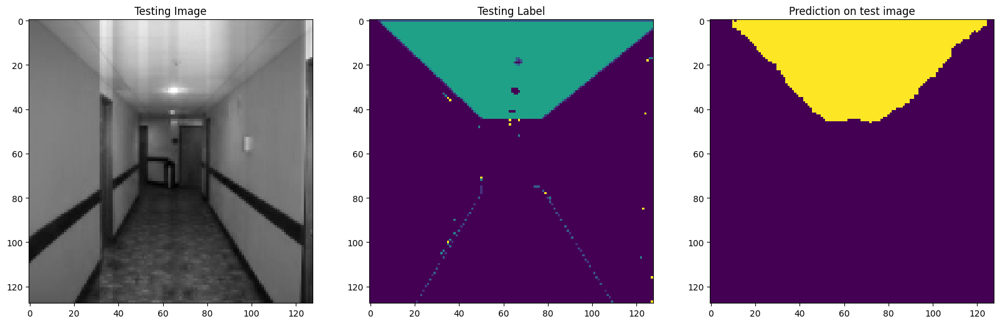

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 11 12]


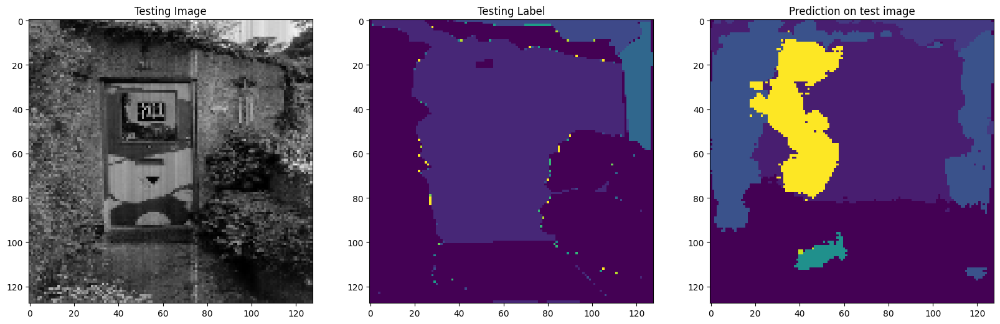

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  5  6  9 11 13]


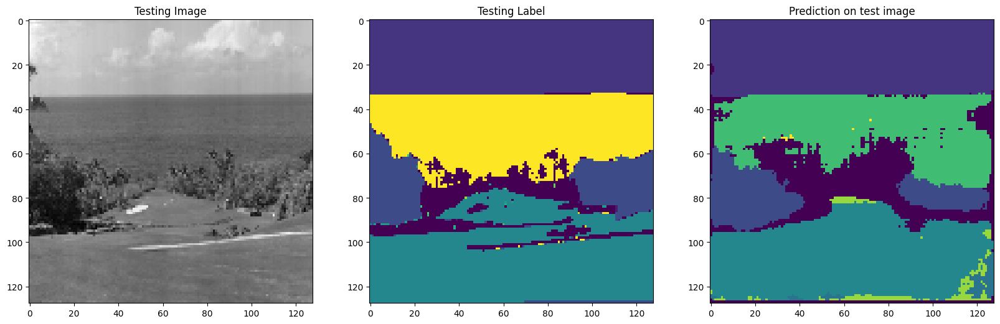

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  3  9 11]


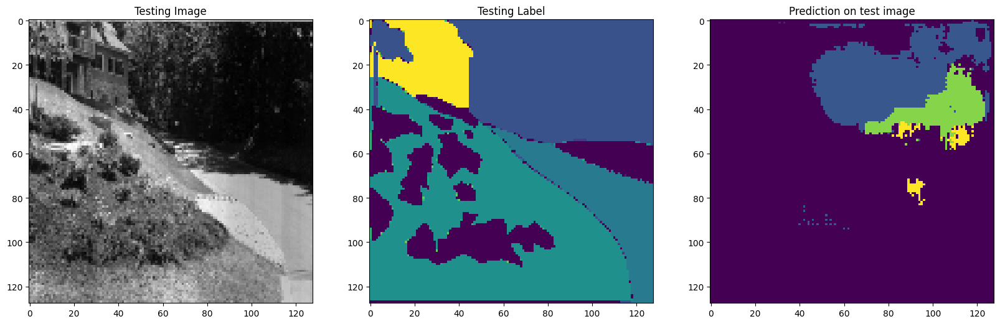

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 8]


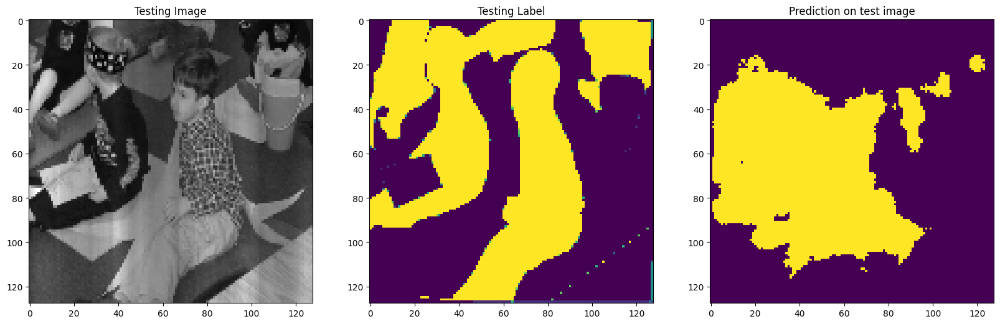

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  7 10]


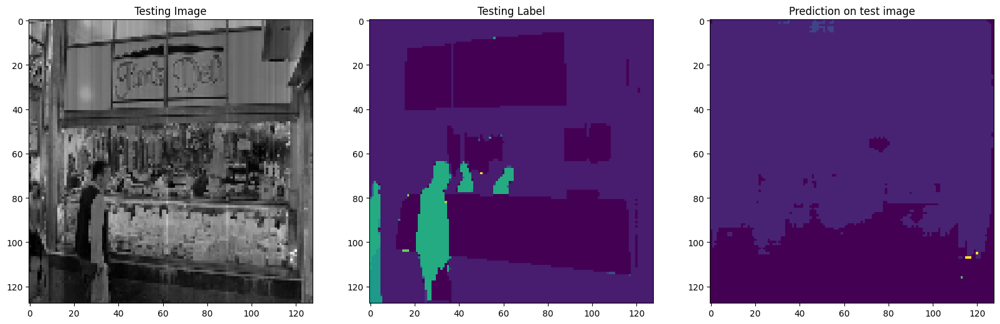

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7 11 12]
Unique Classes in predicted taesting image  [0 4]


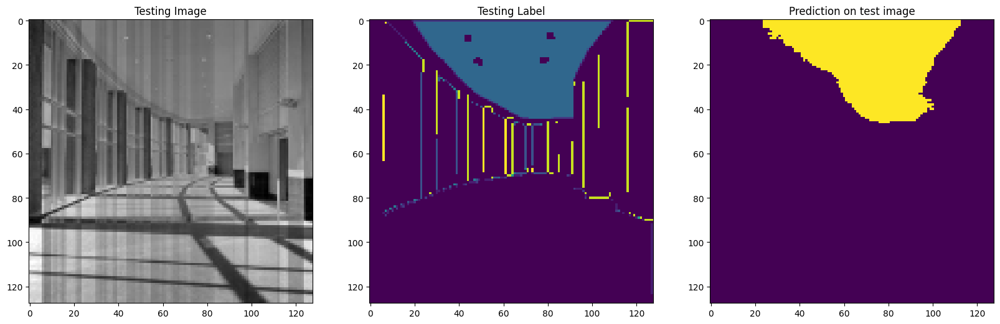

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 4]


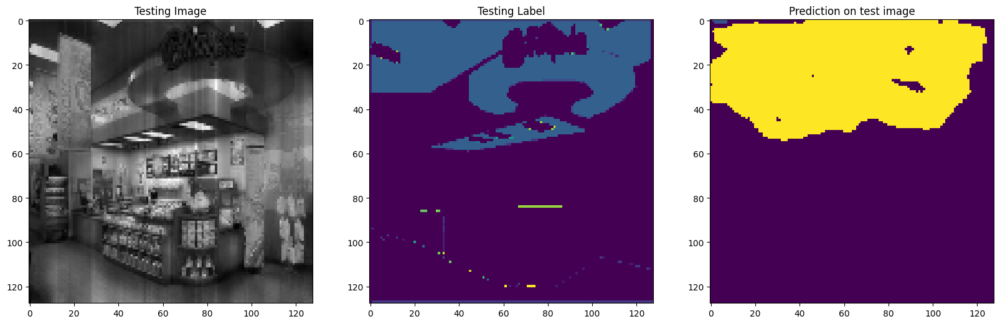

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8 9]
Unique Classes in predicted taesting image  [ 0  1  2  5  9 11]


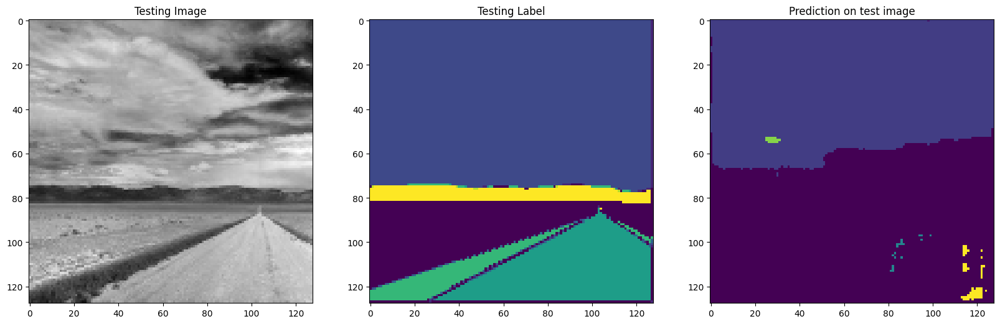

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  7 10 11 12]


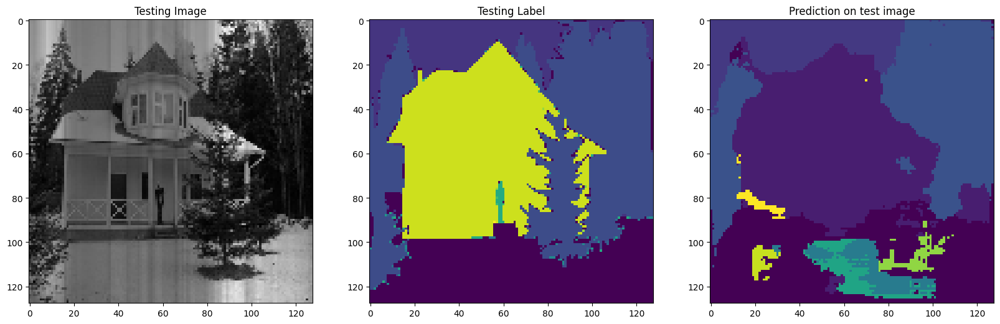

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  9 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  6  9 11]


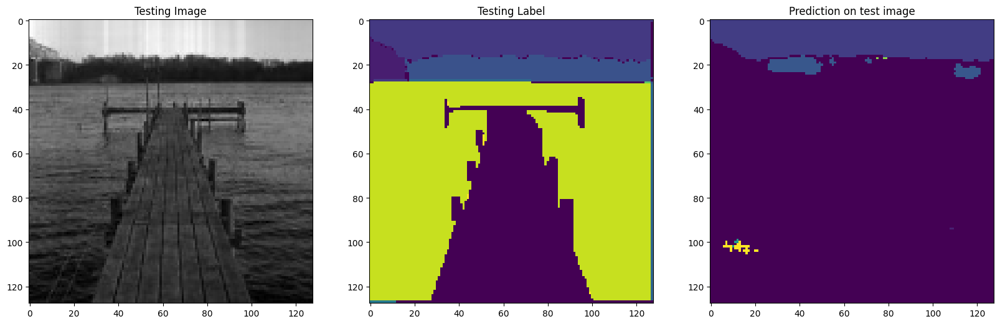

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [ 0  2  3  6  9 11]


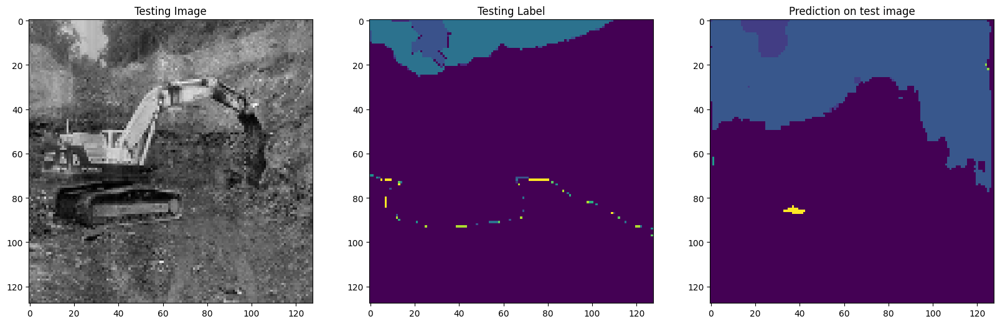

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  7  8  9 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  7 11]


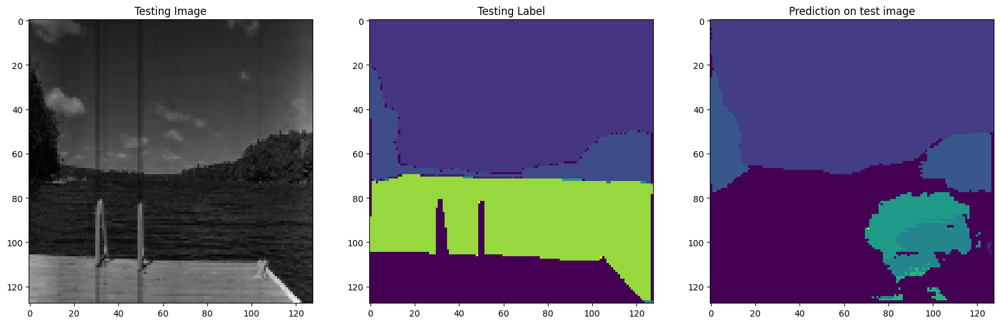

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 12 13]
Unique Classes in predicted taesting image  [0 2 3 6]


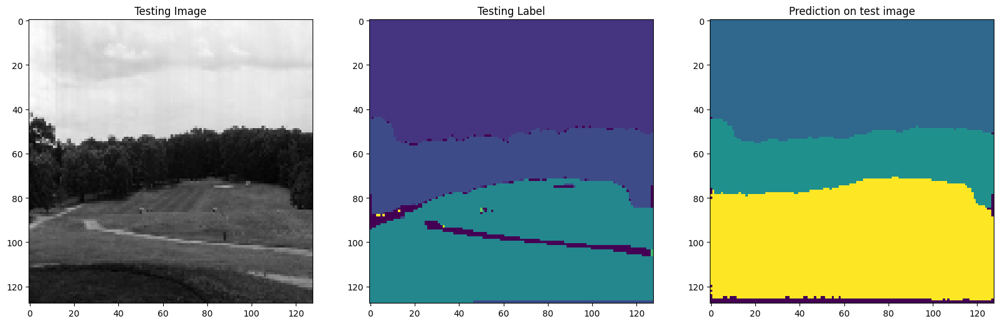

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [ 0  1  4 10]


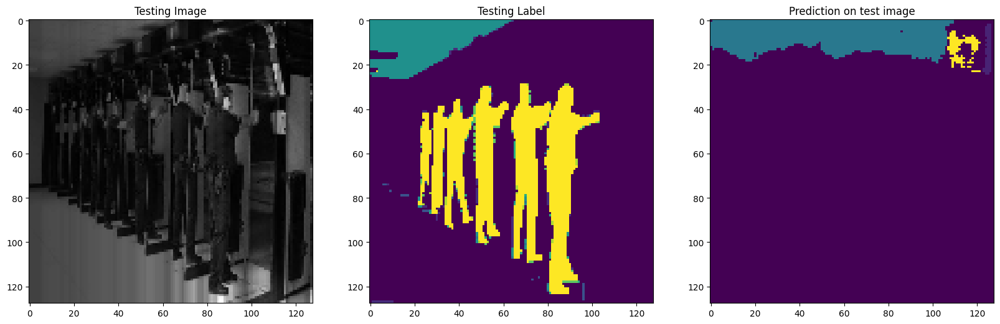

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [0 1 2 4 5 6 8 9]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 11 12]


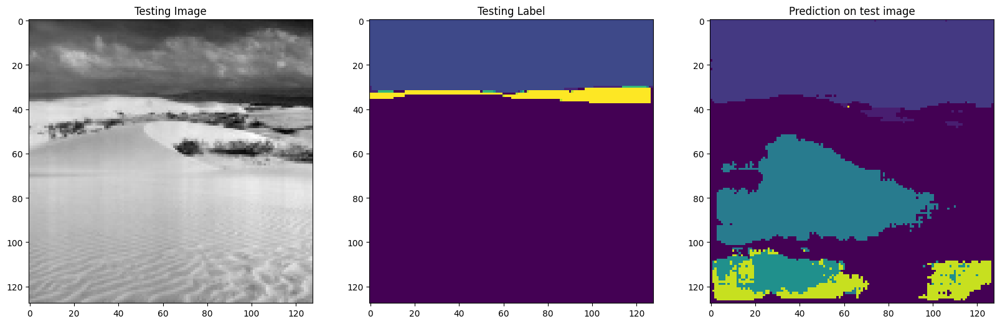

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2 4 8]


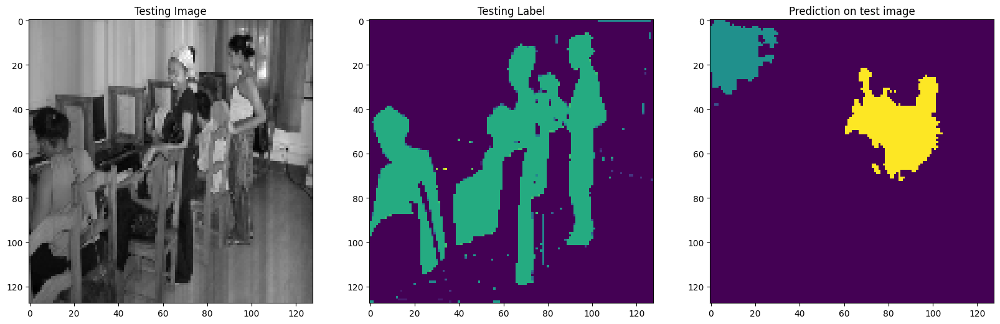

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [0 1]
Unique Classes in predicted taesting image  [ 0  1 10]


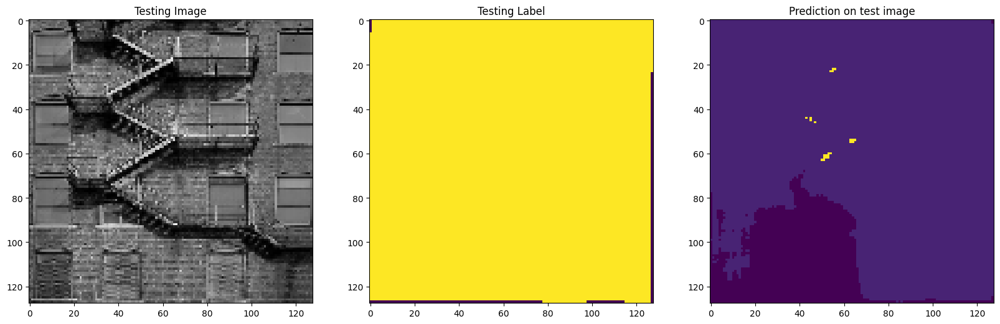

1/1 [==============================] - 0s 32ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  4  5  6  7 11]


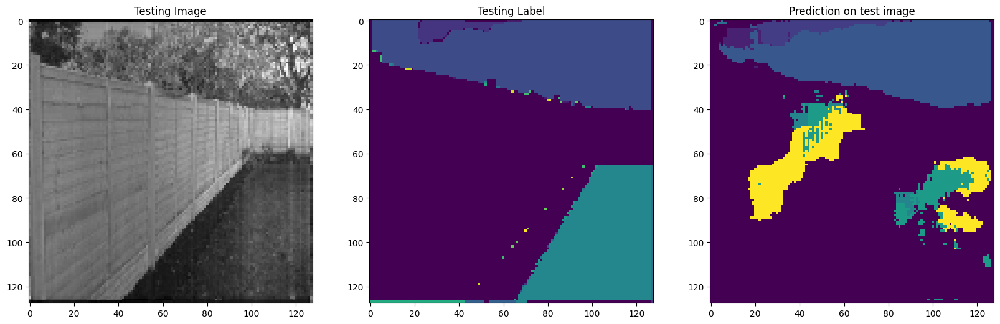

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 4]


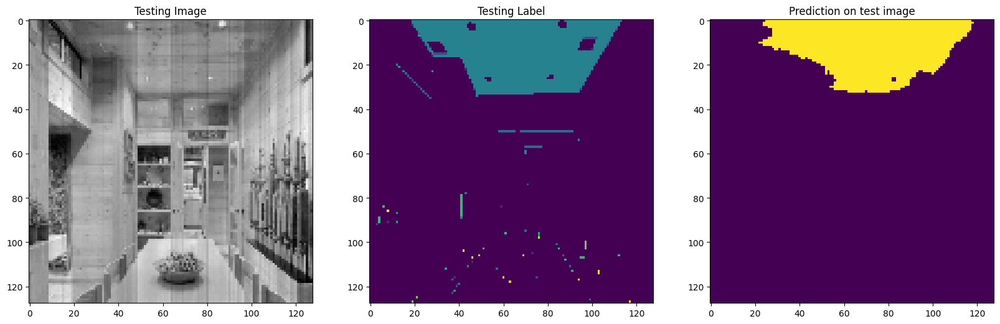

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  8  9 10 13]
Unique Classes in predicted taesting image  [0 1 2 3 9]


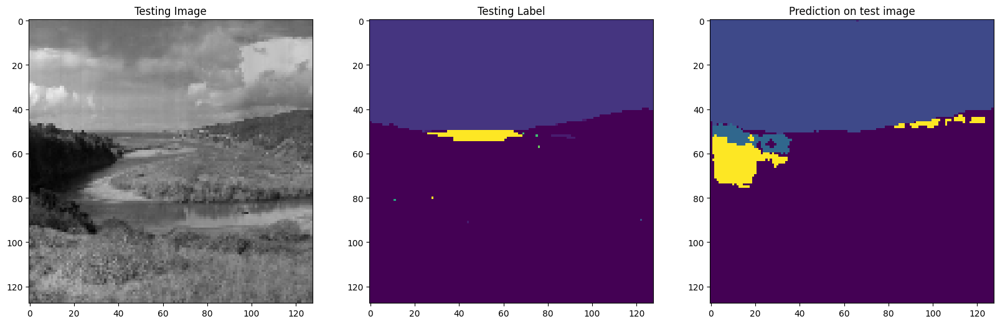

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4]
Unique Classes in predicted taesting image  [0 4]


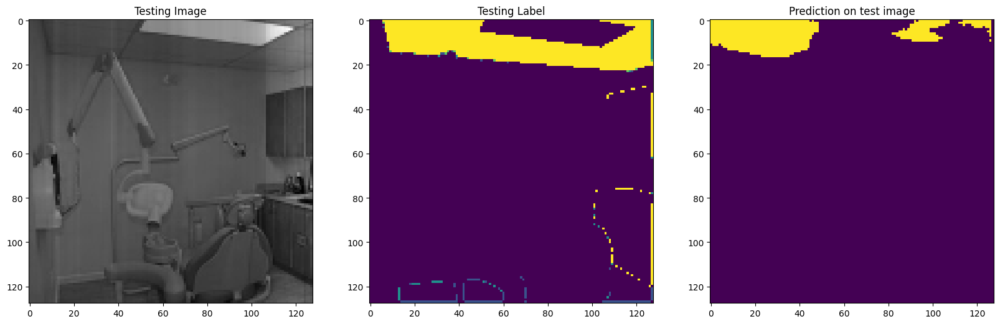

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 13]
Unique Classes in predicted taesting image  [0 4]


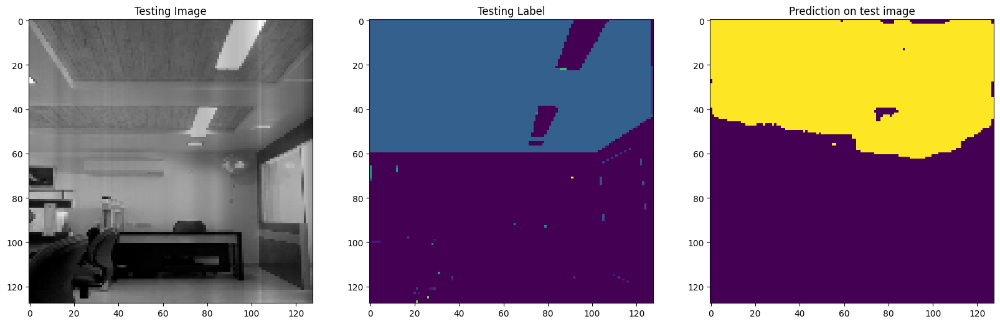

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3 10]


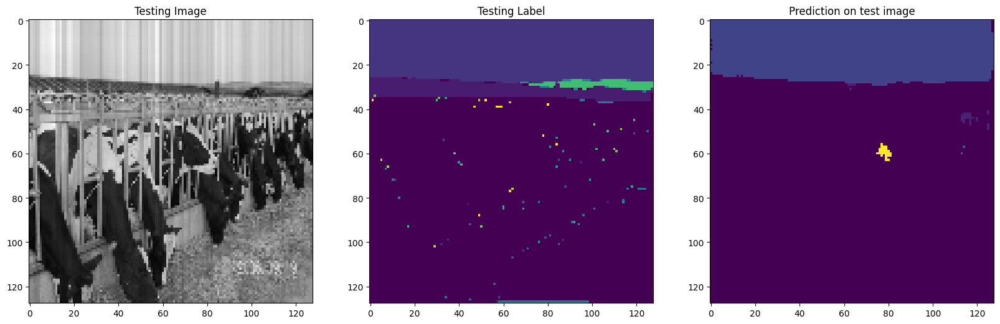

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 4 5 7]


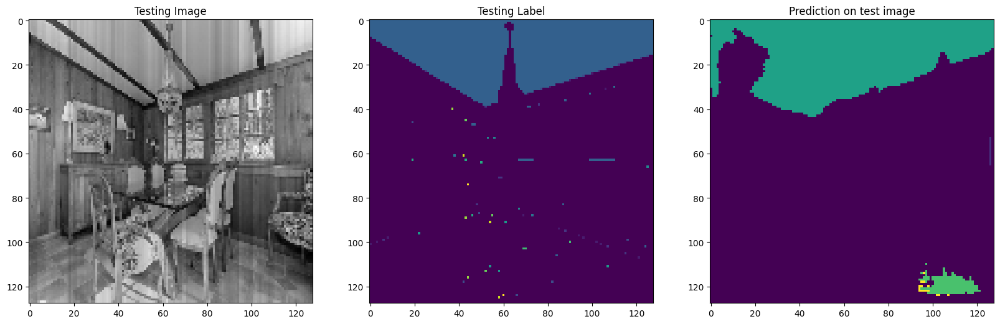

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 4]


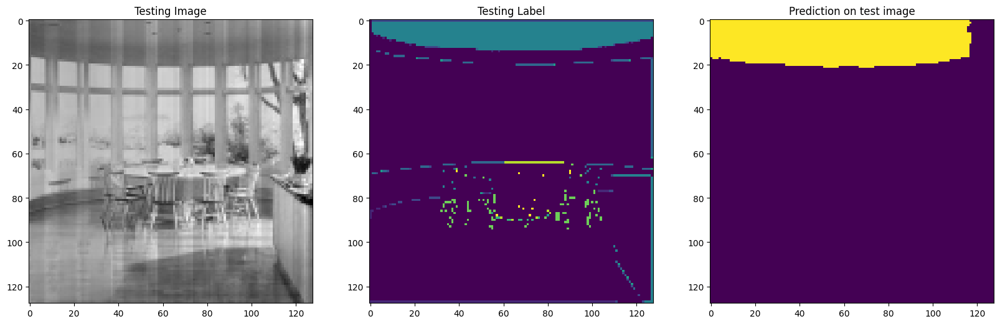

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  6 11]


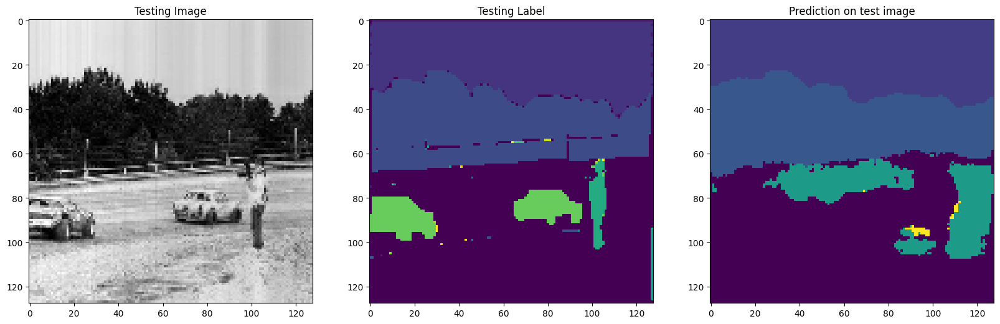

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 4]


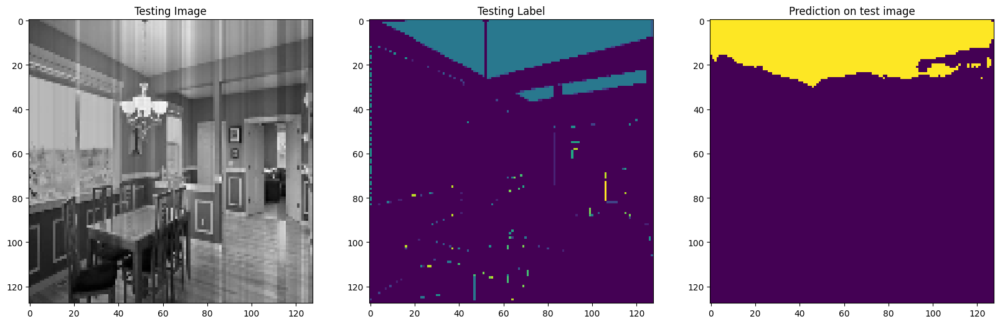

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 8]


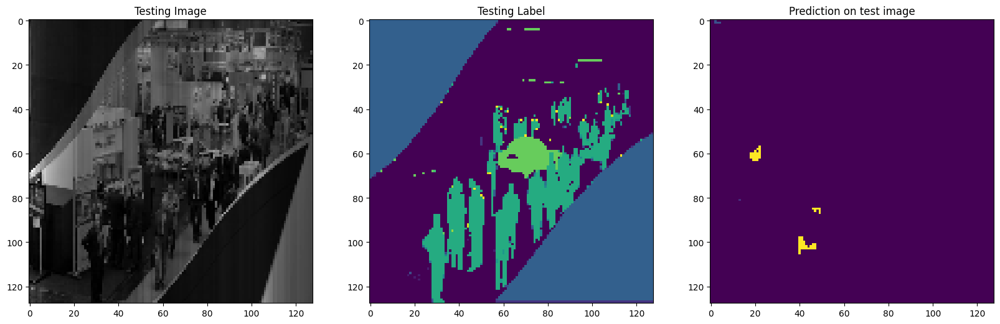

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  5  7 12]


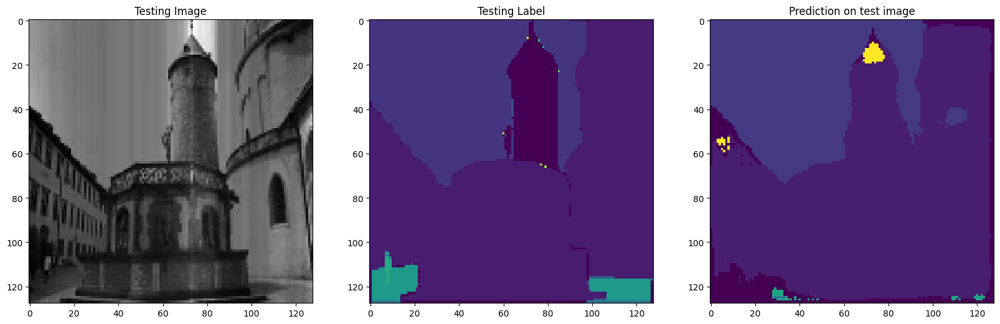

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 5 7]


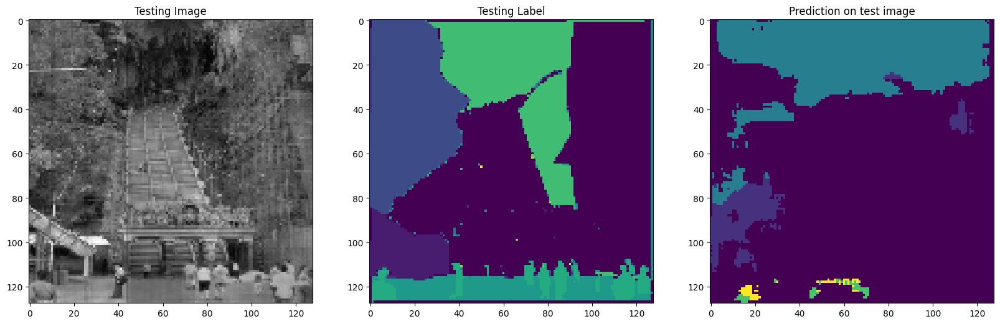

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4 8]


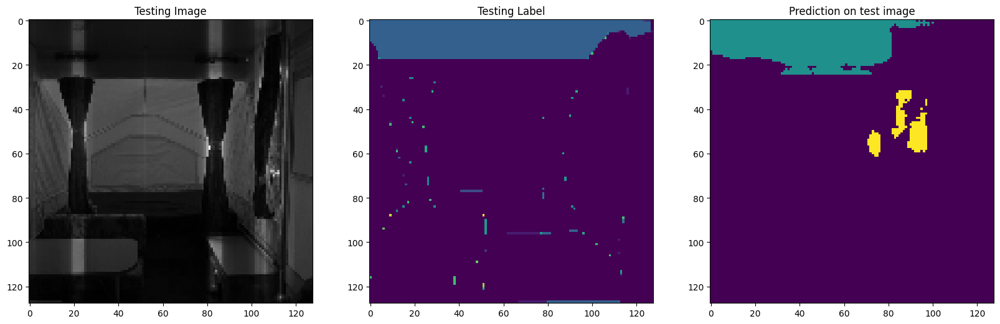

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 4]


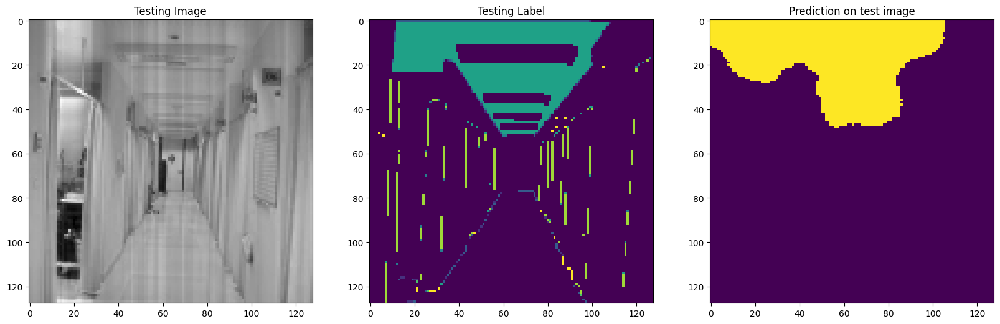

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  7 10 11]
Unique Classes in predicted taesting image  [0 4]


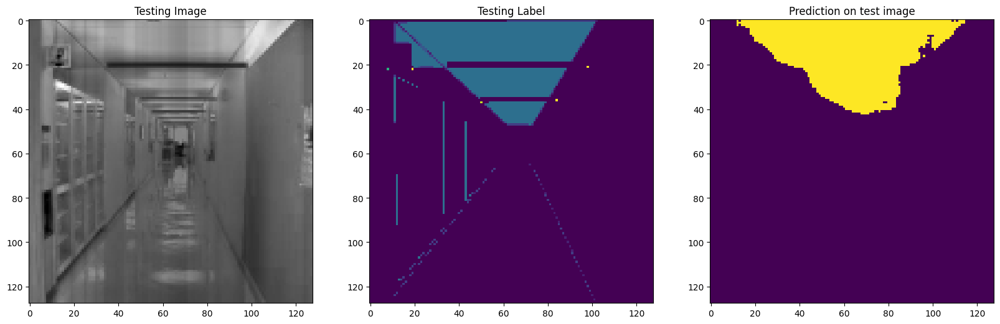

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4 8]


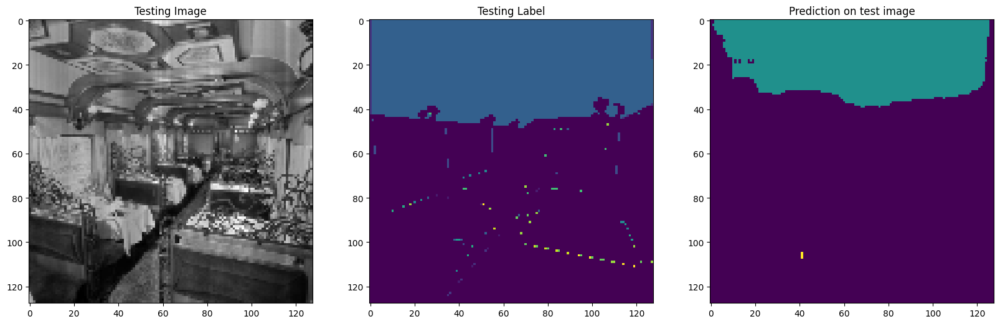

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


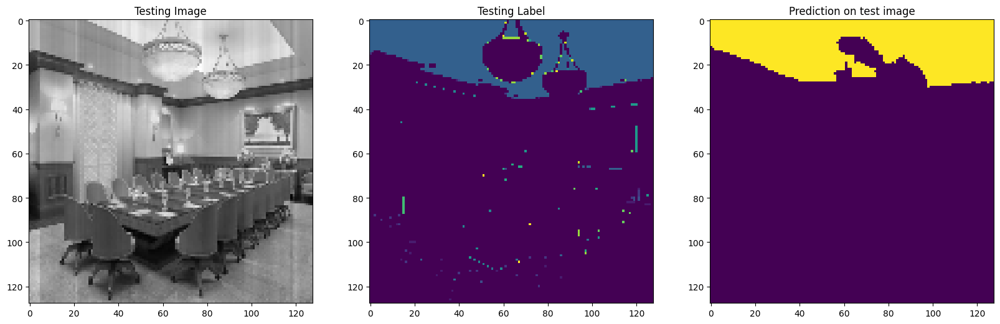

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  6  7  8 11 12]
Unique Classes in predicted taesting image  [0 1 2 3 9]


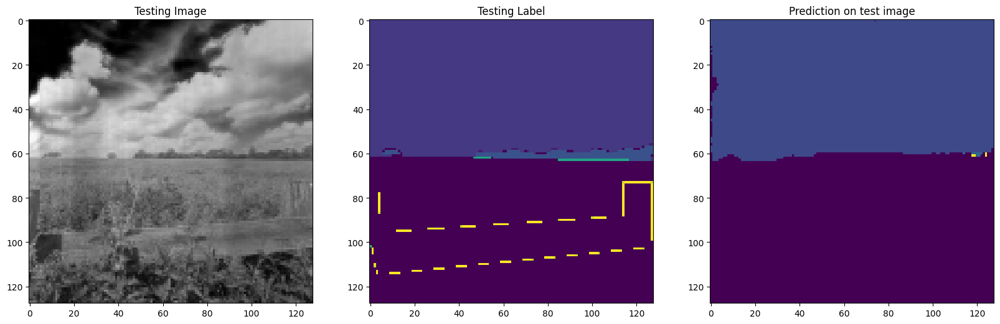

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 11 12 13]
Unique Classes in predicted taesting image  [ 0  4  8 10]


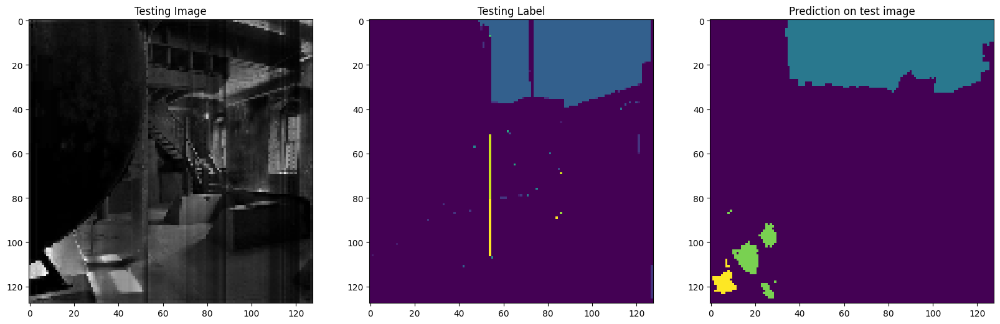

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  2  3 12]
Unique Classes in predicted taesting image  [ 0  2  3  6  9 11]


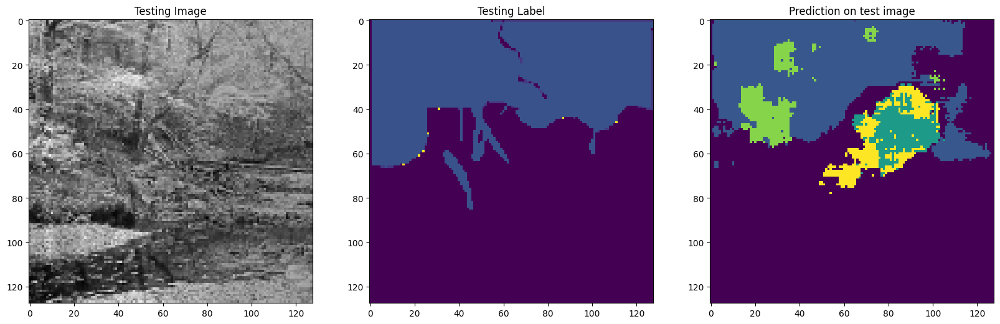

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  7 10]


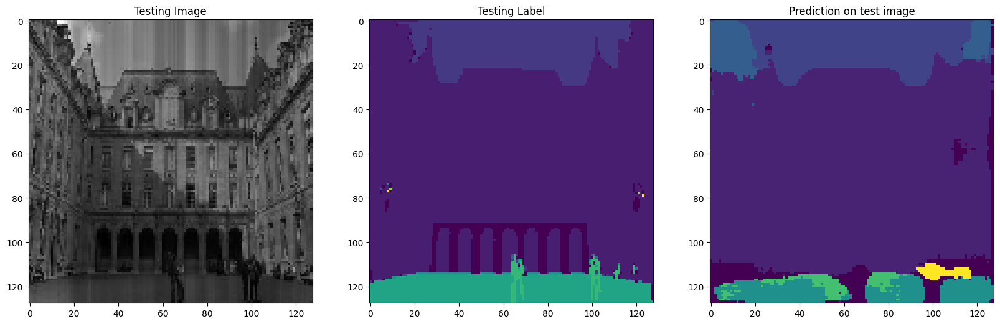

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  7 13]
Unique Classes in predicted taesting image  [0 4]


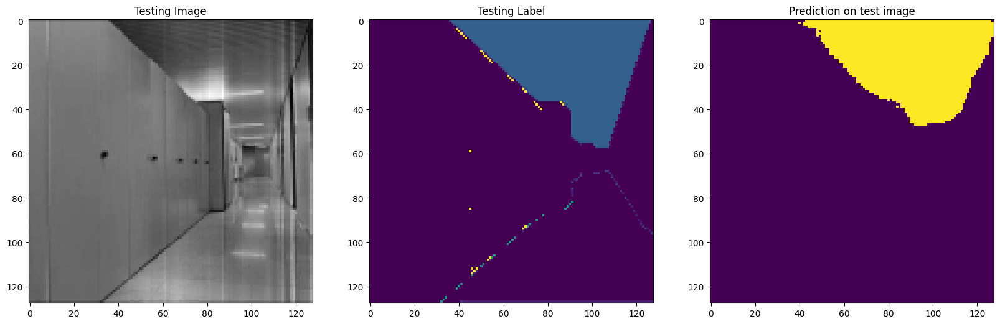

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [ 0  1  2  3  4  5  6  7 10 11 12]


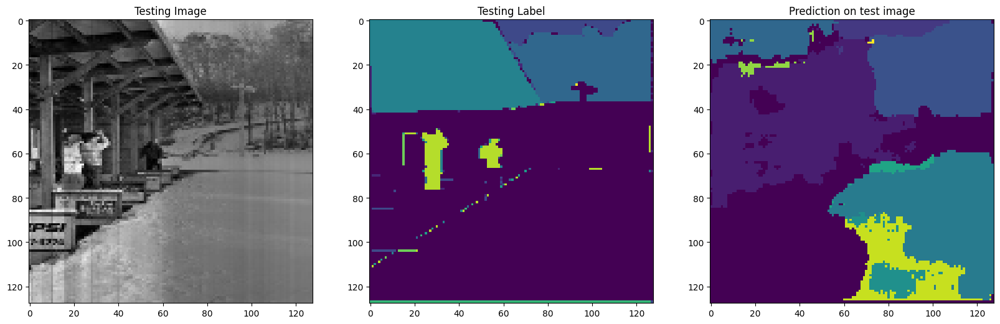

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4 8]


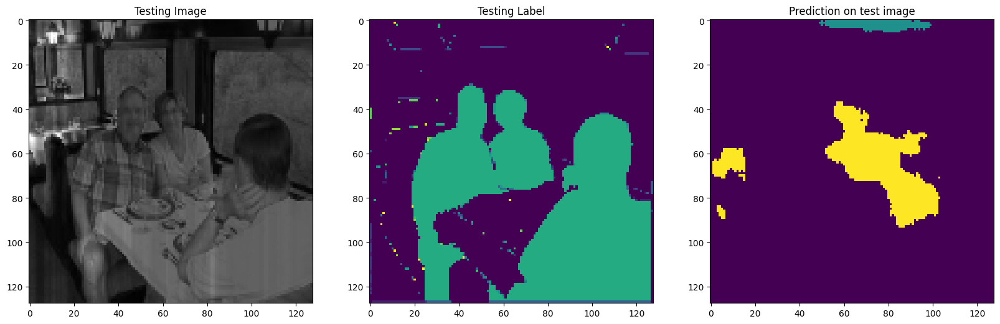

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [ 0  3  5  6 11]


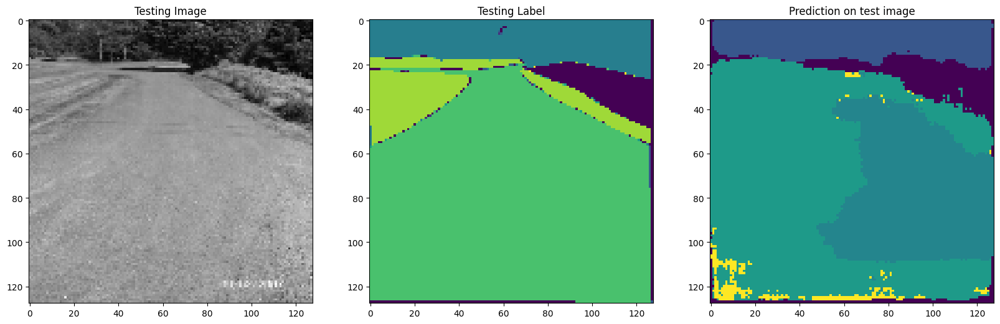

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  7 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3 12]


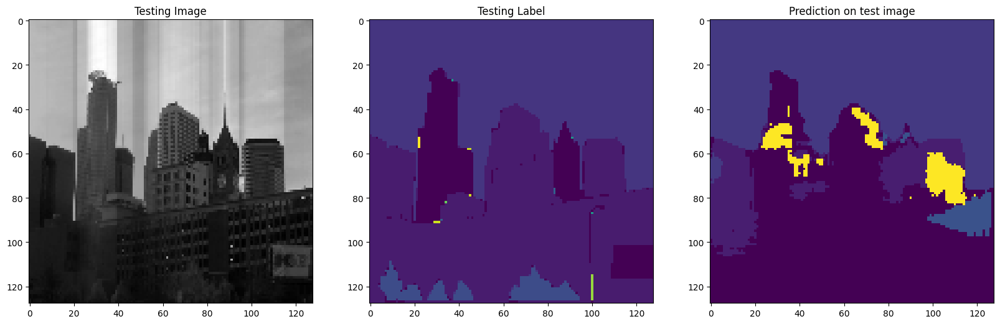

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  2  3  5  6  9 11]


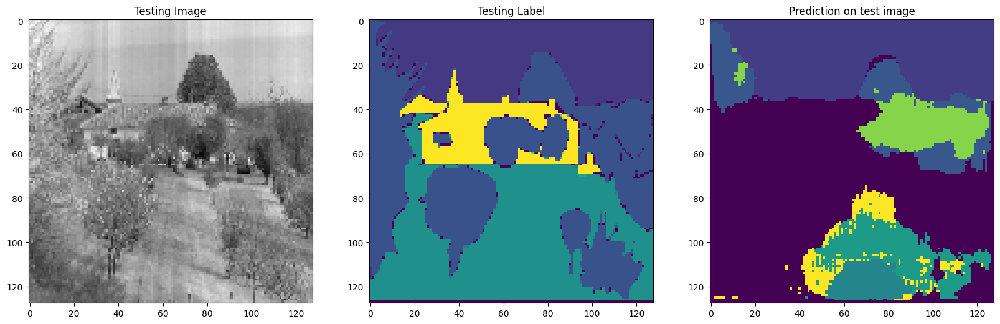

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 4]


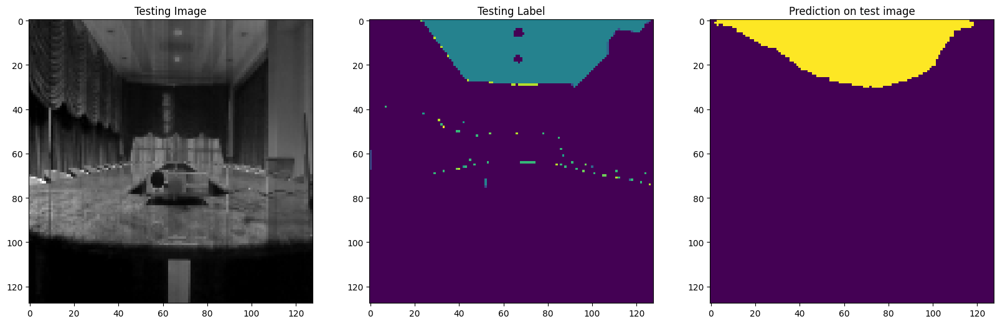

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12]
Unique Classes in predicted taesting image  [0 4]


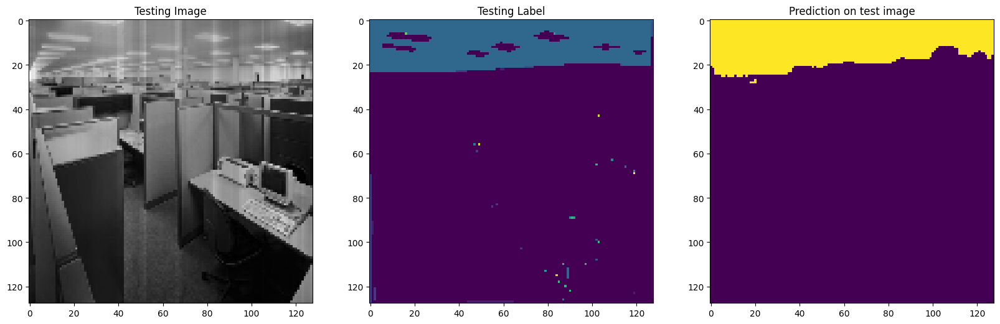

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2]
Unique Classes in predicted taesting image  [0 1 2 5 7]


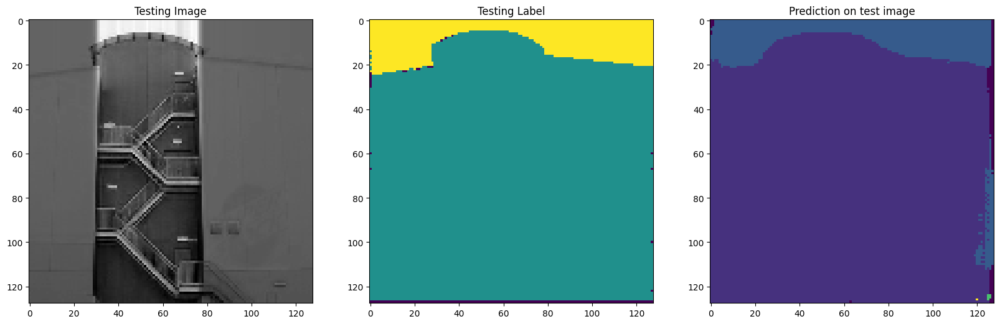

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 4]


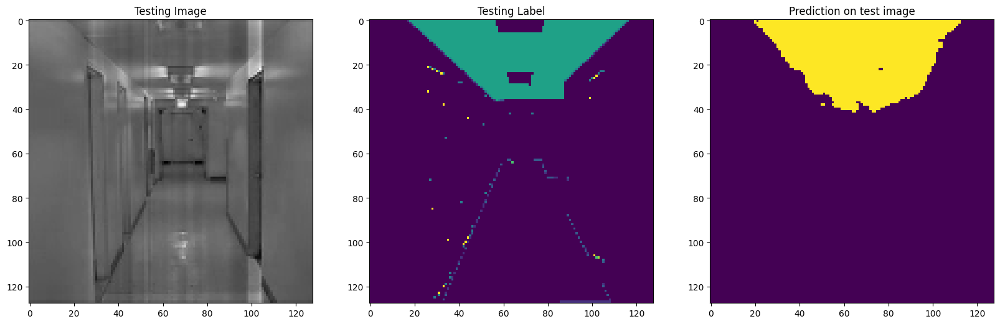

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 4]


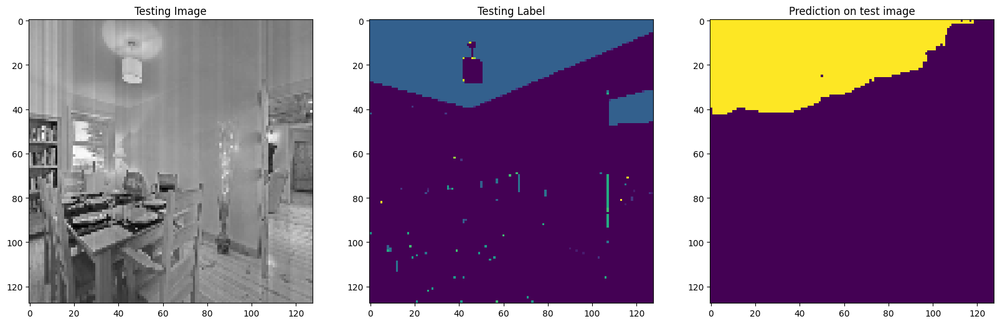

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 4]


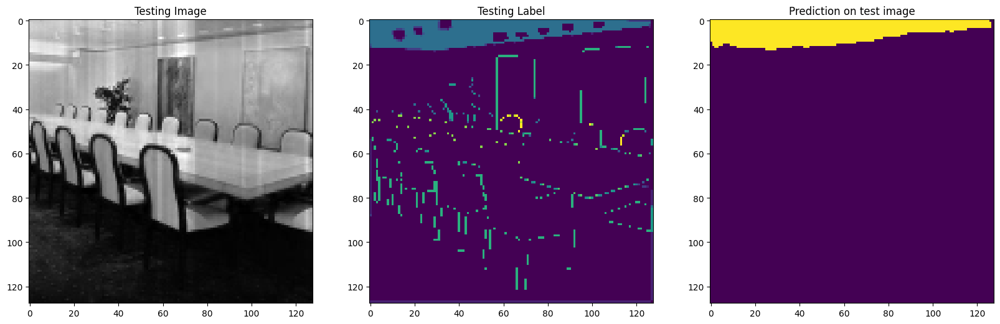

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 4]


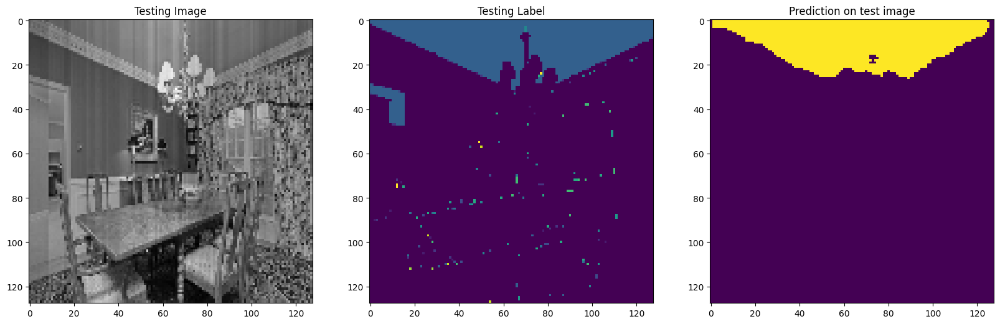

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5]
Unique Classes in predicted taesting image  [0 4]


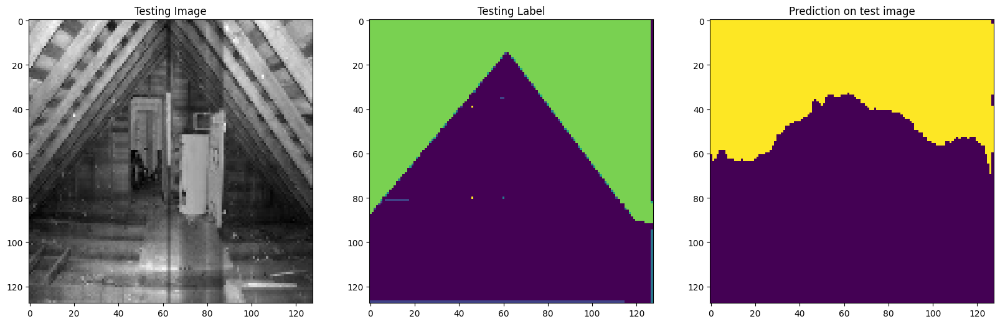

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  4  6 11]


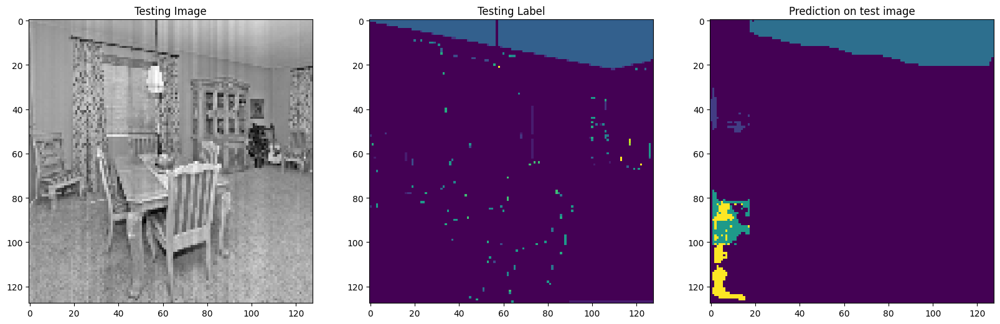

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12]
Unique Classes in predicted taesting image  [0 4]


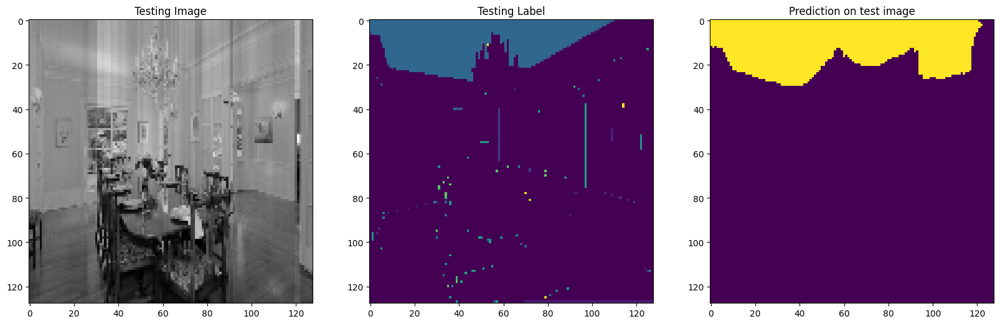

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7 12]
Unique Classes in predicted taesting image  [0 1 2 4 5 7]


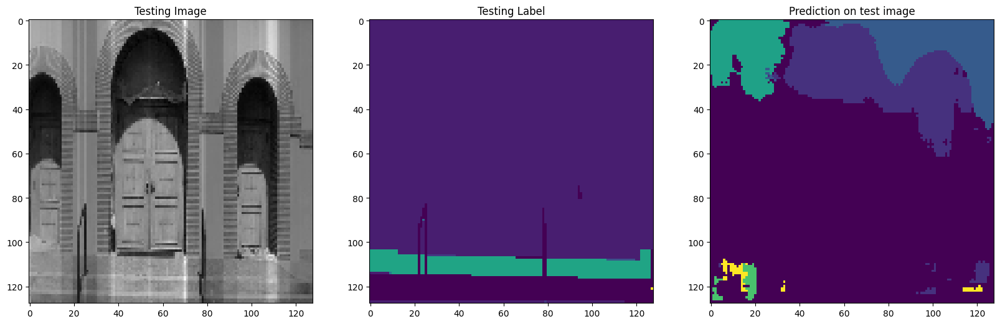

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


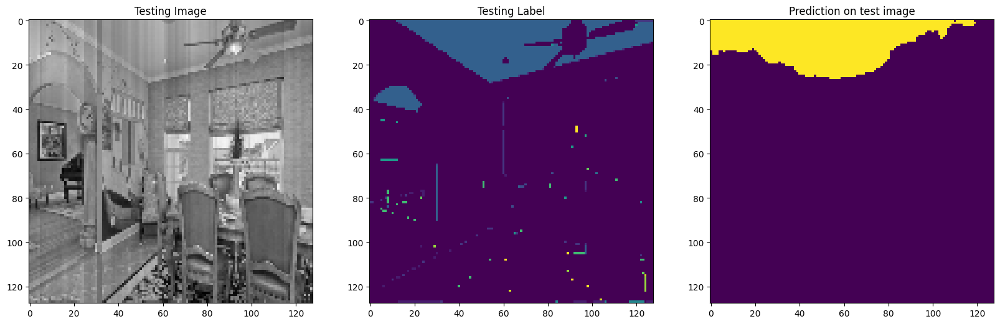

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  7  9 11 12]


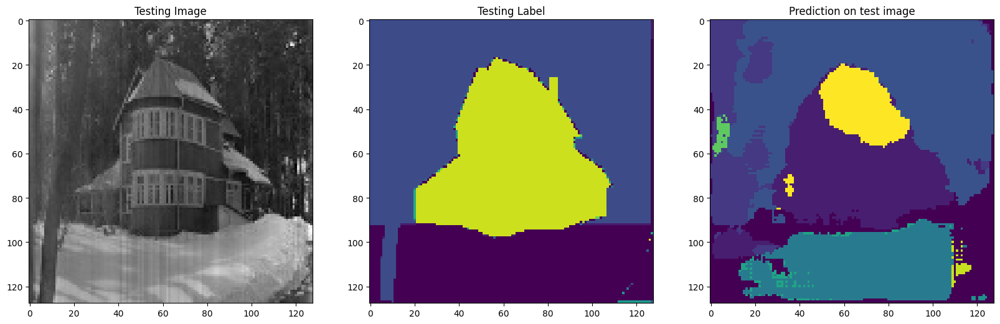

In [453]:
#Generating masks for all the test data set
for test_img_number in range(X_test.shape[0]):
  test_img = X_test[test_img_number]
  ground_truth=y_test[test_img_number]
  test_img_norm=test_img[:,:,0][:,:,None]
  test_img_input=np.expand_dims(test_img_norm, 0)
  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  print("Unique Classes in Testing Image ",np.unique(ground_truth[:,:,0]))
  print("Unique Classes in predicted taesting image ",np.unique(predicted_img))
    
  plt.figure(figsize=(20, 20))
  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_img[:,:,0], cmap='gray')
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(ground_truth[:,:,0])
  
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(predicted_img, )
    
 
  plt.show()




In [454]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 26ms/step


[0 2 5]
[0 1 2 3 4 5 6 7 8 9]


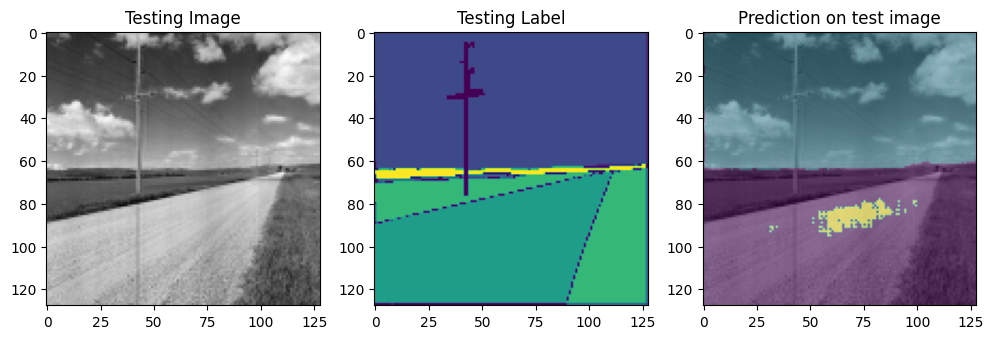

In [455]:
print(np.unique(predicted_img))
print(np.unique(ground_truth[:,:,0]))
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], )
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.imshow(predicted_img,alpha=0.5)
plt.show()


In [458]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 32ms/step


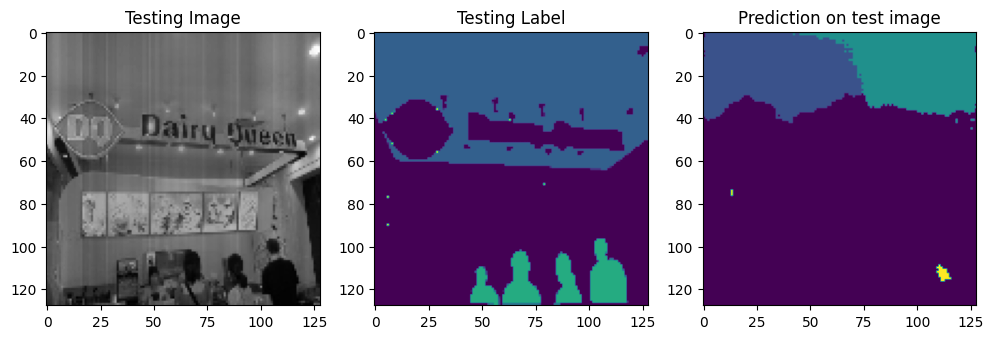

In [459]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img)
plt.show()


In [460]:
#Predict on a few images
#model = get_model()
#model.load_weights('/kaggle/input/unet/tensorflow2/unet1/1/UNET_test_acc0.94_val0.73.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]



1/1 [==============================] - 0s 23ms/step


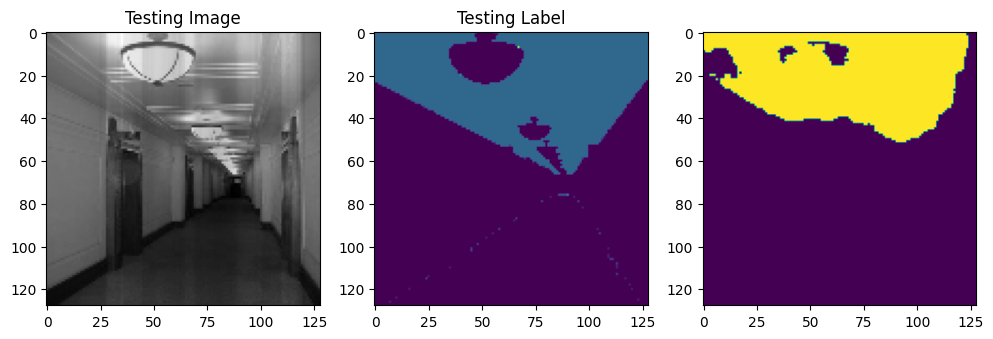

In [461]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')

plt.imshow(ground_truth[:,:,0])
plt.subplot(233)

plt.imshow(predicted_img)
plt.show()


In [133]:
before = [ 0 , 2,  3 , 5 , 6 , 7 ,10, 12 ,13, 17, 21, 22, 26 ,27]
after = [ 0 , 1 , 2 , 3,  4 , 5 , 6,  7 , 8,  9, 10, 11, 12, 13]

In [332]:
class_encoding = {}
for i in range(len(after)):
    class_encoding[after[i]] = before[i]

In [135]:
class_encoding={0: 0,
 1: 2,
 2: 3,
 3: 5,
 4: 6,
 5: 7,
 6: 10,
 7: 12,
 8: 13,
 9: 17,
 10: 21,
 11: 22,
 12: 26,
 13: 27}

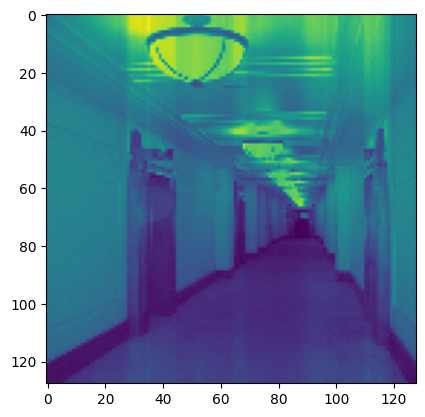

In [462]:
plt.imshow(test_img)

In [463]:
class_label_en = {
0: 'sky',
 1: 'tree',
 2: 'ceiling',
 3: 'building',
 4: 'person',
 5: 'road;route',
 6: 'car',
 7: 'sidewalk',
 8: 'grass',
 9: 'mountain',
 10: 'water',
 11: 'house',
 12: 'sea'}

class_colors_en = {
    0: (6, 230, 230),          
   1: (4, 200, 3),    
    2: (20, 120, 80),    
   3: (80, 120, 120),      
    4: (150, 5, 61),              
    5: (140, 140, 140),     
    6: (0, 102, 200), 
    7: (235, 255, 7),             
    8: (4, 250, 7),            
    9: (143, 255, 140),  
    10: (61, 230, 250),
    11:(255, 9, 224),
    12:(9, 7, 230) 
   
}      

In [464]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors_en.values())
for class_label, color in class_colors_en.items():
    rgb_image[predicted_img == class_label] = color
    

In [336]:
rgb_image.shape

(128, 128, 3)

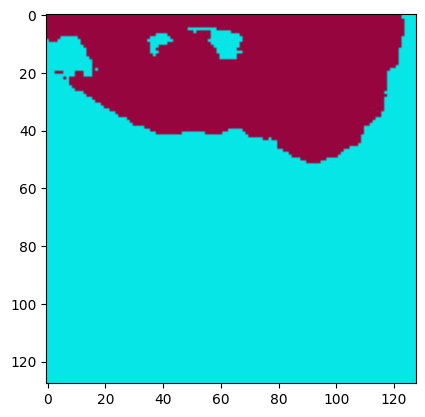

In [465]:
plt.imshow(rgb_image)

In [466]:
np.unique(rgb_image)

array([  5,   6,  61, 150, 230])

In [467]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [468]:
image_name = u'/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00004012.jpg'
image = load_images_bw(image_name)
train_images = np.array(image[:,:,0])
train_images = np.expand_dims(train_images, axis=2)
train_images = normalize(train_images,axis=1)#

In [469]:
test_img_norm=train_images
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 27ms/step


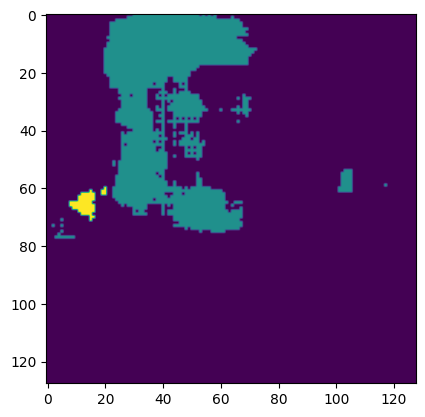

In [470]:
plt.imshow(predicted_img)

In [471]:
np.unique(predicted_img)

array([0, 1, 2])

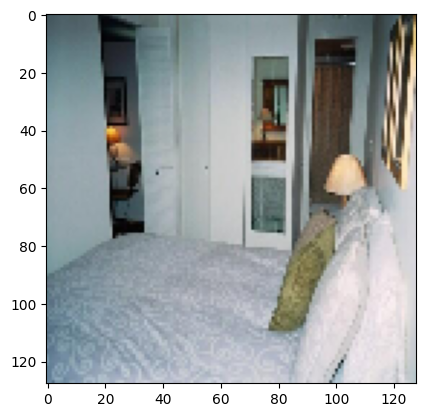

In [472]:
plt.imshow(image)

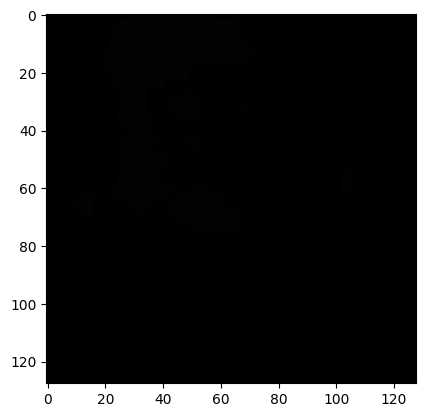

In [473]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)

for encoded, before_encode in class_encoding.items():
    rgb_image[predicted_img == encoded] = before_encode
plt.imshow(rgb_image,cmap='jet')

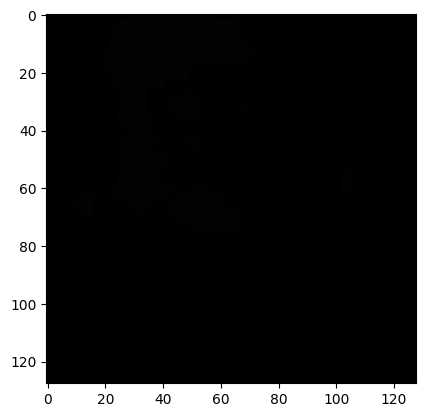

In [474]:
plt.imshow(rgb_image)

In [381]:
rgb_image.shape

(128, 128, 3)

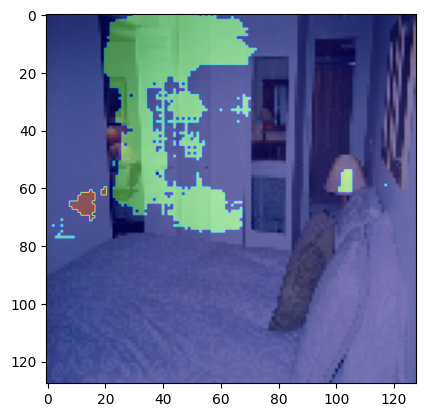

In [475]:
# Apply colors to the mask based on class labels
output = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors.values())
for class_label, color in class_colors.items():
    output[predicted_img == class_label] = color  
plt.imshow(image,cmap='gray') 
plt.imshow(predicted_img, alpha=0.5,cmap='jet') # interpolation='none'


# Save the image shown in subplot (222)
plt.savefig('prediction_with_mask.png')  # Save the figure as an image file

-++
